In [1]:
# import Librariy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns',None)                        
import warnings
warnings.filterwarnings('ignore')
import scipy.stats as stats
%matplotlib inline
import nltk
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings("ignore")

**loading the data**









In [2]:
df = pd.read_csv('housing_data.csv')
df

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,0,SC60,RL,65,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,1,SC20,RL,80,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No,No,No,0,May,2007,WD,Normal,181500
2,2,SC60,RL,68,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No,No,No,0,Sep,2008,WD,Normal,223500
3,3,SC70,RL,60,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No,No,No,0,Feb,2006,WD,Abnorml,140000
4,4,SC60,RL,84,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No,No,No,0,Dec,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,

**cleaining and preprocessing**

In [3]:
df.shape

(1460, 81)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     1460 non-null   int64  
 1   MSSubClass     1460 non-null   object 
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   int64  
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
df.tail()

,Unnamed: 0,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1455,1455,SC60,RL,62,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,No,No,No,0,Aug,2007,WD,Normal,175000
1456,1456,SC20,RL,85,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,No,MnPrv,No,0,Feb,2010,WD,Normal,210000
1457,1457,SC70,RL,66,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,No,GdPrv,Shed,2500,May,2010,WD,Normal,266500
1458,1458,SC20,RL,68,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,Y,FuseA,1078,0,0,1078,1,0,1,0,2,1,Gd,5,Typ,0,No,Attchd,1950.0,Unf,1,240,TA,TA,Y,366,0,112,0,0,0,No,No,No,0,Apr,2010,WD,Normal,142125
1459,1459,SC20,RL,75,9937,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,6,1965,1965,Gable,CompShg,HdBoard,HdBoard,NaN,0,Gd,TA,CBlock,TA,TA,No,BLQ,830,LwQ,290,136,1256,GasA,Gd,Y,SBrkr,1256,0,0,1256,1,0,1,1,3,1,TA,6,Typ,0,No,Attchd,1965.0,Fin,1,276,TA,TA,Y,736,68,0,0,0,0,No,No,No,0,Jun,2008,WD,Normal,147500


In [6]:
df.all()

Unnamed: 0       False
MSSubClass        True
MSZoning          True
LotFrontage      False
LotArea           True
                 ...  
MoSold            True
YrSold            True
SaleType          True
SaleCondition     True
SalePrice         True
Length: 81, dtype: bool

In [7]:
df.isnull().sum().iloc[0:60]

Unnamed: 0         0
MSSubClass         0
MSZoning           0
LotFrontage        0
LotArea            0
Street             0
Alley           1369
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType       872
MasVnrArea         0
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           0
BsmtCond           0
BsmtExposure       0
BsmtFinType1       0
BsmtFinSF1         0
BsmtFinType2       0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

In [8]:
df.isnull().sum().sum()

2323

In [9]:
# fillinf the missing value by using fillna function0                                                      
df = df.fillna(0) # all missing value 0 replace

In [10]:
# after filling missing value checking
df.isnull().sum().iloc[0:60]

Unnamed: 0      0
MSSubClass      0
MSZoning        0
LotFrontage     0
LotArea         0
Street          0
Alley           0
LotShape        0
LandContour     0
Utilities       0
LotConfig       0
LandSlope       0
Neighborhood    0
Condition1      0
Condition2      0
BldgType        0
HouseStyle      0
OverallQual     0
OverallCond     0
YearBuilt       0
YearRemodAdd    0
RoofStyle       0
RoofMatl        0
Exterior1st     0
Exterior2nd     0
MasVnrType      0
MasVnrArea      0
ExterQual       0
ExterCond       0
Foundation      0
BsmtQual        0
BsmtCond        0
BsmtExposure    0
BsmtFinType1    0
BsmtFinSF1      0
BsmtFinType2    0
BsmtFinSF2      0
BsmtUnfSF       0
TotalBsmtSF     0
Heating         0
HeatingQC       0
CentralAir      0
Electrical      0
1stFlrSF        0
2ndFlrSF        0
LowQualFinSF    0
GrLivArea       0
BsmtFullBath    0
BsmtHalfBath    0
FullBath        0
HalfBath        0
BedroomAbvGr    0
KitchenAbvGr    0
KitchenQual     0
TotRmsAbvGrd    0
Functional

In [11]:
df.isnull().sum().sum()

0

In [12]:
# drop unnesarcary column
df.drop('Unnamed: 0',axis=1,inplace=True)

In [13]:
df.head(3)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,SC60,RL,65,8450,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No,No,No,0,Feb,2008,WD,Normal,208500
1,SC20,RL,80,9600,Pave,0,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,0,0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No,No,No,0,May,2007,WD,Normal,181500
2,SC60,RL,68,11250,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No,No,No,0,Sep,2008,WD,Normal,223500


In [15]:
df.duplicated().sum()

0

In [16]:
df.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,57.623288,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.117123,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1868.739726,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,2007.815753,180921.195890
std,34.664304,9981.264932,1.382997,1.112799,30.202904,20.645407,180.731373,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,453.697295,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,1.328095,79442.502883
min,0.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2006.000000,34900.000000
25%,42.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1958.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,129975.000000
50%,63.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1977.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2008.000000,163000.000000
75%,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2009.000000,214000.000000
max,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,2010.000000,755000.000000


In [17]:
df.columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond',
       'PavedDrive', 'Wo

In [18]:
# after drop the unnesarcery column shape
df.shape

(1460, 80)

**Checking the outlier with the help of boxplot.**

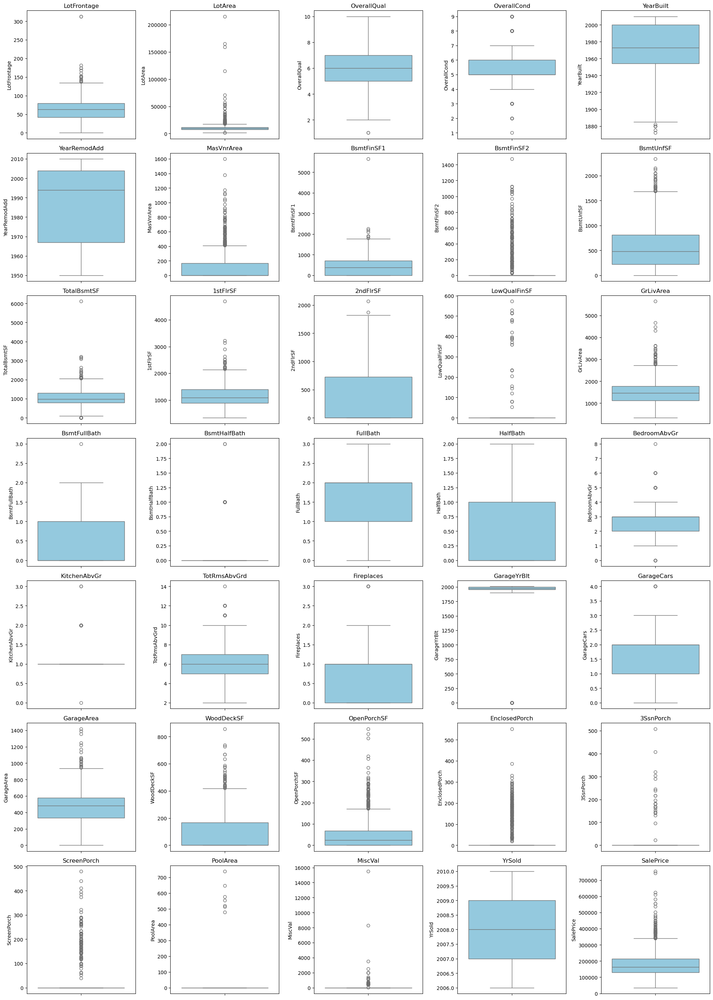

In [14]:
# Select only numerical columns
num_cols = df.select_dtypes(include=["float64","int64"]).columns

# Number of columns and rows for subplots
n_cols = 5  # 5 figures per row
n_rows = -(-len(num_cols) // n_cols)  # Equivalent to math.ceil(len(num_cols) / n_cols)

# Create figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
axes = axes.flatten()  # Flatten to handle indexing easily

# Plot boxplots
for i, col in enumerate(num_cols):
    sns.boxplot(y=df[col], ax=axes[i], color='skyblue')
    axes[i].set_title(col, fontsize=12)
    axes[i].set_xlabel("")  # Remove x-labels for better visualization

# Hide unused subplots (if any)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()


**Handeling the outlier for the numeric column only**

In [15]:
numerical_cols = ["LotFrontage","LotArea","OverallQual","OverallCond","YearBuilt","YearRemodAdd","MasVnrArea","BsmtFinSF1","BsmtFinSF2",
                  "BsmtUnfSF","TotalBsmtSF","1stFlrSF","2ndFlrSF","LowQualFinSF","GrLivArea","BsmtFullBath","BsmtHalfBath","FullBath","HalfBath",
                  "BedroomAbvGr","KitchenAbvGr","TotRmsAbvGrd","Fireplaces","GarageYrBlt","GarageCars","GarageArea","WoodDeckSF","OpenPorchSF",
                  "EnclosedPorch","3SsnPorch","ScreenPorch","PoolArea","MiscVal","YrSold","SalePrice"]

In [16]:
for i in numerical_cols:
    Q1 = df[i].quantile(0.25)
    print("The first quartile for the column", i, "is", Q1)
    Q2 = df[i].quantile(0.50)
    print("The second quartile for the column", i, "is", Q2)
    
    Q3 = df[i].quantile(0.75)
    print("The Third quartile for the column", i, "is", Q3)
    IQR = Q3 - Q1

    LL = Q1 - 1.5 * IQR  # Lower limit
    print("The lower limit for the column", i, "is", LL)

    UL = Q3 + 1.5 * IQR  # Upper limit
    print("The upper limit for the column", i, "is", UL)

    # Count outliers before treatment
    n = df[(df[i] < LL) | (df[i] > UL)][i].count()
    print(f"The number of outliers in {i} before treatment: {n}")

    # Instead of replacing with median, cap the values
    df[i] = np.where(df[i] < LL, LL, df[i])
    df[i] = np.where(df[i] > UL, UL, df[i])

    # Count outliers after treatment
    n_after = df[(df[i] < LL) | (df[i] > UL)][i].count()
    print(f"The number of outliers in {i} after treatment: {n_after}\n")

# Ensure data type is numeric
df[numerical_cols] = df[numerical_cols].astype(float)


The first quartile for the column LotFrontage is 42.0
The second quartile for the column LotFrontage is 63.0
The Third quartile for the column LotFrontage is 79.0
The lower limit for the column LotFrontage is -13.5
The upper limit for the column LotFrontage is 134.5
The number of outliers in LotFrontage before treatment: 16
The number of outliers in LotFrontage after treatment: 0

The first quartile for the column LotArea is 7553.5
The second quartile for the column LotArea is 9478.5
The Third quartile for the column LotArea is 11601.5
The lower limit for the column LotArea is 1481.5
The upper limit for the column LotArea is 17673.5
The number of outliers in LotArea before treatment: 69
The number of outliers in LotArea after treatment: 0

The first quartile for the column OverallQual is 5.0
The second quartile for the column OverallQual is 6.0
The Third quartile for the column OverallQual is 7.0
The lower limit for the column OverallQual is 2.0
The upper limit for the column OverallQu

**Removing the outlier useing the median method**

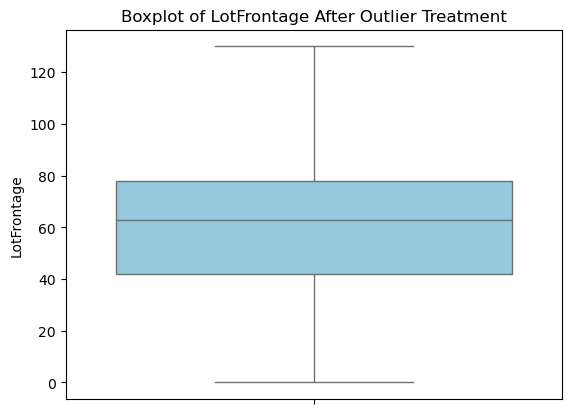

In [17]:
#In the above figure we can still see few outliers for median value
#Removing the outliers for column"LotFrontage"
df["LotFrontage"] = np.where((df["LotFrontage"] <-12.0),df["LotFrontage"].median(), df["LotFrontage"])
df["LotFrontage"] = np.where((df["LotFrontage"] > 132.0),df["LotFrontage"].median(), df["LotFrontage"])
sns.boxplot(df["LotFrontage"],color='skyblue')
plt.title("Boxplot of LotFrontage After Outlier Treatment")
plt.show()

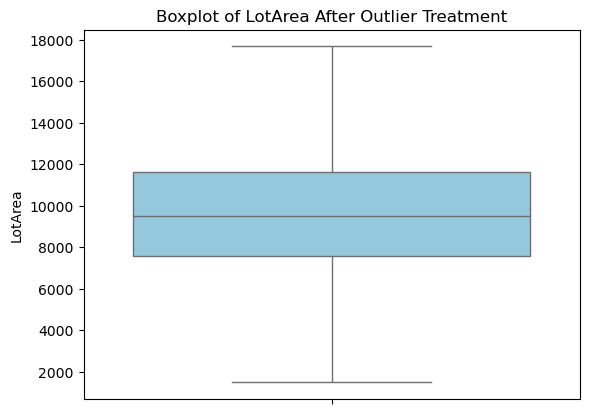

In [18]:
# Apply Capping (Better than median replacement)
df["LotArea"] = np.where((df["LotArea"]>17673.5),df["LotArea"].median(), df["LotArea"])
sns.boxplot(df["LotArea"],color='skyblue')
plt.title("Boxplot of LotArea After Outlier Treatment")
plt.show()

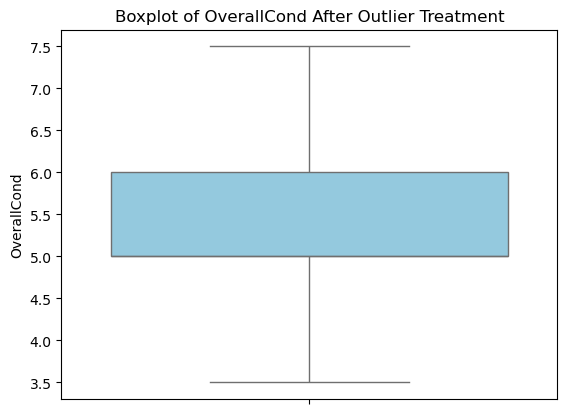

In [19]:
# Apply Capping (Better than median replacement)
df["OverallCond"] = np.where((df["OverallCond"] < 3.5),df["OverallCond"].median(), df["OverallCond"])
df["OverallCond"] = np.where((df["OverallCond"] > 7.5),df["OverallCond"].median(), df["OverallCond"])
sns.boxplot(df["OverallCond"],color='skyblue')
plt.title("Boxplot of OverallCond After Outlier Treatment")
plt.show()

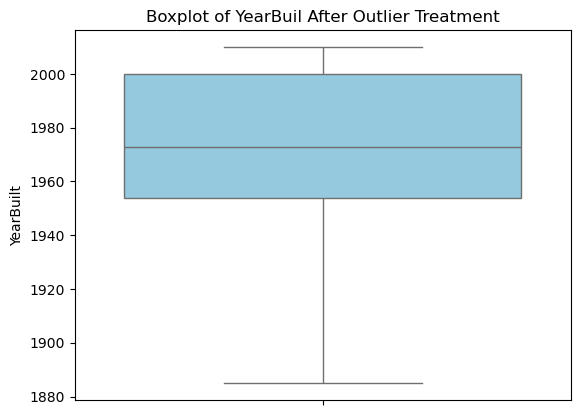

In [20]:
# Apply Capping (Better than median replacement)
df["YearBuilt"] = np.where((df["YearBuilt"] < 1885.0),df["YearBuilt"].median(), df["YearBuilt"])
df["YearBuilt"] = np.where((df["YearBuilt"] > 2069.0),df["YearBuilt"].median(), df["YearBuilt"])
sns.boxplot(df["YearBuilt"],color='skyblue')
plt.title("Boxplot of YearBuil After Outlier Treatment")
plt.show()

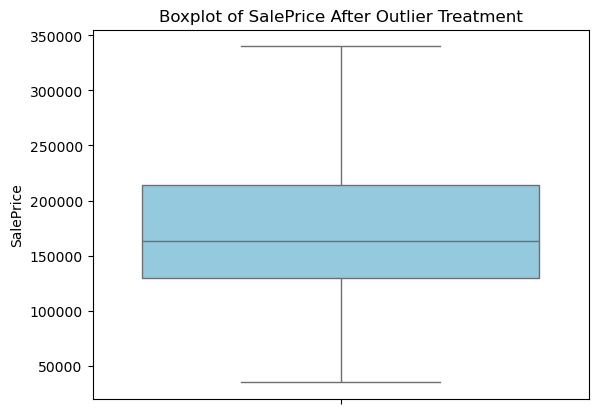

In [21]:
# Apply Capping (Better than median replacement)
df["SalePrice"] = np.where(df["SalePrice"] < 3937.5, LL, df["SalePrice"])
df["SalePrice"] = np.where(df["SalePrice"] > 340037.5, UL, df["SalePrice"])

# Plot Boxplot After Outlier Treatment
sns.boxplot(y=df["SalePrice"], color="skyblue")
plt.title("Boxplot of SalePrice After Outlier Treatment")
plt.show()


**All numerical column removed outlier**

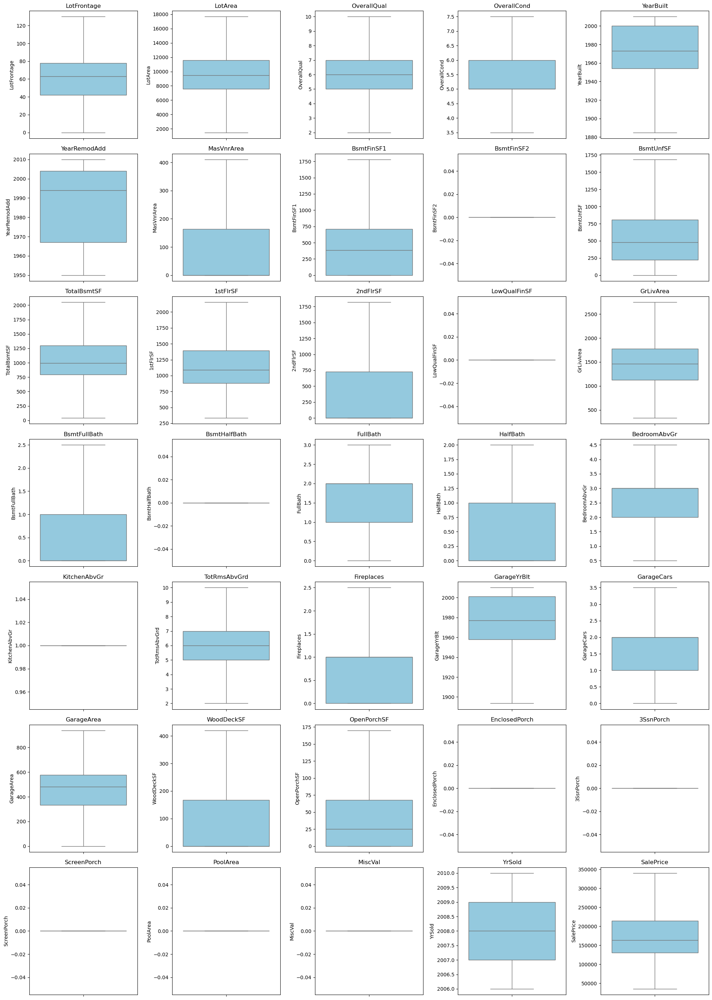

In [22]:
# Select only numerical columns
num_cols = df.select_dtypes(include=["float64","int64"]).columns

# Number of columns and rows for subplots
n_cols = 5  # 5 figures per row
n_rows = -(-len(num_cols) // n_cols)  # Equivalent to math.ceil(len(num_cols) / n_cols)

# Create figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
axes = axes.flatten()  # Flatten to handle indexing easily

# Plot boxplots
for i, col in enumerate(num_cols):
    sns.boxplot(y=df[col], ax=axes[i], color='skyblue')
    axes[i].set_title(col, fontsize=12)
    axes[i].set_xlabel("")  # Remove x-labels for better visualization

# Hide unused subplots (if any)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()


**Univariate Analysis**

In [23]:
df["SalePrice"].value_counts()


SalePrice
340037.5    61
140000.0    20
135000.0    17
145000.0    14
155000.0    14
            ..
315750.0     1
184750.0     1
106250.0     1
265000.0     1
147500.0     1
Name: count, Length: 606, dtype: int64

**#histogram**

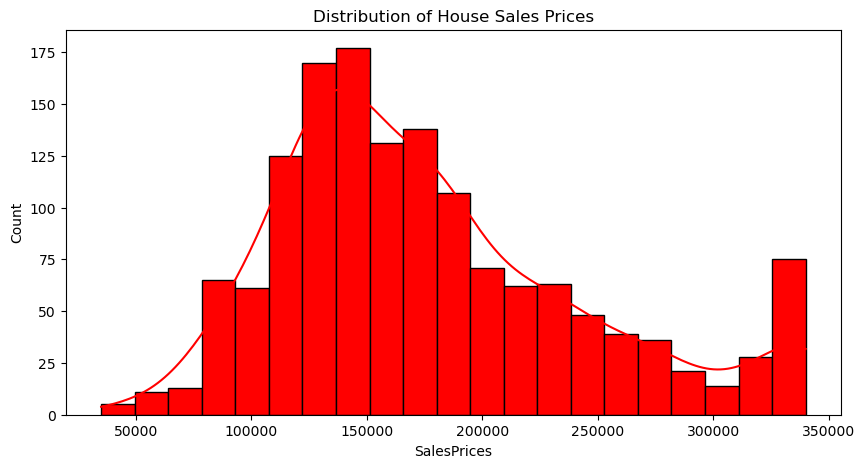

In [28]:
#histogram
plt.figure(figsize =(10,5))
sns.histplot(df["SalePrice"],kde=True,facecolor="Red",edgecolor="Black")
plt.title("Distribution of House Sales Prices")
plt.xlabel("SalesPrices")

plt.show()

In [ ]:
plt.figure(figsize =(10,5))
sns.histplot(df["SalePrice"],kde=True,facecolor="Red",edgecolor="Black")
plt.title("Distribution of House Sales Prices")
plt.xlabel("SalesPrices")

plt.show()

**Insights from the Histogram of House Sale Prices**
Data seprated between 50,000 to 350000
the house sale price of highest for 1,00,000 se 2,00,000 ke middle me highest price of house 
Most houses are affordable, but a few expensive ones increase the average price.
 two different market segments (e.g., budget vs. luxury houses).

In [33]:
df["YrSold"].value_counts()

YrSold
2009.0    338
2007.0    329
2006.0    314
2008.0    304
2010.0    175
Name: count, dtype: int64

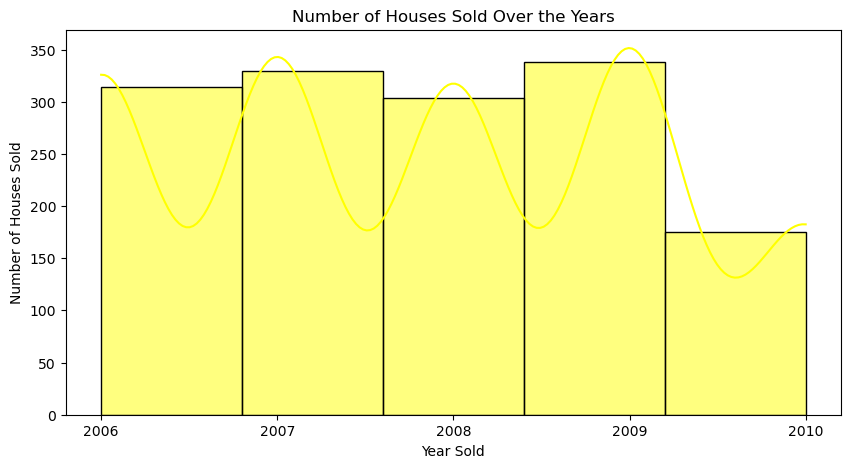

In [37]:
plt.figure(figsize=(10, 5))
sns.histplot(df["YrSold"], bins=len(df["YrSold"].unique()), kde="bar", color="yellow", edgecolor="black")
plt.title("Number of Houses Sold Over the Years")
plt.xlabel("Year Sold")
plt.ylabel("Number of Houses Sold")
plt.xticks(sorted(df["YrSold"].unique()))  # Ensure all years appear on x-axis
plt.show()



**Insight of yrsold**

"The highest number of house sales occurred in 2009,in apprexx(340) and  while the lowest number of sales was recorded in 2010.sold apprex (170)"

In [40]:
df["YearBuilt"].value_counts()

YearBuilt
2006.0    67
2005.0    64
2004.0    54
2007.0    49
2003.0    45
          ..
1893.0     1
1906.0     1
1913.0     1
2010.0     1
1905.0     1
Name: count, Length: 108, dtype: int64

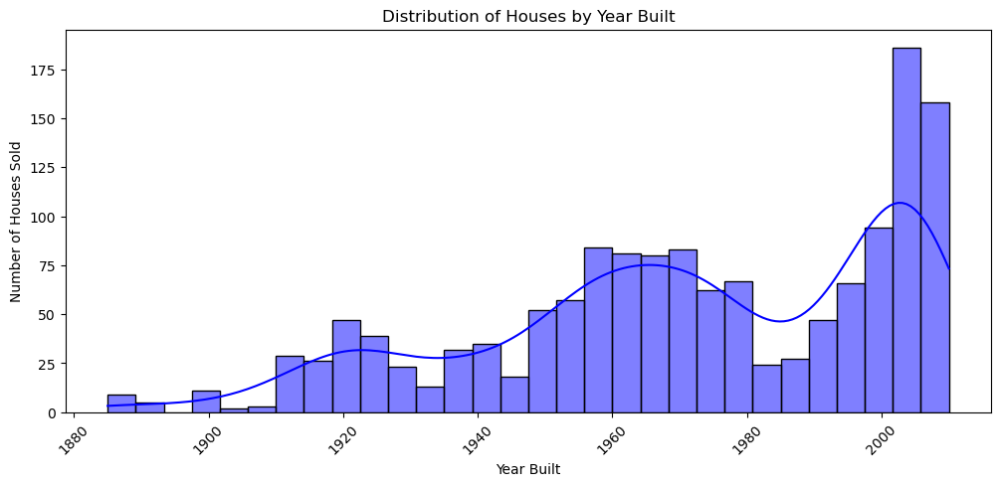

In [41]:
plt.figure(figsize=(12, 5))
sns.histplot(df["YearBuilt"], bins=30, kde=True, color="blue", edgecolor="black")
plt.title("Distribution of Houses by Year Built")
plt.xlabel("Year Built")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Insight of the yrbuild**

The distribution of houses by Year Built shows that the highest number of houses were constructed around the year 2000, indicating a peak in housing development during that period. There is also a noticeable decline in construction activity in recent years. Older houses (built before 1950) are fewer in number, suggesting that most homes in the dataset were built in the last few decades."

In [43]:
df["YearRemodAdd"].value_counts()

YearRemodAdd
1950.0    178
2006.0     97
2007.0     76
2005.0     73
2004.0     62
         ... 
2010.0      6
1986.0      5
1952.0      5
1983.0      5
1951.0      4
Name: count, Length: 61, dtype: int64

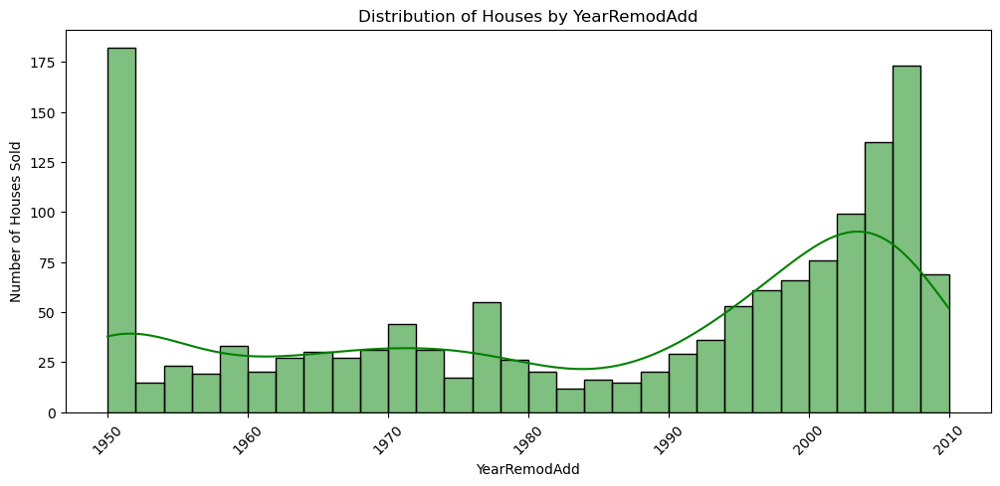

In [46]:
plt.figure(figsize=(12, 5))
sns.histplot(df["YearRemodAdd"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by YearRemodAdd")
plt.xlabel("YearRemodAdd")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**nsights from YearRemodAdd Distribution**


1️⃣ High spike in 1950 – This decade saw a surge in new home construction or remodeling, reflecting a housing boom.

2️⃣ Stable trend between 1960-1990 – Remodeling and new construction activity remained relatively lower and steady during this period.

3️⃣ Significant increase from 2000-2010 – A sharp rise in remodeling and new construction is observed, likely due to urbanization and market trends.

4️⃣ Overall U-shaped pattern – Initially high, then declining in the middle years, and rising again towards the later years, indicating fluctuating remodeling activity.

In [59]:
df["LotFrontage"].describe()

count    1460.000000
mean       56.306849
std        31.795445
min         0.000000
25%        42.000000
50%        63.000000
75%        78.000000
max       130.000000
Name: LotFrontage, dtype: float64

In [60]:
df["LotFrontage"].value_counts()

LotFrontage
0.0      259
60.0     143
70.0      70
80.0      69
50.0      57
        ... 
112.0      1
106.0      1
33.0       1
38.0       1
46.0       1
Name: count, Length: 96, dtype: int64

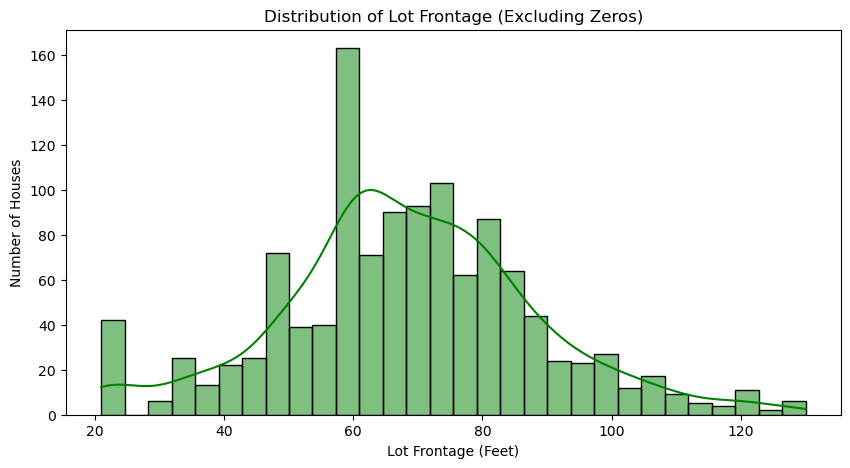

In [64]:
plt.figure(figsize=(10, 5))
sns.histplot(df[df["LotFrontage"] > 0]["LotFrontage"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Lot Frontage (Excluding Zeros)")
plt.xlabel("Lot Frontage (Feet)")
plt.ylabel("Number of Houses")
plt.show()


**Lot Frontage (Excluding Zeros):**

Peak Frequency Around 60 Feet: The most common lot frontage size is around 60 feet, indicating that a majority of houses have a frontage in this range.

Moderate Spread: The data shows a fairly normal distribution, with most values ranging between 40 and 80 feet.

Long Tail on the Right: A few properties have lot frontage sizes extending beyond 100 feet, but such cases are less frequent, indicating larger frontages are rare.

Exclusion of Zeros: The exclusion of zero values ensures that the analysis focuses only on valid lot frontage sizes, likely reducing distortion from missing or default data values.

In [65]:
df["LotArea"].value_counts()

LotArea
17673.5    67
7200.0     25
9600.0     24
6000.0     17
9000.0     14
           ..
14601.0     1
6442.0      1
4058.0      1
17104.0     1
9717.0      1
Name: count, Length: 1007, dtype: int64

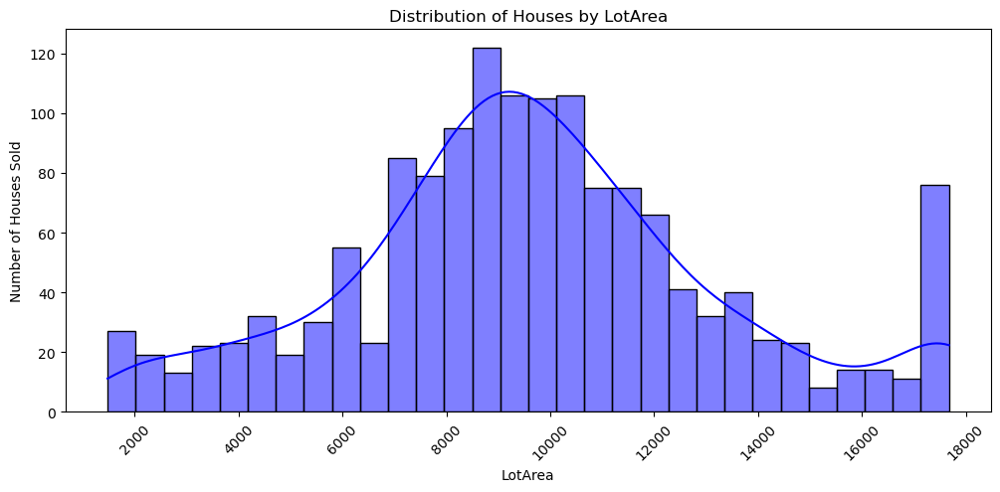

In [67]:
plt.figure(figsize=(12, 5))
sns.histplot(df["LotArea"], bins=30, kde=True, color="blue", edgecolor="black")
plt.title("Distribution of Houses by LotArea")
plt.xlabel("LotArea")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**LotArea Insight**

**#Key Insights:*
Peak Lot Area Range:

The highest concentration of houses falls within the 6,000 to 10,000 square feet range. This suggests that medium-sized lot areas are the most common in the dataset.
Skewness:

The distribution appears to be right-skewed, with a long tail extending toward larger lot areas (above 12,000 square feet). This indicates the presence of some houses with significantly larger lot areas.
Rare Large Lot Areas:

Very few houses have lot areas exceeding 15,000 square feet, indicating that such properties are rare in the dataset.
Smaller Lot Areas:

There is also a small but notable number of houses with lot areas below 4,000 square feet, possibly indicating compact or urban properties.
KDE Line:

The smooth KDE line shows that the distribution is unimodal, with a clear peak around the 8,000 square feet mark, reflecting the most common lot area in the dataset.

In [68]:
df["OverallQual"].value_counts()

OverallQual
5.0     397
6.0     374
7.0     319
8.0     168
4.0     116
9.0      43
3.0      20
10.0     18
2.0       5
Name: count, dtype: int64

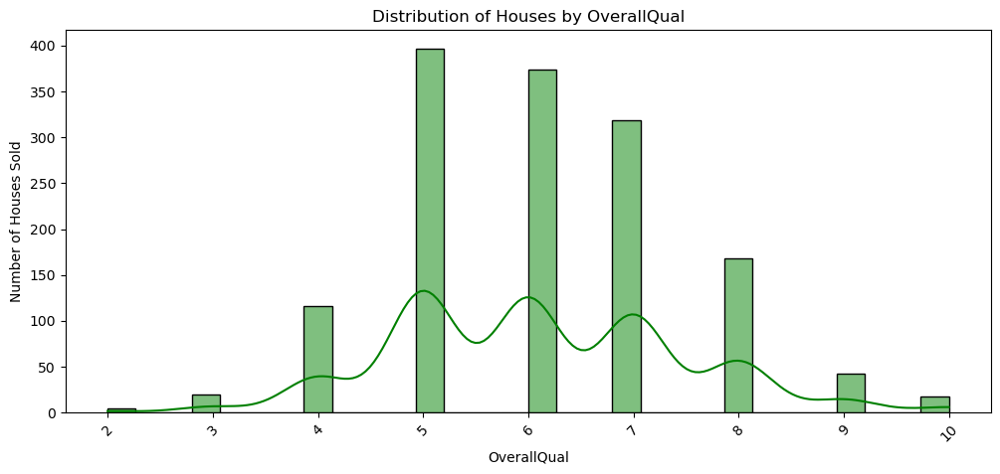

In [70]:
plt.figure(figsize=(12, 5))
sns.histplot(df["OverallQual"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by OverallQual")
plt.xlabel("OverallQual")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**

  The highest number of houses falls under OverallQual 5, followed by OverallQual 6. This indicates that most houses in the dataset have average to slightly above-average quality.

In [71]:
df["OverallCond"].value_counts()

OverallCond
5.0    821
6.0    252
7.0    205
7.5     94
4.0     57
3.5     31
Name: count, dtype: int64

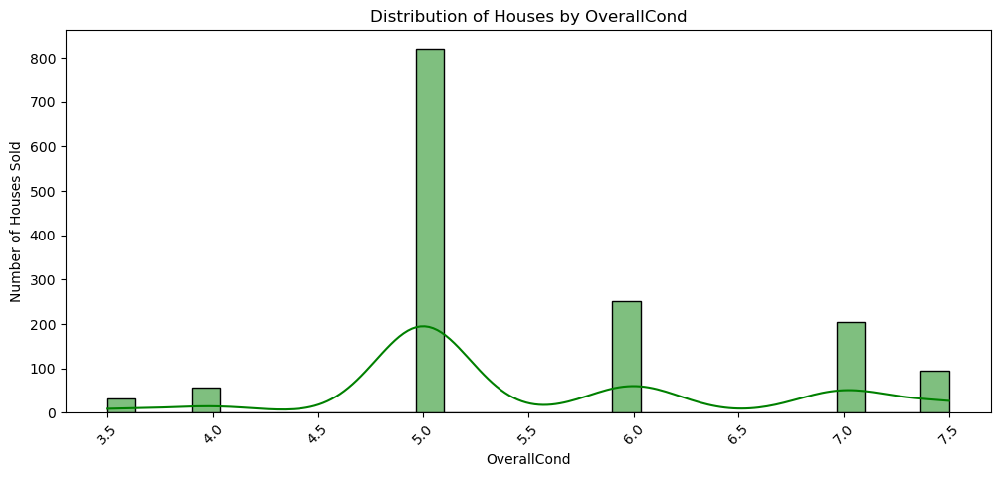

In [72]:
plt.figure(figsize=(12, 5))
sns.histplot(df["OverallCond"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by OverallCond")
plt.xlabel("OverallCond")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**

 Most houses are in average condition (OverallCond = 5), with fewer in poor or excellent condition:

In [73]:
df["MasVnrArea"].value_counts()

MasVnrArea
0.000      869
410.625     98
108.000      8
72.000       8
180.000      8
          ... 
261.000      1
156.000      1
36.000       1
204.000      1
119.000      1
Name: count, Length: 244, dtype: int64

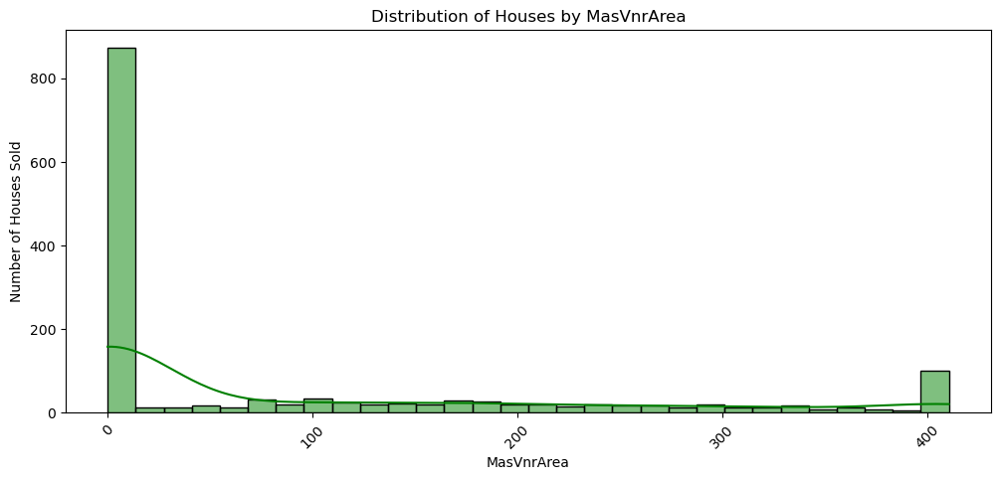

In [74]:
plt.figure(figsize=(12, 5))
sns.histplot(df["MasVnrArea"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by MasVnrArea")
plt.xlabel("MasVnrArea")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**

  Most houses have no Masonry Veneer Area (MasVnrArea = 0), with very few having significant veneer coverage.

In [76]:
df["BsmtFinSF1"].value_counts()

BsmtFinSF1
0.000       467
24.000       12
16.000        9
1780.625      7
936.000       5
           ... 
1324.000      1
1460.000      1
328.000       1
379.000       1
830.000       1
Name: count, Length: 631, dtype: int64

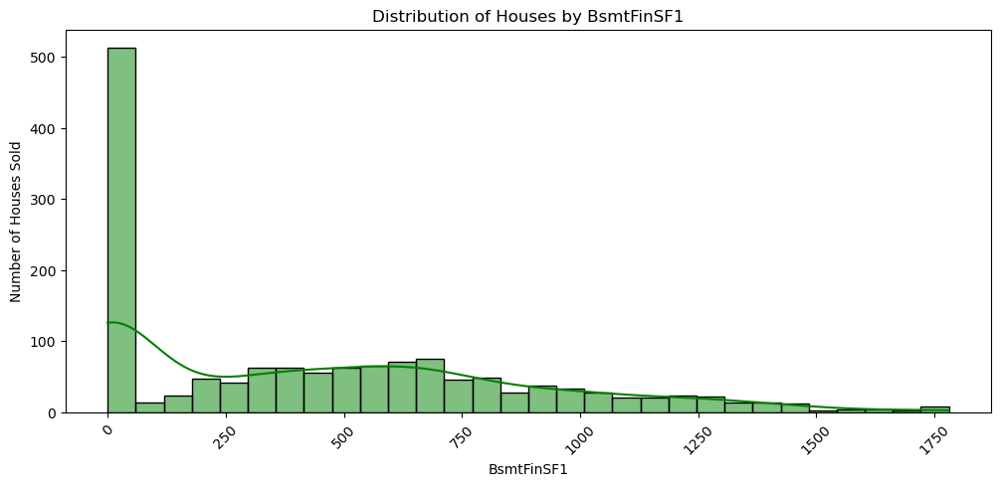

In [77]:
plt.figure(figsize=(12, 5))
sns.histplot(df["BsmtFinSF1"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by BsmtFinSF1")
plt.xlabel("BsmtFinSF1")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()

**Key Insight**
Many houses have no finished basement area (BsmtFinSF1 = 0), while the rest show a right-skewed distribution of finished basement sizes

In [78]:
df["BsmtFinSF2"].value_counts()

BsmtFinSF2
0.0    1460
Name: count, dtype: int64

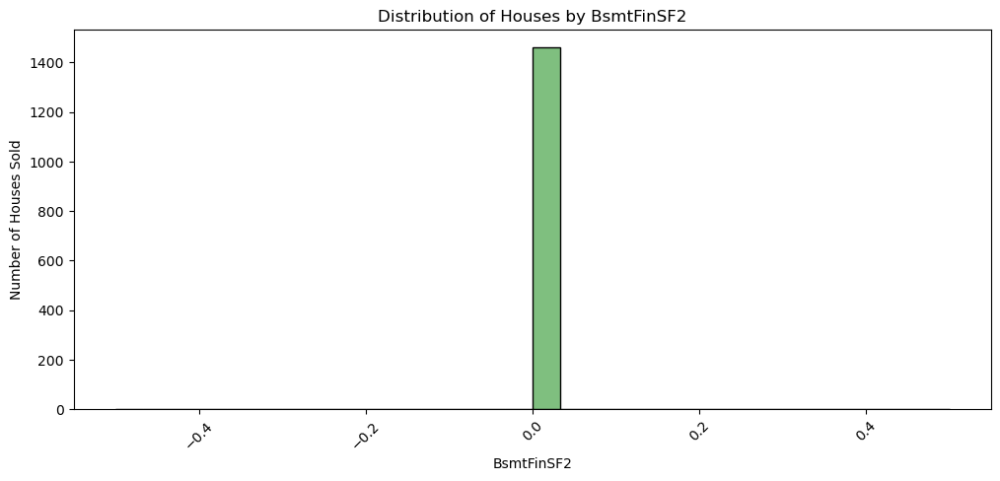

In [79]:
plt.figure(figsize=(12, 5))
sns.histplot(df["BsmtFinSF2"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by BsmtFinSF2")
plt.xlabel("BsmtFinSF2")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**

  Almost all houses have no secondary finished basement area (BsmtFinSF2 = 0).

In [80]:
df["BsmtUnfSF"].value_counts()

BsmtUnfSF
0.0       118
1685.5     29
728.0       9
384.0       8
300.0       7
         ... 
578.0       1
707.0       1
551.0       1
1257.0      1
136.0       1
Name: count, Length: 755, dtype: int64

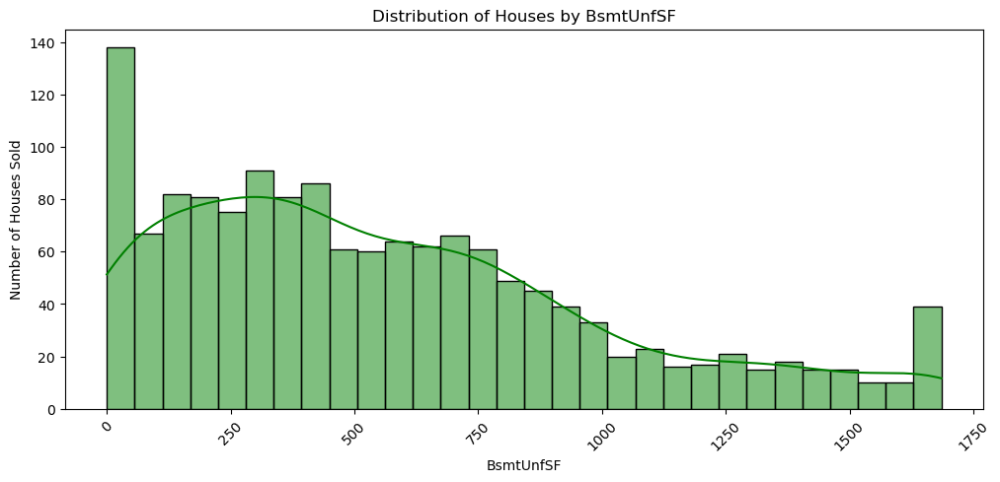

In [81]:
plt.figure(figsize=(12, 5))
sns.histplot(df["BsmtUnfSF"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by BsmtUnfSF")
plt.xlabel("BsmtUnfSF")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**

  Most houses have a small to moderate amount of unfinished basement area (BsmtUnfSF), with a right-skewed distribution indicating some properties have large unfinished spaces.

In [82]:
df["LotFrontage"].value_counts()

LotFrontage
0.0      259
60.0     143
70.0      70
80.0      69
50.0      57
        ... 
112.0      1
106.0      1
33.0       1
38.0       1
46.0       1
Name: count, Length: 96, dtype: int64

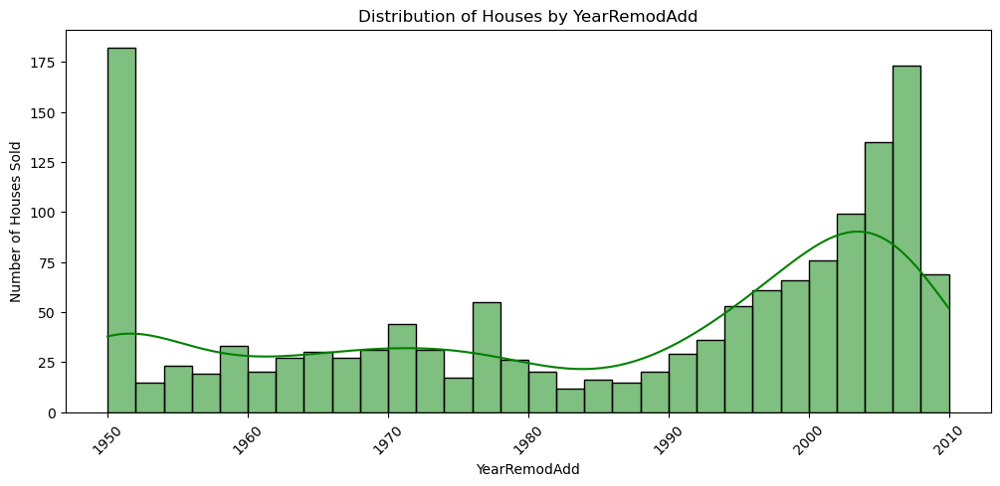

In [83]:
plt.figure(figsize=(12, 5))
sns.histplot(df["YearRemodAdd"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by YearRemodAdd")
plt.xlabel("YearRemodAdd")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**

  A significant number of houses were remodeled in 1950 and 2000-2010, with a noticeable decline in remodeling activity between 1960 and 1990.

In [84]:
df["TotalBsmtSF"].value_counts()

TotalBsmtSF
42.0      37
864.0     35
2052.0    24
672.0     17
912.0     15
          ..
1490.0     1
981.0      1
1766.0     1
1952.0     1
1542.0     1
Name: count, Length: 699, dtype: int64

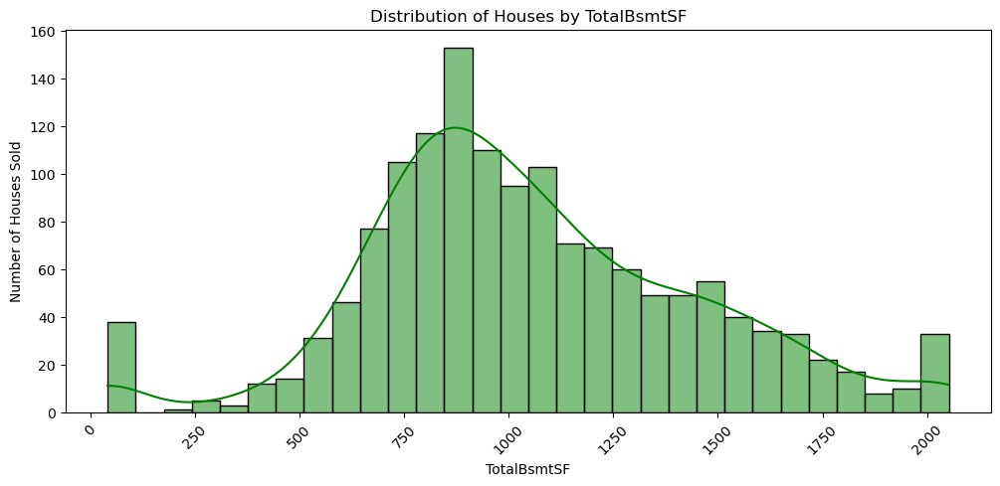

In [85]:
plt.figure(figsize=(12, 5))
sns.histplot(df["TotalBsmtSF"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by TotalBsmtSF")
plt.xlabel("TotalBsmtSF")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**

  The majority of houses have a total basement area around 750 to 1000 sq ft, with fewer houses having larger or smaller basement sizes.

In [86]:
df["1stFlrSF"].value_counts()

1stFlrSF
864.000     25
2155.125    20
1040.000    16
912.000     14
894.000     12
            ..
1838.000     1
1159.000     1
334.000      1
751.000      1
1256.000     1
Name: count, Length: 734, dtype: int64

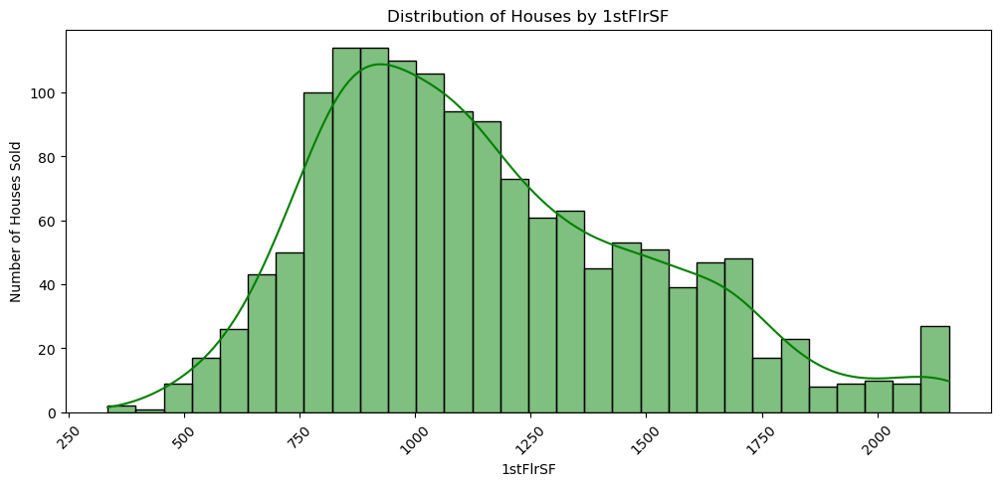

In [87]:
plt.figure(figsize=(12, 5))
sns.histplot(df["1stFlrSF"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by 1stFlrSF")
plt.xlabel("1stFlrSF")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()



**Key Insight**

  Most houses have a first-floor area between 800 to 1000 and 1250 sq ft, indicating this range is popular among buyers

In [88]:
df["2ndFlrSF"].value_counts()

2ndFlrSF
0.0       829
728.0      10
504.0       9
546.0       8
672.0       8
         ... 
914.0       1
1067.0      1
1000.0      1
687.0       1
1152.0      1
Name: count, Length: 416, dtype: int64

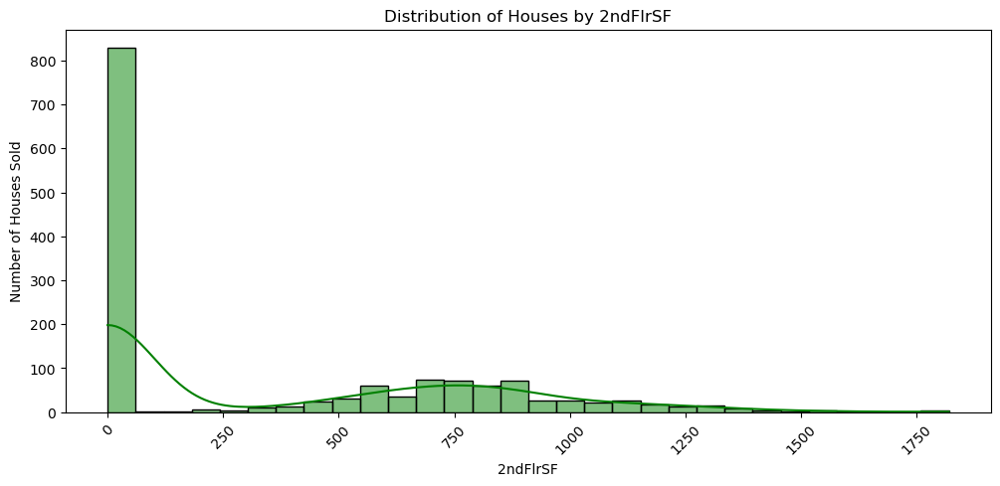

In [89]:
plt.figure(figsize=(12, 5))
sns.histplot(df["2ndFlrSF"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by 2ndFlrSF")
plt.xlabel("2ndFlrSF")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**

  A significant number of houses lack a second floor, while those with one typically have an area under 750 sq ft.

In [90]:
df["LowQualFinSF"].value_counts()

LowQualFinSF
0.0    1460
Name: count, dtype: int64

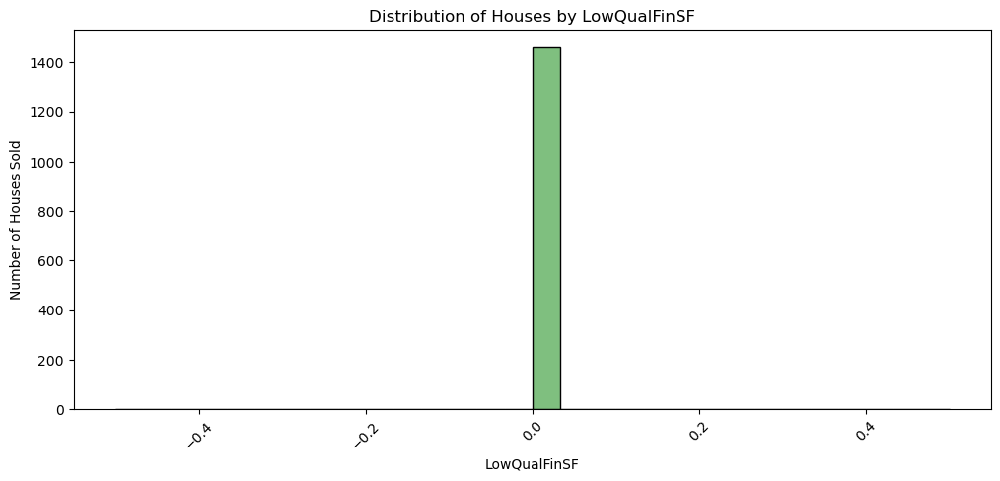

In [91]:
plt.figure(figsize=(12, 5))
sns.histplot(df["LowQualFinSF"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by LowQualFinSF")
plt.xlabel("LowQualFinSF")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**
Nearly all houses have no or negligible low-quality finished square footage.









In [92]:
df["GrLivArea"].value_counts()

GrLivArea
2747.625    31
864.000     22
1040.000    14
894.000     11
1456.000    10
            ..
2296.000     1
1199.000     1
1586.000     1
1473.000     1
1256.000     1
Name: count, Length: 832, dtype: int64

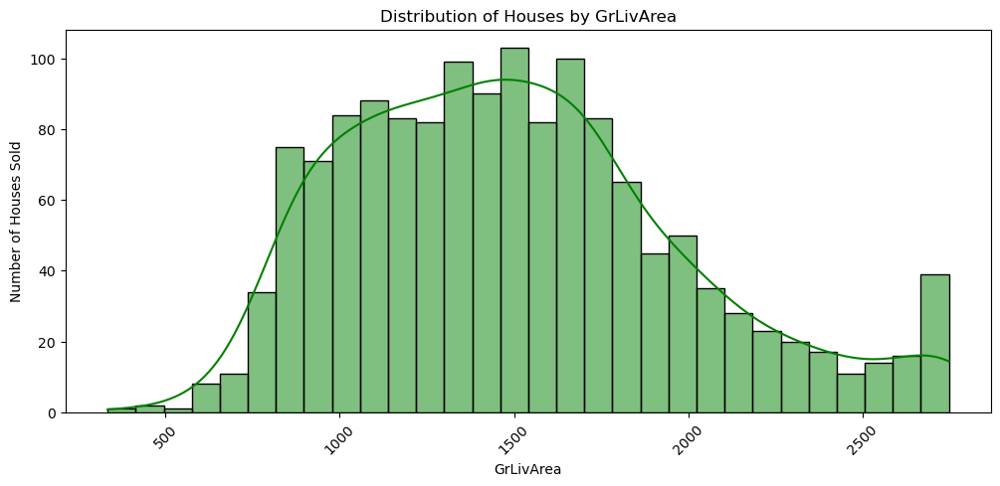

In [93]:
plt.figure(figsize=(12, 5))
sns.histplot(df["GrLivArea"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by GrLivArea")
plt.xlabel("GrLivArea")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**

  The distribution of houses by above-ground living area (GrLivArea) shows a right-skewed pattern, with most houses having a living area between 1,000 and 2,000 square feet.









In [94]:
df["BsmtFullBath"].value_counts()

BsmtFullBath
0.0    856
1.0    588
2.0     15
2.5      1
Name: count, dtype: int64

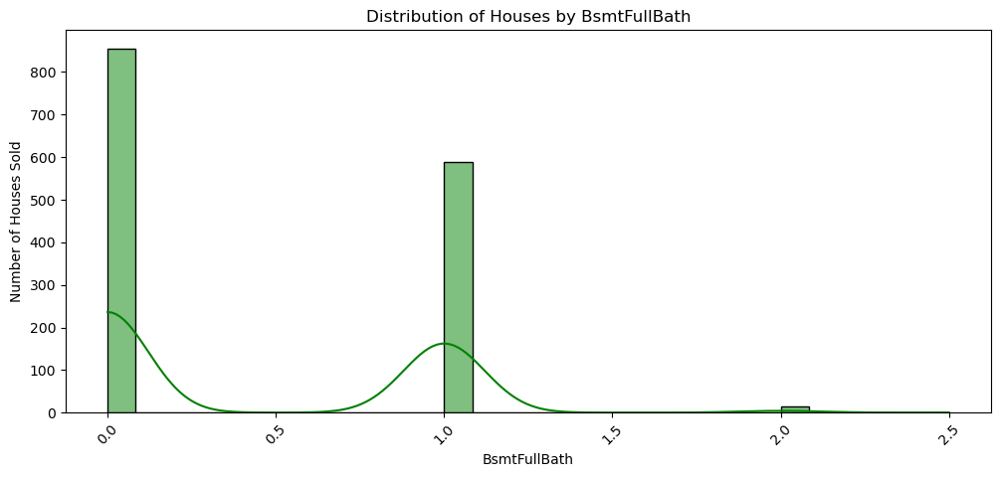

In [95]:
plt.figure(figsize=(12, 5))
sns.histplot(df["BsmtFullBath"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by BsmtFullBath")
plt.xlabel("BsmtFullBath")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**KEy Insight**

  The distribution of houses by basement full bathrooms (BsmtFullBath) indicates that the majority of homes have either no basement full bathrooms or exactly one, with very few having two or more.

In [96]:
df["BsmtHalfBath"].value_counts()

BsmtHalfBath
0.0    1460
Name: count, dtype: int64

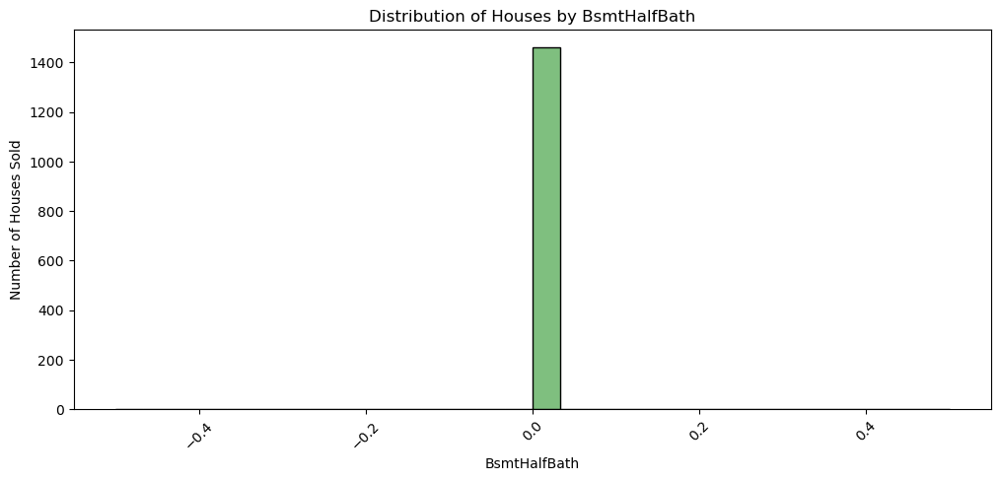

In [97]:
plt.figure(figsize=(12, 5))
sns.histplot(df["BsmtHalfBath"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by BsmtHalfBath")
plt.xlabel("BsmtHalfBath")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**

  The distribution of houses by basement half bathrooms (BsmtHalfBath) shows that nearly all houses have none, suggesting basement half bathrooms are extremely uncommon.

In [99]:
df["FullBath"].value_counts()

FullBath
2.0    768
1.0    650
3.0     33
0.0      9
Name: count, dtype: int64

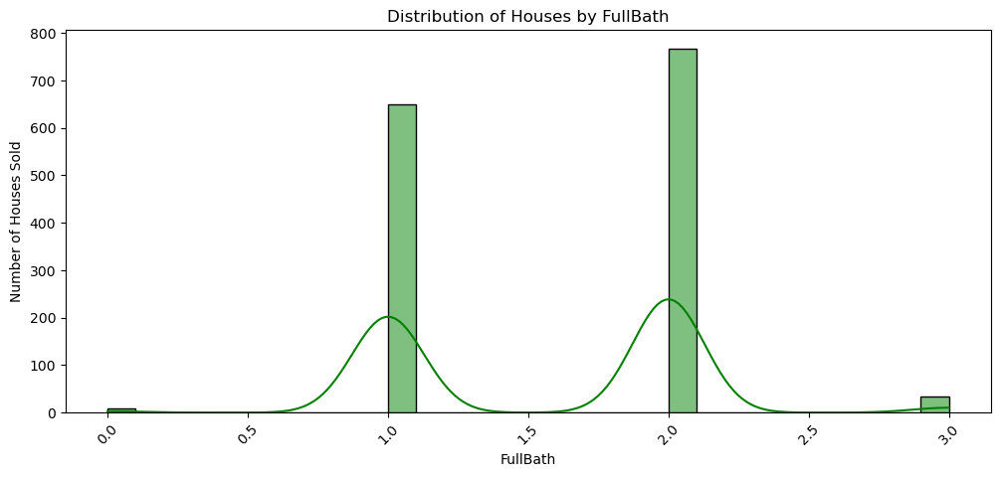

In [100]:
plt.figure(figsize=(12, 5))
sns.histplot(df["FullBath"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by FullBath")
plt.xlabel("FullBath")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


** Key Insight**

  The distribution of houses by full bathrooms (FullBath) indicates that most houses have either 1 or 2 full bathrooms, with very few houses having none or more than 2.

In [101]:
df["LotFrontage"].value_counts()

LotFrontage
0.0      259
60.0     143
70.0      70
80.0      69
50.0      57
        ... 
112.0      1
106.0      1
33.0       1
38.0       1
46.0       1
Name: count, Length: 96, dtype: int64

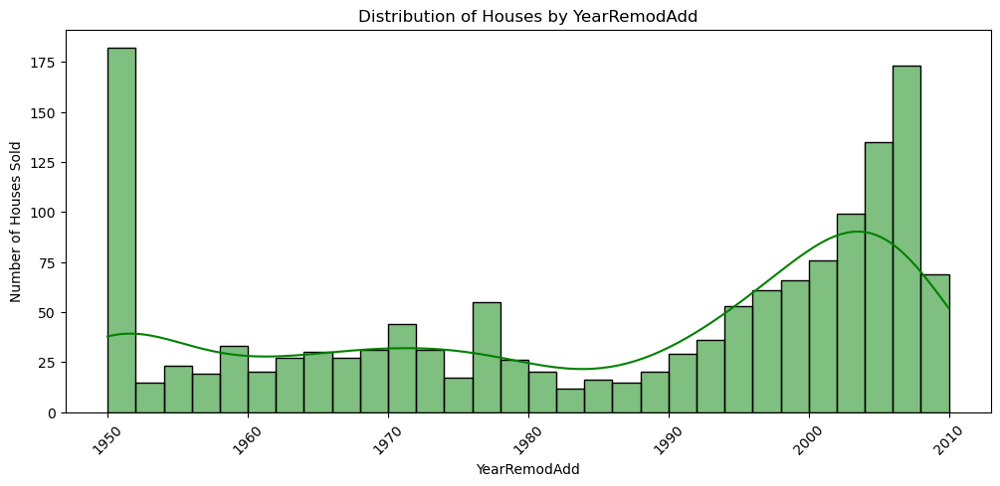

In [102]:
plt.figure(figsize=(12, 5))
sns.histplot(df["YearRemodAdd"], bins=30, kde=True, color="green", edgecolor="black")
plt.title("Distribution of Houses by YearRemodAdd")
plt.xlabel("YearRemodAdd")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key insight**

  The distribution of houses by the year they were remodeled or added (YearRemodAdd) shows a peak around 1950 and a significant increase in remodeling activity from the late 1990s to 2010.

In [103]:
df["HalfBath"].value_counts()

HalfBath
0.0    913
1.0    535
2.0     12
Name: count, dtype: int64

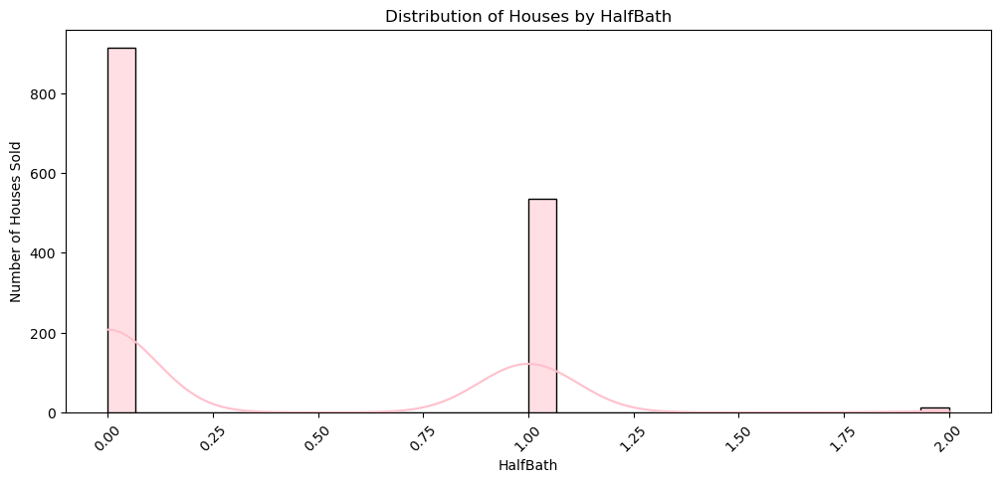

In [104]:
plt.figure(figsize=(12, 5))
sns.histplot(df["HalfBath"], bins=30, kde=True, color="pink", edgecolor="black")
plt.title("Distribution of Houses by HalfBath")
plt.xlabel("HalfBath")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


** Key Insight**

  The distribution of houses by HalfBath shows that most houses have either zero or one half-bath, with very few having two.

In [105]:
df["BedroomAbvGr"].value_counts()

BedroomAbvGr
3.0    804
2.0    358
4.0    213
1.0     50
4.5     29
0.5      6
Name: count, dtype: int64

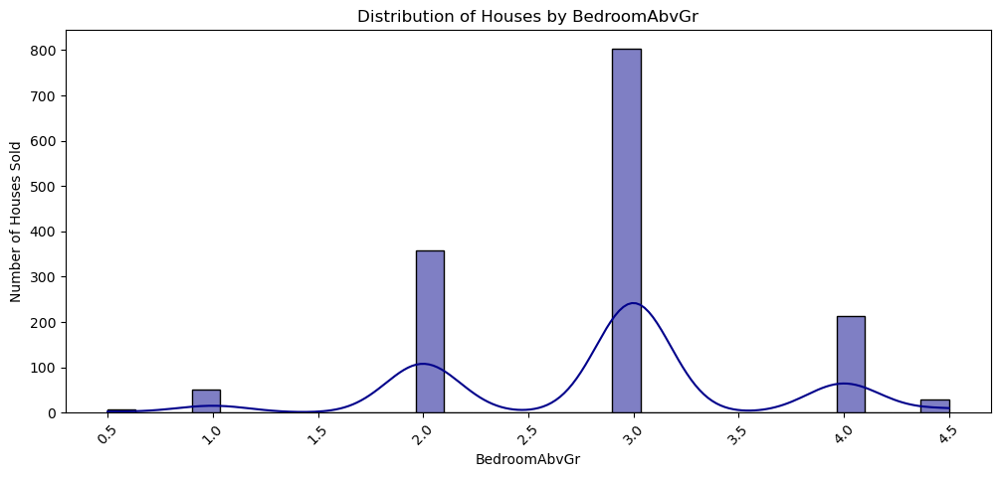

In [106]:
plt.figure(figsize=(12, 5))
sns.histplot(df["BedroomAbvGr"], bins=30, kde=True, color="darkblue", edgecolor="black")
plt.title("Distribution of Houses by BedroomAbvGr")
plt.xlabel("BedroomAbvGr")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**

  The distribution of houses by BedroomAbvGr reveals that the majority of houses have three bedrooms above ground level, followed by two and four bedrooms, with fewer houses having one or five bedrooms.

In [107]:
df["KitchenAbvGr"].value_counts()

KitchenAbvGr
1.0    1460
Name: count, dtype: int64

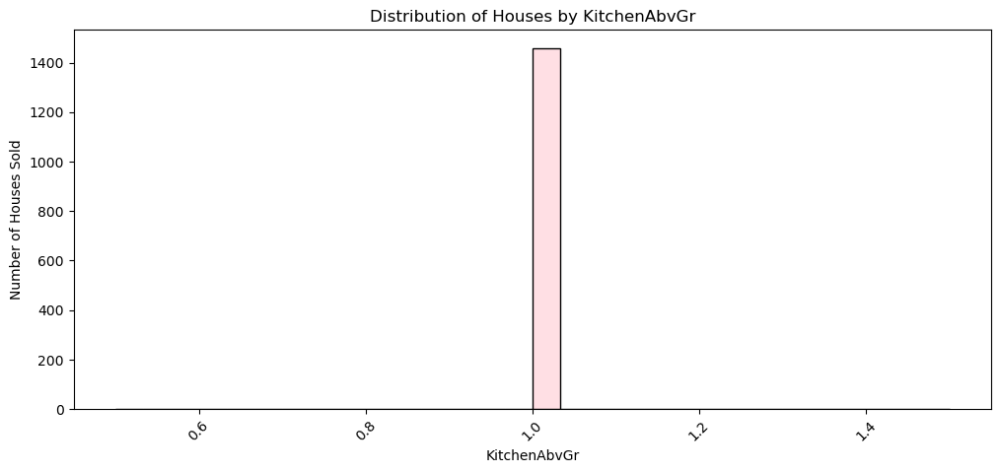

In [110]:
plt.figure(figsize=(12, 5))
sns.histplot(df["KitchenAbvGr"], bins=30, kde=True, color="pink", edgecolor="black")
plt.title("Distribution of Houses by KitchenAbvGr")
plt.xlabel("KitchenAbvGr")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key Insight**

  The distribution of houses by KitchenAbvGr shows that nearly all houses have exactly one kitchen above ground level, indicating that this is the standard configuration for most properties in the dataset.

In [111]:
df["Fireplaces"].value_counts()

Fireplaces
0.0    690
1.0    650
2.0    115
2.5      5
Name: count, dtype: int64

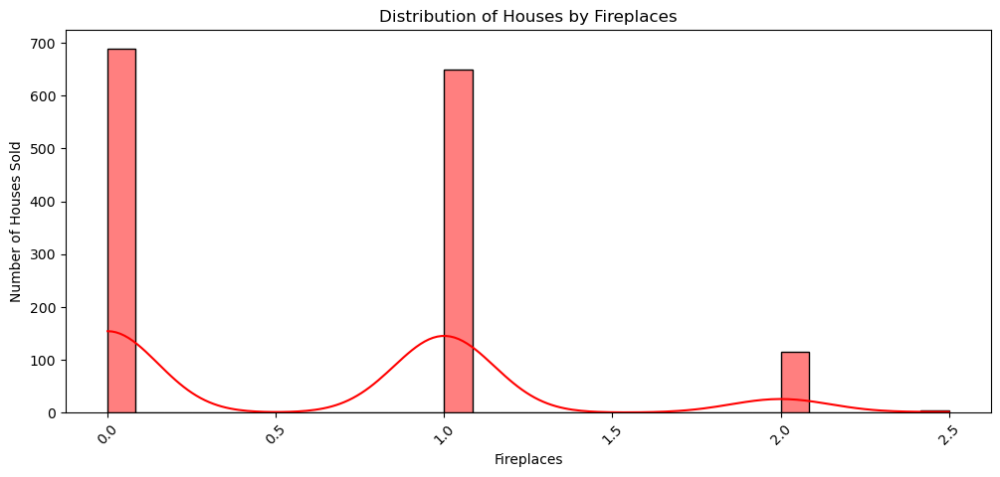

In [112]:
plt.figure(figsize=(12, 5))
sns.histplot(df["Fireplaces"], bins=30, kde=True, color="red", edgecolor="black")
plt.title("Distribution of Houses by Fireplaces")
plt.xlabel("Fireplaces")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


** Key Insight**

  The distribution of houses by the number of fireplaces indicates that a significant number of houses have either no fireplaces or one fireplace. Homes with two or more fireplaces are relatively uncommon, suggesting that having multiple fireplaces is a less typical feature in this dataset.









In [113]:
df["GarageYrBlt"].value_counts()

GarageYrBlt
1893.5    81
2005.0    65
2006.0    59
2004.0    53
2003.0    50
          ..
1927.0     1
1900.0     1
1906.0     1
1908.0     1
1933.0     1
Name: count, Length: 98, dtype: int64

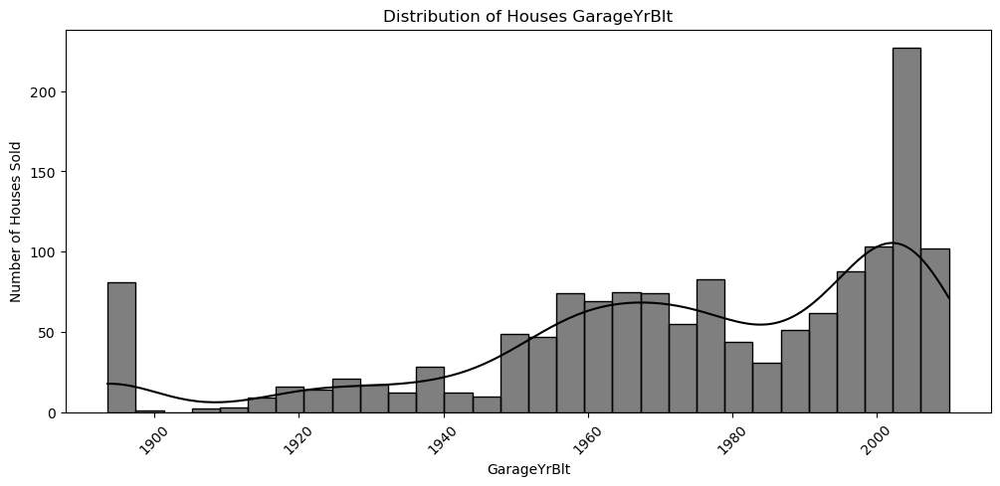

In [117]:
plt.figure(figsize=(12, 5))
sns.histplot(df["GarageYrBlt"], bins=30, kde=True, color="black", edgecolor="black")
plt.title("Distribution of Houses GarageYrBlt")
plt.xlabel("GarageYrBlt")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


** Key Insight**

  The distribution of houses by the year the garage was built shows notable trends. A significant number of garages were built around the early 1900s, with a steady increase in garage construction during the mid-20th century. The late 1990s to early 2000s see a sharp rise, indicating an increase in modern garages. This trend might reflect modernization, urbanization, or a growing preference for homes with attached garages.

In [118]:
df["GarageCars"].value_counts()

GarageCars
2.0    824
1.0    369
3.0    181
0.0     81
3.5      5
Name: count, dtype: int64

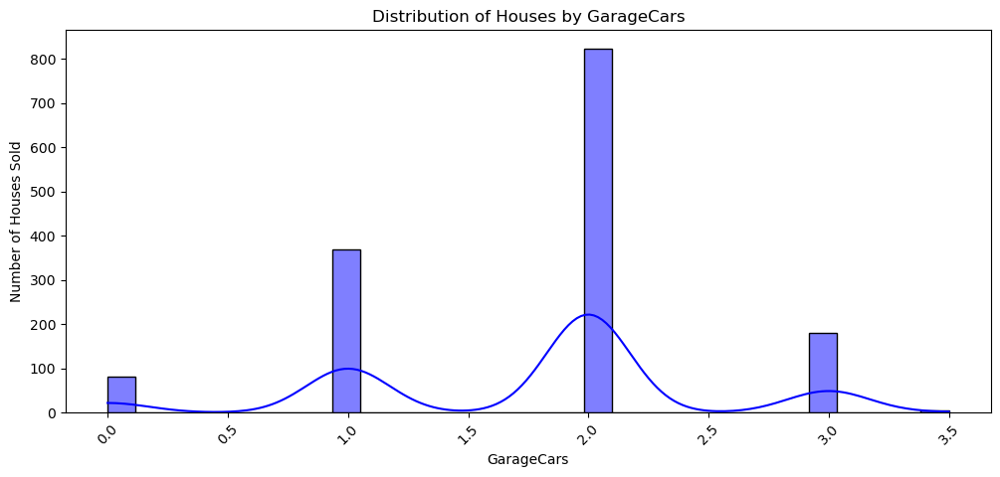

In [120]:
plt.figure(figsize=(12, 5))
sns.histplot(df["GarageCars"], bins=30, kde=True, color="blue", edgecolor="black")
plt.title("Distribution of Houses by GarageCars")
plt.xlabel("GarageCars")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key insight**

  Is figure me dikhaya gaya hai ki zyadatar gharon me 2 garage spaces hain, jo sabse common hain. Iske baad 1 garage space aur phir 3 garage spaces ka preference hai. Bahut kam gharon me 0 ya 0.5 garage space dekhne ko milta hai.

In [121]:
df["GarageArea"].value_counts()

GarageArea
0.0      81
440.0    49
576.0    47
240.0    38
484.0    34
         ..
842.0     1
816.0     1
230.0     1
261.0     1
192.0     1
Name: count, Length: 423, dtype: int64

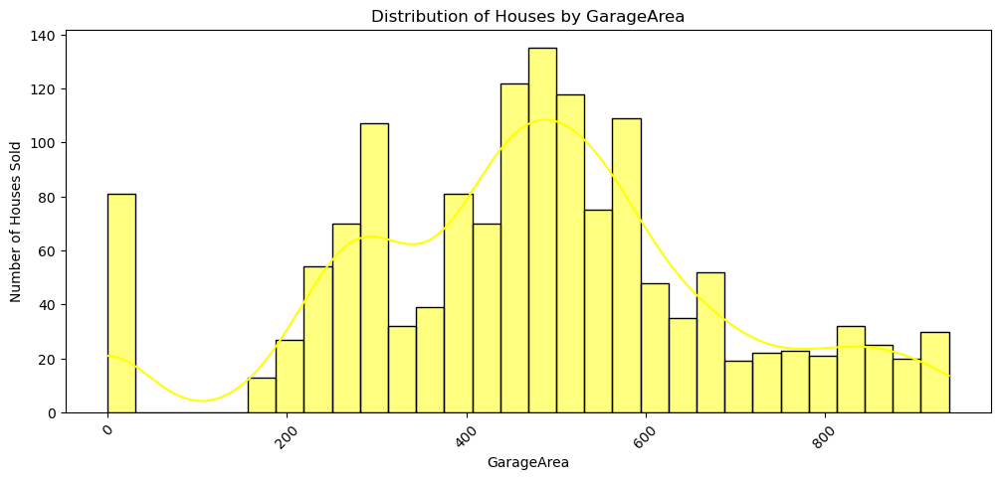

In [122]:
plt.figure(figsize=(12, 5))
sns.histplot(df["GarageArea"], bins=30, kde=True, color="yellow", edgecolor="black")
plt.title("Distribution of Houses by GarageArea")
plt.xlabel("GarageArea")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**key insight 

garage area concentrated between 200 to 600 square feet

In [123]:
df["WoodDeckSF"].value_counts()

WoodDeckSF
0.0      761
192.0     38
100.0     36
144.0     33
420.0     32
        ... 
126.0      1
298.0      1
260.0      1
141.0      1
366.0      1
Name: count, Length: 245, dtype: int64

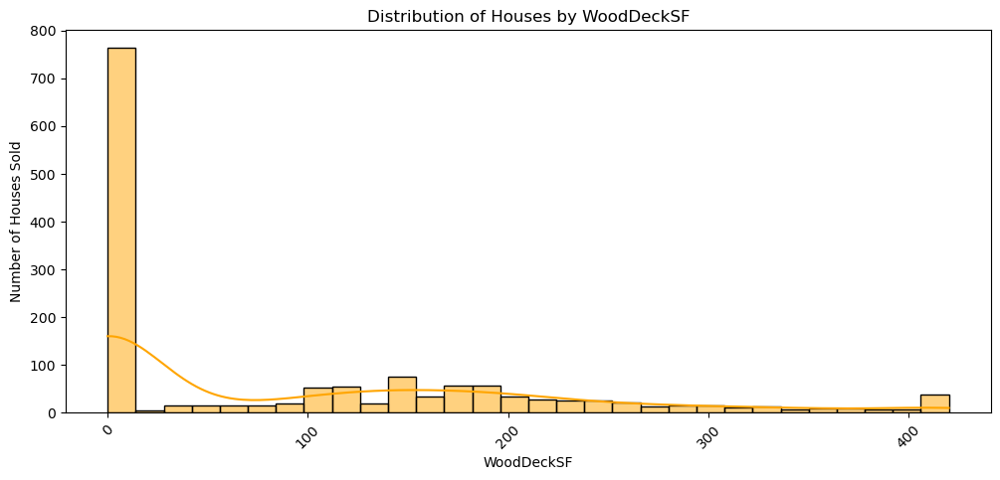

In [126]:
plt.figure(figsize=(12, 5))
sns.histplot(df["WoodDeckSF"], bins=30, kde=True, color="orange", edgecolor="black")
plt.title("Distribution of Houses by WoodDeckSF")
plt.xlabel("WoodDeckSF")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key insight**

  This figure reveals that most houses have a wood deck size of 0 square feet, indicating many houses lack a wood deck, while a smaller proportion has sizes concentrated around 100 to 200 square feet.

In [127]:
df["OpenPorchSF"].value_counts()

OpenPorchSF
0.0      656
170.0     79
36.0      29
48.0      22
20.0      21
        ... 
94.0       1
11.0       1
142.0      1
119.0      1
126.0      1
Name: count, Length: 139, dtype: int64

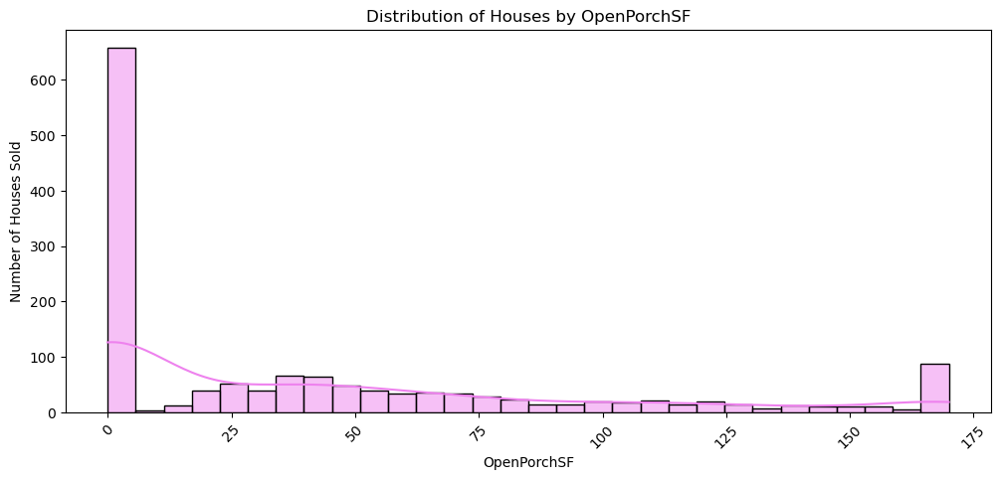

In [132]:
plt.figure(figsize=(12, 5))
sns.histplot(df["OpenPorchSF"], bins=30, kde=True, color="violet", edgecolor="black")
plt.title("Distribution of Houses by OpenPorchSF")
plt.xlabel("OpenPorchSF")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Insight key**

   that most houses have an open porch size of 0 square feet, indicating that many homes do not have open porches, while a smaller number have porch sizes clustered between 20 and 100 square feet.

In [133]:
df["EnclosedPorch"].value_counts()

EnclosedPorch
0.0    1460
Name: count, dtype: int64

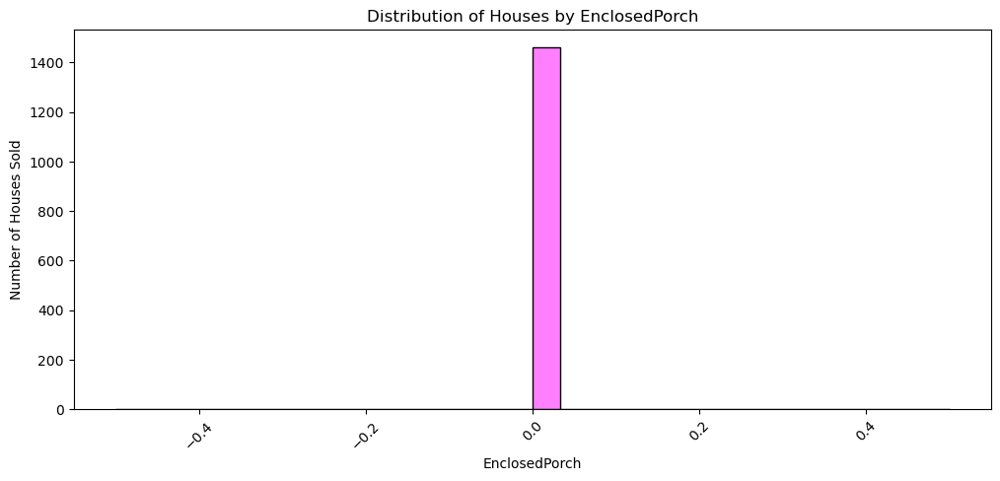

In [134]:
plt.figure(figsize=(12, 5))
sns.histplot(df["EnclosedPorch"], bins=30, kde=True, color="magenta", edgecolor="black")
plt.title("Distribution of Houses by EnclosedPorch")
plt.xlabel("EnclosedPorch")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Insight**

The distribution reveals that the majority of houses have an enclosed porch size of 0 square feet, indicating that enclosed porches are uncommon, with smaller peaks for porch sizes around 100 square feet

In [135]:
df["3SsnPorch"].value_counts()

3SsnPorch
0.0    1460
Name: count, dtype: int64

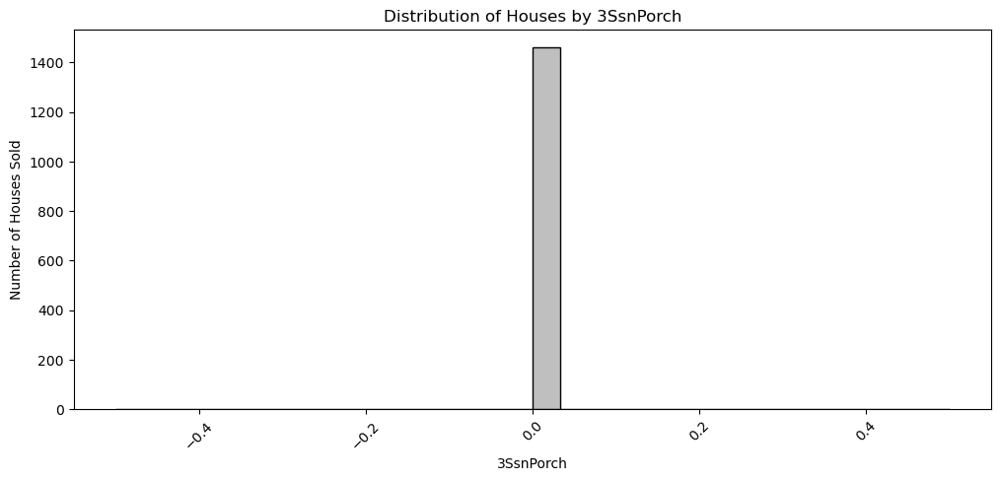

In [136]:
plt.figure(figsize=(12, 5))
sns.histplot(df["3SsnPorch"], bins=30, kde=True, color="gray", edgecolor="black")
plt.title("Distribution of Houses by 3SsnPorch")
plt.xlabel("3SsnPorch")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Insight**

The distribution shows that the vast majority of houses have a 3-season porch size of 0 square feet, indicating that 3-season porches are extremely rare, with only a few houses having such porches.









In [137]:
df["ScreenPorch"].value_counts()

ScreenPorch
0.0    1460
Name: count, dtype: int64

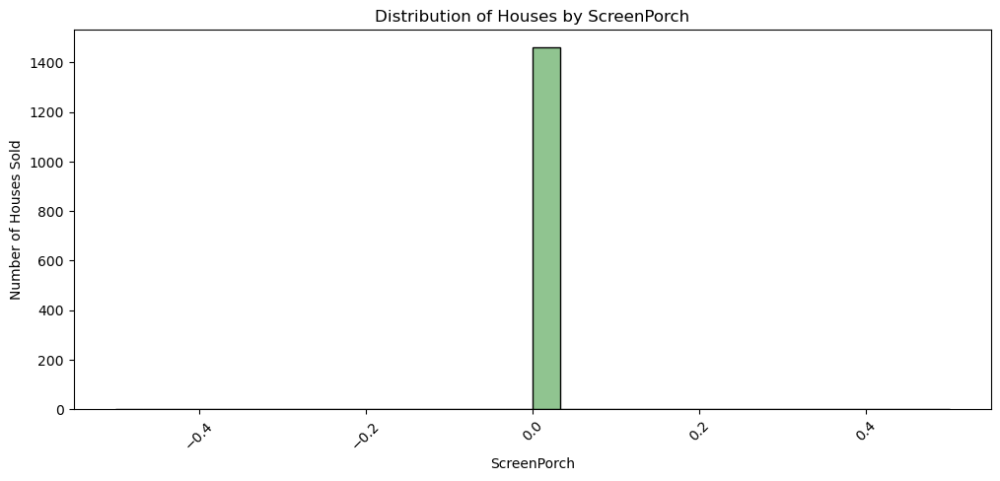

In [138]:
plt.figure(figsize=(12, 5))
sns.histplot(df["ScreenPorch"], bins=30, kde=True, color="forestgreen", edgecolor="black")
plt.title("Distribution of Houses by ScreenPorch")
plt.xlabel("ScreenPorch")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Insight**

The distribution indicates that most houses have a screened porch size of 0 square feet, suggesting that screened porches are uncommon, with a small number of houses having them, typically in the lower size range.

In [139]:
df["PoolArea"].value_counts()

PoolArea
0.0    1460
Name: count, dtype: int64

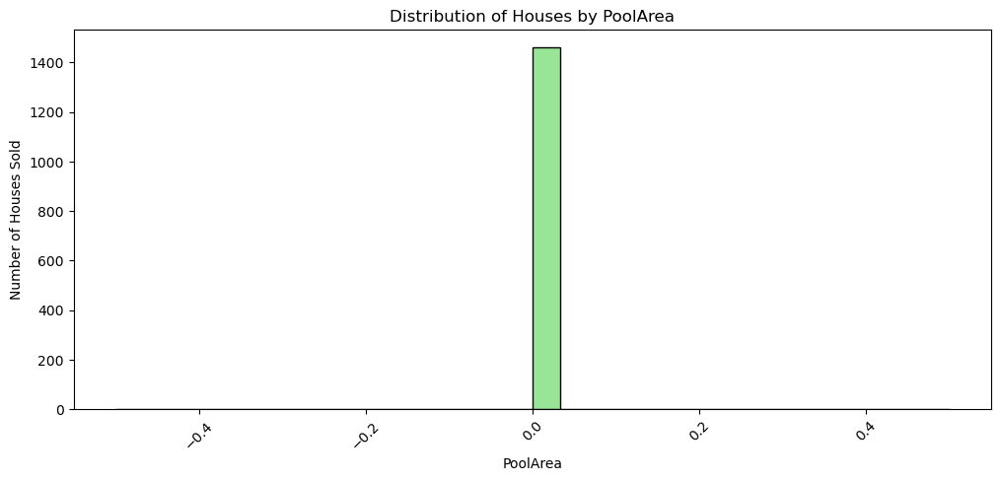

In [140]:
plt.figure(figsize=(12, 5))
sns.histplot(df["PoolArea"], bins=30, kde=True, color="limegreen", edgecolor="black")
plt.title("Distribution of Houses by PoolArea")
plt.xlabel("PoolArea")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**insight**

The distribution shows that the majority of houses have a pool area of 0 square feet, indicating that pools are rare, with only a small number of houses having pools, typically of moderate size.

In [142]:
df["MiscVal"].value_counts()

MiscVal
0.0    1460
Name: count, dtype: int64

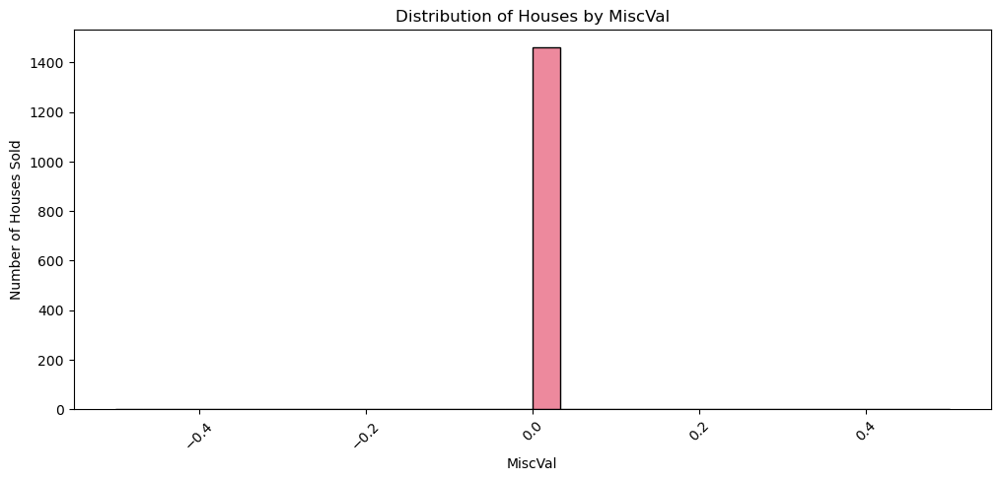

In [143]:
plt.figure(figsize=(12, 5))
sns.histplot(df["MiscVal"], bins=30, kde=True, color="crimson", edgecolor="black")
plt.title("Distribution of Houses by MiscVal")
plt.xlabel("MiscVal")
plt.ylabel("Number of Houses Sold")
plt.xticks(rotation=45)  # Rotates x-axis labels for better readability
plt.show()


**Key insight**

  The distribution indicates that most houses have a miscellaneous value (MiscVal) of 0, suggesting that additional property features (like sheds or other miscellaneous items) are uncommon. A few houses have notable miscellaneous values, likely due to specific extra features.









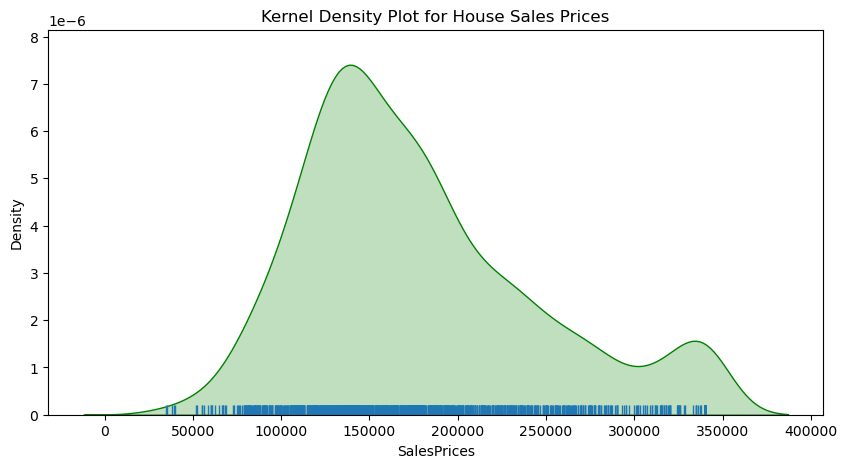

In [144]:
plt.figure(figsize =(10,5))
sns.kdeplot(data=df,x="SalePrice",color = "green",shade = True)
sns.rugplot(data =df,x = 'SalePrice')
plt.title("Kernel Density Plot for House Sales Prices")
plt.xlabel("SalesPrices")
plt.ylabel("Density")
plt.show()

**Key insight**

  The kernel density plot for house sale prices shows a right-skewed distribution, indicating that most houses are sold at lower price ranges, while fewer houses fall into higher price brackets. The rug plot highlights individual data points, confirming the concentration of sales in the lower price range.









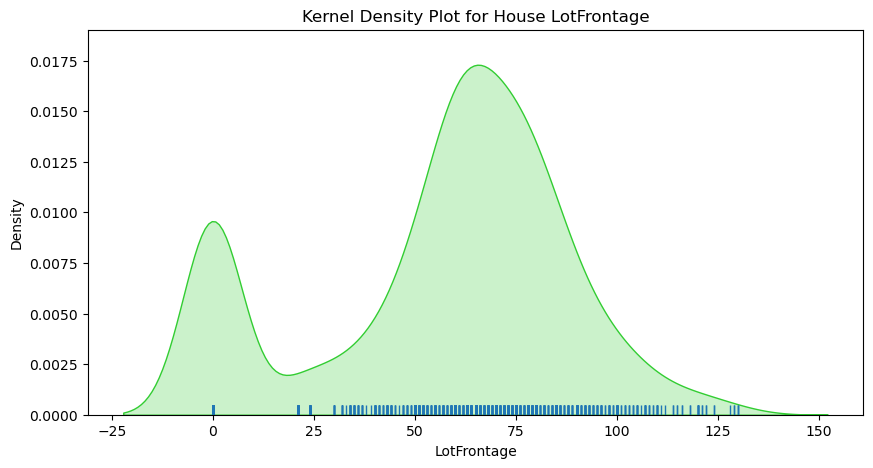

In [149]:
plt.figure(figsize =(10,5))
sns.kdeplot(data=df,x="LotFrontage",color = "limegreen",shade = True)
sns.rugplot(data =df,x = 'LotFrontage')
plt.title("Kernel Density Plot for House LotFrontage")
plt.xlabel("LotFrontage")
plt.ylabel("Density")
plt.show()

**Key insight**

  Most houses have a lot frontage between 60-80 feet, with a few properties showing significantly larger frontages.

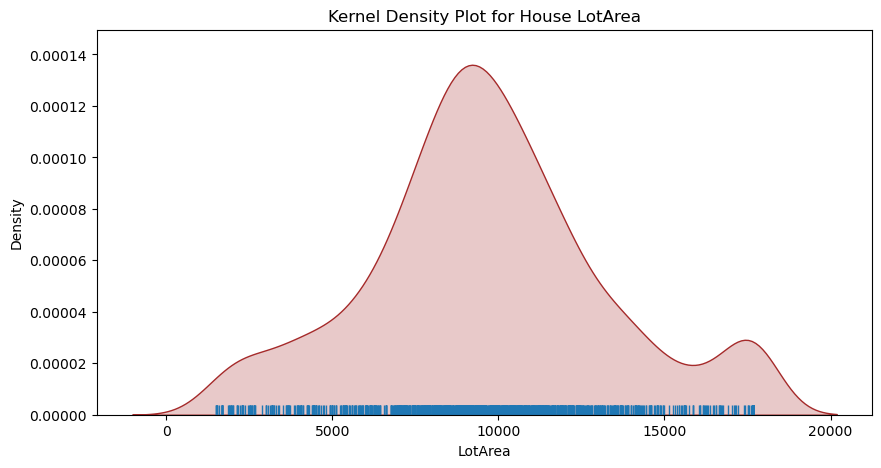

In [150]:
plt.figure(figsize =(10,5))
sns.kdeplot(data=df,x="LotArea",color = "brown",shade = True)
sns.rugplot(data =df,x = 'LotArea')
plt.title("Kernel Density Plot for House LotArea")
plt.xlabel("LotArea")
plt.ylabel("Density")
plt.show()

**insight**

Most houses have a lot area concentrated below 20,000 square feet, with a few outliers having significantly larger lot areas.

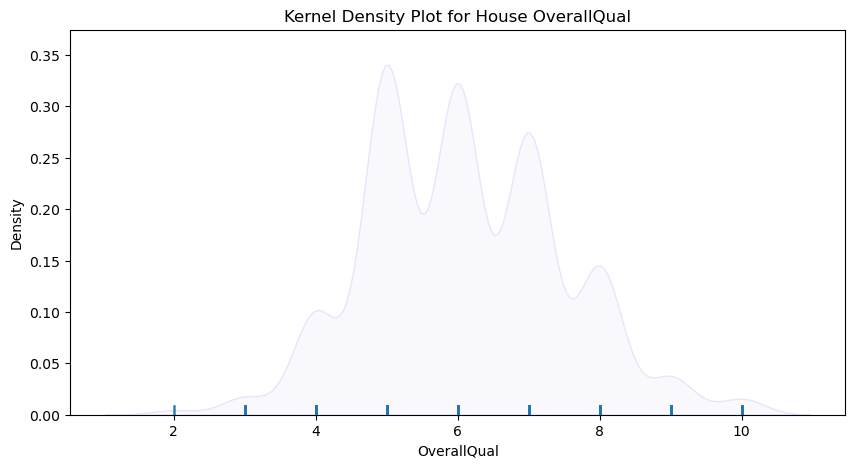

In [153]:
plt.figure(figsize =(10,5))
sns.kdeplot(data=df,x="OverallQual",color = "lavender",shade = True)
sns.rugplot(data =df,x = 'OverallQual')
plt.title("Kernel Density Plot for House OverallQual")
plt.xlabel("OverallQual")
plt.ylabel("Density")
plt.show()

**insight**

Most houses have an overall quality rating between 5 and 7, indicating average to above-average quality, with fewer houses at the extremes.

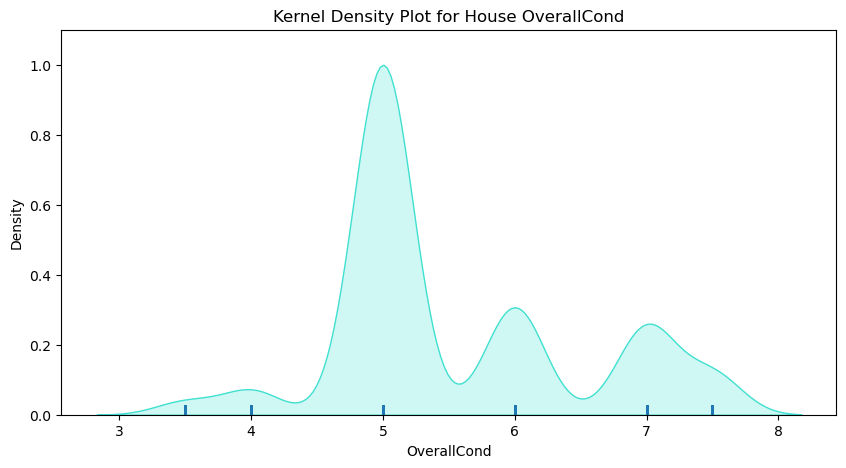

In [156]:
plt.figure(figsize =(10,5))
sns.kdeplot(data=df,x="OverallCond",color = "turquoise",shade = True)
sns.rugplot(data =df,x = 'OverallCond')
plt.title("Kernel Density Plot for House OverallCond")
plt.xlabel("OverallCond")
plt.ylabel("Density")
plt.show()

**insight**

Most houses have an overall condition rating of 5 or 6, indicating average condition, with fewer houses in excellent or poor condition.

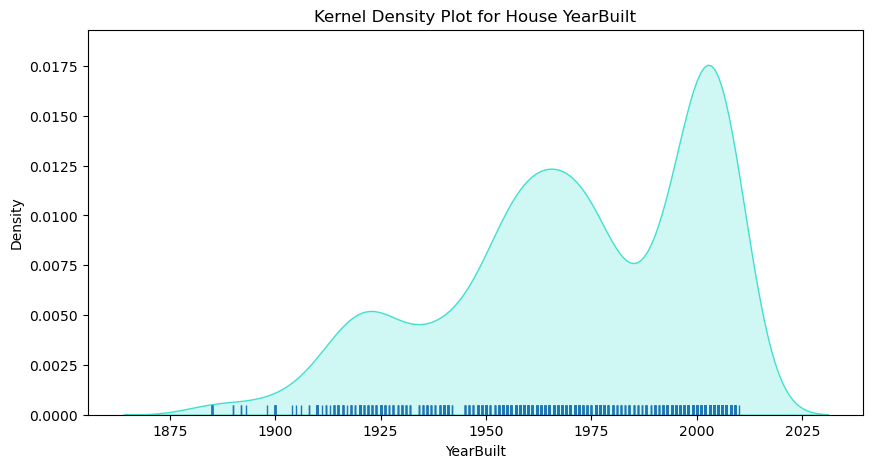

In [158]:
plt.figure(figsize =(10,5))
sns.kdeplot(data=df,x="YearBuilt",color = "turquoise",shade = True)
sns.rugplot(data =df,x = 'YearBuilt')
plt.title("Kernel Density Plot for House YearBuilt")
plt.xlabel("YearBuilt")
plt.ylabel("Density")
plt.show()

**insight**
Most houses were built between 1950 and 2000, with a noticeable peak in construction activity around 2000.

<Figure size 1000x500 with 0 Axes>

<Figure size 1000x500 with 0 Axes>

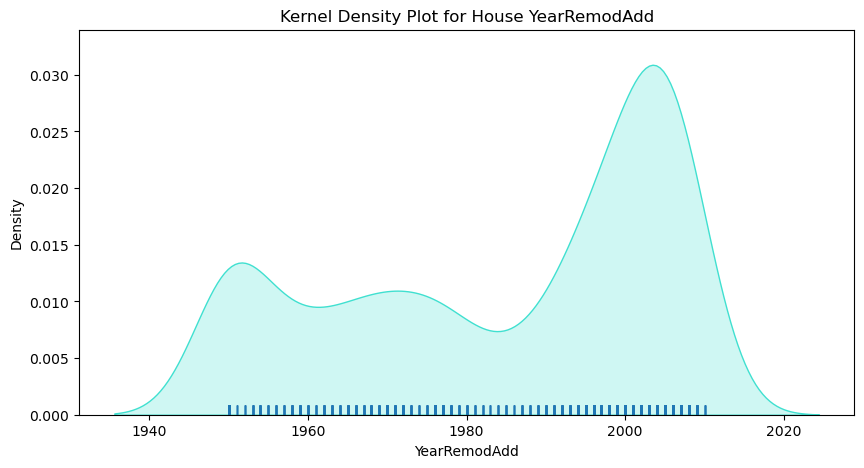

In [162]:
plt.figure(figsize =(10,5))
sns.kdeplot(data=df,x="YearRemodAdd",color = "turquoise",shade = True)
sns.rugplot(data =df,x = 'YearRemodAdd')
plt.title("Kernel Density Plot for House YearRemodAdd")
plt.xlabel("YearRemodAdd")
plt.ylabel("Density")
plt.show()

**Insight**

The majority of house remodels occurred between 1950 and 2010, with a significant peak around 2005.

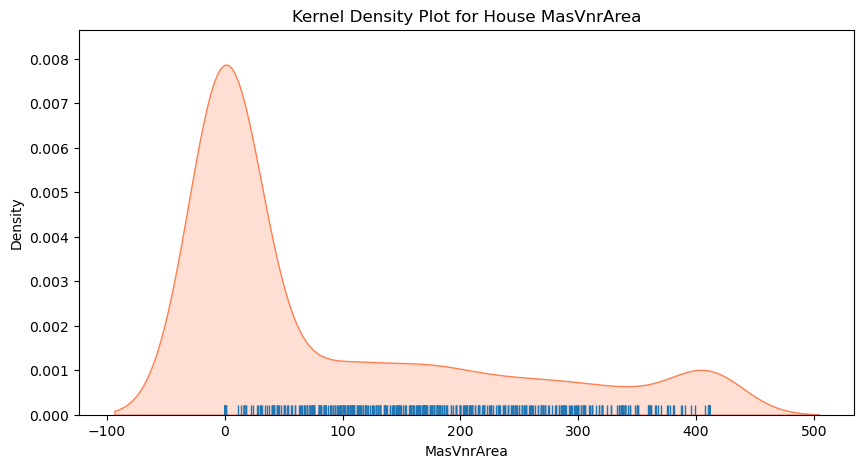

In [163]:
plt.figure(figsize =(10,5))
sns.kdeplot(data=df,x="MasVnrArea",color = "coral",shade = True)
sns.rugplot(data =df,x = 'MasVnrArea')
plt.title("Kernel Density Plot for House MasVnrArea")
plt.xlabel("MasVnrArea")
plt.ylabel("Density")
plt.show()

*insight 

Most houses have a masonry veneer area close to zero, with a small proportion having higher areas.









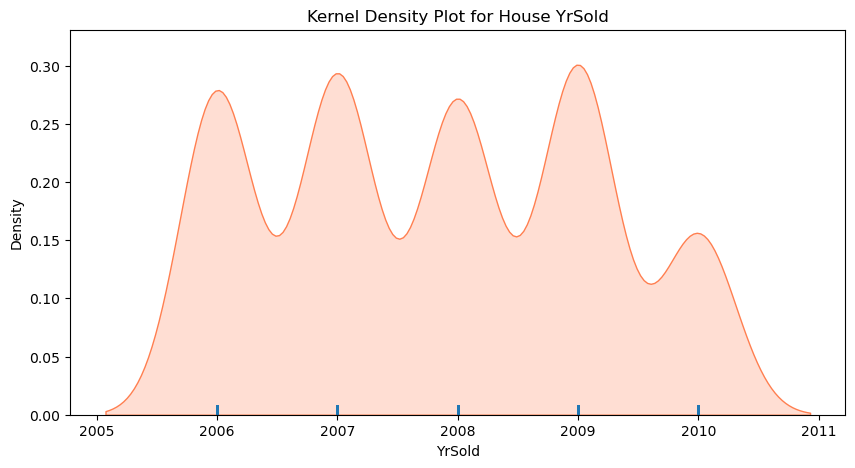

In [164]:
plt.figure(figsize =(10,5))
sns.kdeplot(data=df,x="YrSold",color = "coral",shade = True)
sns.rugplot(data =df,x = 'YrSold')
plt.title("Kernel Density Plot for House YrSold")
plt.xlabel("YrSold")
plt.ylabel("Density")
plt.show()

**insight**

most houses were sold in recent years, with a slight peak towards the latest year in the dataset.
highest 2009 data sold









**Bivariate Analysis**

In [ ]:
#Numerical to numerical Analysis
#Scatter plot

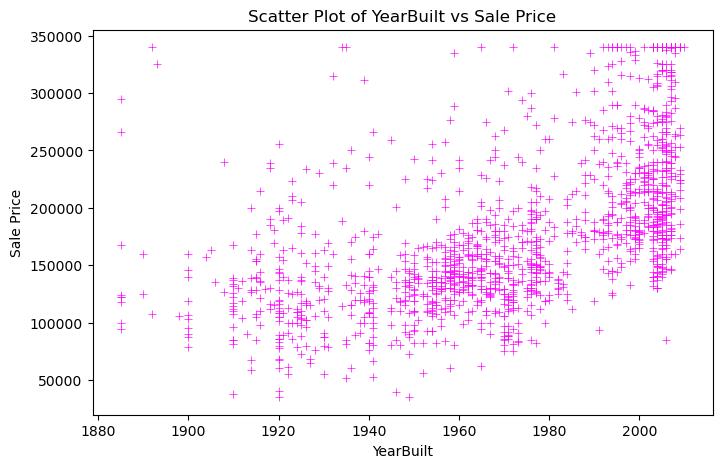

In [176]:
plt.figure(figsize=(8, 5))
sns.scatterplot(x=df['YearBuilt'], y=df['SalePrice'], color='#FF00FF',marker = '+')
plt.title("Scatter Plot of YearBuilt vs Sale Price")
plt.xlabel("YearBuilt")
plt.ylabel("Sale Price")
plt.show()

**insight**


  The scatter plot indicates that homes built in more recent years tend to have higher sale prices, suggesting a positive correlation between 'YearBuilt' and 'SalePrice'

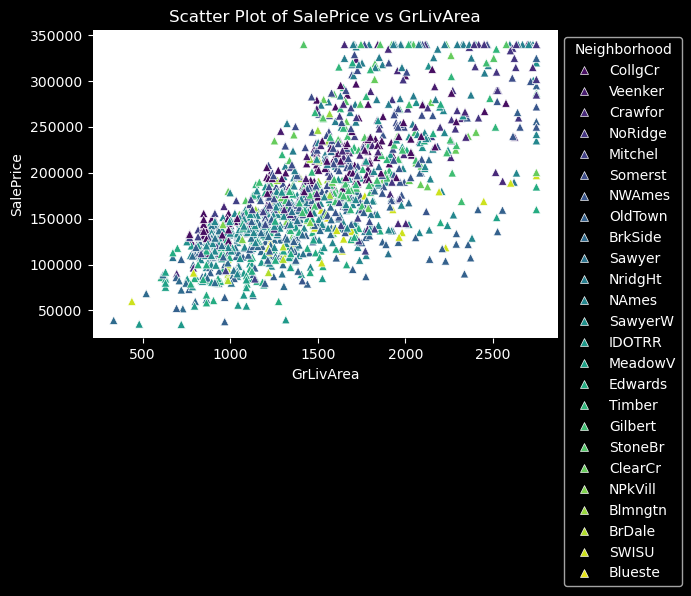

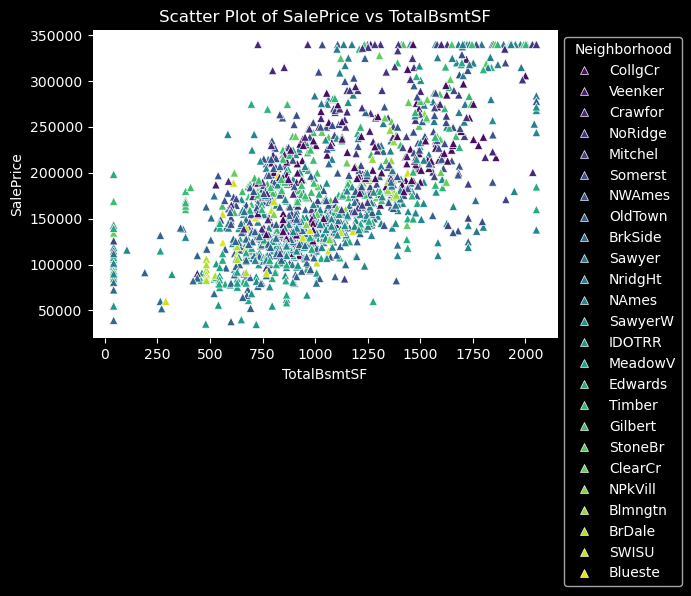

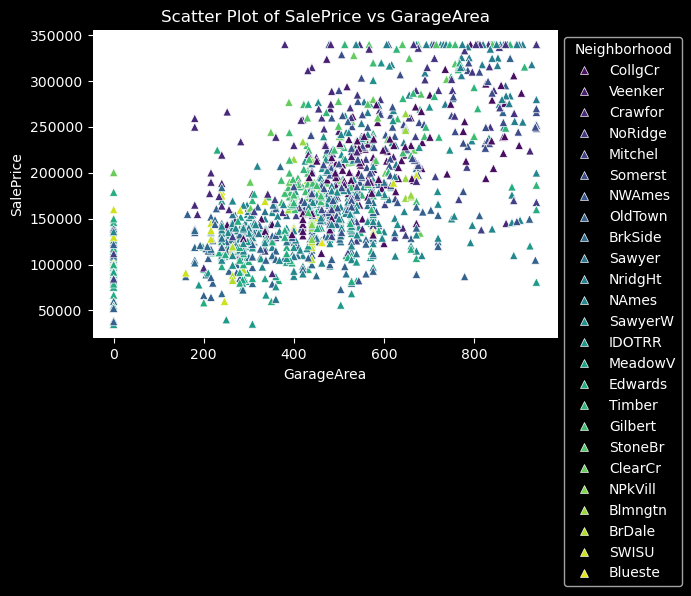

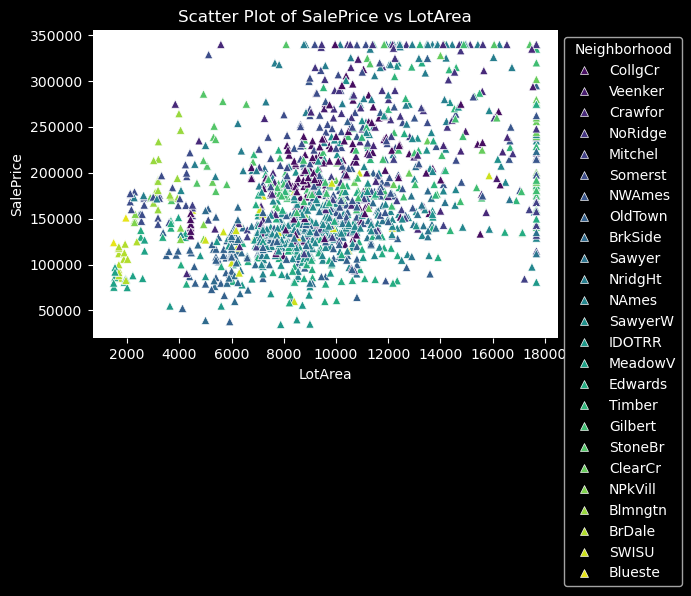

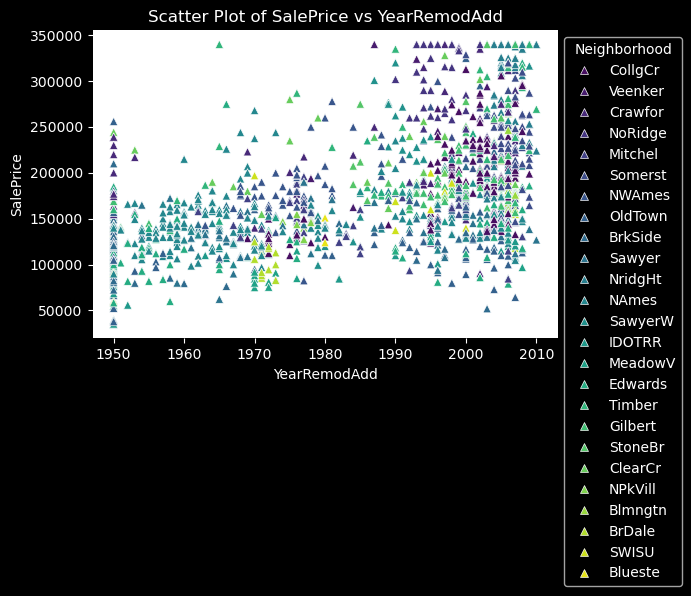

In [211]:
num_cols = ["GrLivArea", "TotalBsmtSF", "GarageArea", "LotArea", "YearRemodAdd"]  # Key numerical variables

for col in num_cols:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(x=df[col], y=df["SalePrice"], hue=df["Neighborhood"], 
                    palette="viridis", marker='^')  # Using Neighborhood as hue
    plt.title(f"Scatter Plot of SalePrice vs {col}")
    plt.xlabel(col)
    plt.ylabel("SalePrice")
    plt.gca().set_facecolor("white") 
    sns.despine(left=True, bottom=True) 
    plt.legend(title="Neighborhood", bbox_to_anchor=(1,1))  # Legend outside
    plt.show()


**insight**
The scatter plots indicate that 'GrLivArea' and 'TotalBsmtSF' have a strong positive correlation with 'SalePrice', while 'GarageArea' and 'LotArea' show a moderate positive correlation

**Bar chart**

  Numerical vs catagorical

In [177]:
df.describe(include=['object'])

,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,MoSold,SaleType,SaleCondition
count,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460,1460
unique,15,5,2,3,4,4,2,5,3,25,9,8,5,8,6,8,15,16,4,4,5,6,5,5,4,7,7,6,5,2,6,4,7,6,7,4,6,6,3,4,5,5,12,9,6
top,SC20,RL,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,0,TA,TA,PConc,TA,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,No,Attchd,Unf,TA,TA,Y,No,No,No,Jun,WD,Normal
freq,536,1151,1454,1369,925,1311,1459,1052,1382,225,1260,1445,1220,726,1141,1434,515,504,872,906,1282,647,649,1311,991,430,1256,1428,741,1365,1334,735,1360,690,870,605,1311,1326,1340,1453,1179,1406,253,1267,1198


In [178]:
df.describe()

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.0,1460.000000,1460.000000,1460.000000,1460.000000,1460.0,1460.000000,1460.000000,1460.0,1460.000000,1460.000000,1460.000000,1460.0,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.0,1460.0,1460.0,1460.0,1460.0,1460.000000,1460.000000
mean,56.306849,9647.388014,6.100685,5.543493,1971.299315,1984.865753,89.406336,439.997517,0.0,563.777740,1050.254795,1157.018151,346.789041,0.0,1503.735873,0.425000,0.0,1.565068,0.382877,2.851712,1.0,6.487671,0.611301,1973.790068,1.765411,470.670719,91.806849,42.603425,0.0,0.0,0.0,0.0,0.0,2007.815753,177331.526370
std,31.795445,3594.356399,1.378430,0.963696,30.108397,20.645407,134.017553,433.219435,0.0,431.710214,397.937878,362.583002,435.791621,0.0,481.375641,0.517373,0.0,0.550916,0.502885,0.759516,0.0,1.541916,0.638959,30.897495,0.742753,207.105729,116.658120,52.501584,0.0,0.0,0.0,0.0,0.0,1.328095,67205.835915
min,0.000000,1481.500000,2.000000,3.500000,1885.000000,1950.000000,0.000000,0.000000,0.0,0.000000,42.000000,334.000000,0.000000,0.0,334.000000,0.000000,0.0,0.000000,0.000000,0.500000,1.0,2.000000,0.000000,1893.500000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,2006.000000,34900.000000
25%,42.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.0,223.000000,795.750000,882.000000,0.000000,0.0,1129.500000,0.000000,0.0,1.000000,0.000000,2.000000,1.0,5.000000,0.000000,1958.000000,1.000000,334.500000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,2007.000000,129975.000000
50%,63.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.0,477.500000,991.500000,1087.000000,0.000000,0.0,1464.000000,0.000000,0.0,2.000000,0.000000,3.000000,1.0,6.000000,1.000000,1977.000000,2.000000,480.000000,0.000000,25.000000,0.0,0.0,0.0,0.0,0.0,2008.000000,163000.000000
75%,78.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.0,808.000000,1298.250000,1391.250000,728.000000,0.0,1776.750000,1.000000,0.0,2.000000,1.000000,3.000000,1.0,7.000000,1.000000,2001.000000,2.000000,576.000000,168.000000,68.000000,0.0,0.0,0.0,0.0,0.0,2009.000000,214000.000000
max,130.000000,17673.500000,10.000000,7.500000,2010.000000,2010.000000,410.625000,1780.625000,0.0,1685.500000,2052.000000,2155.125000,1820.000000,0.0,2747.625000,2.500000,0.0,3.000000,2.000000,4.500000,1.0,10.000000,2.500000,2010.000000,3.500000,938.250000,420.000000,170.000000,0.0,0.0,0.0,0.0,0.0,2010.000000,340037.500000


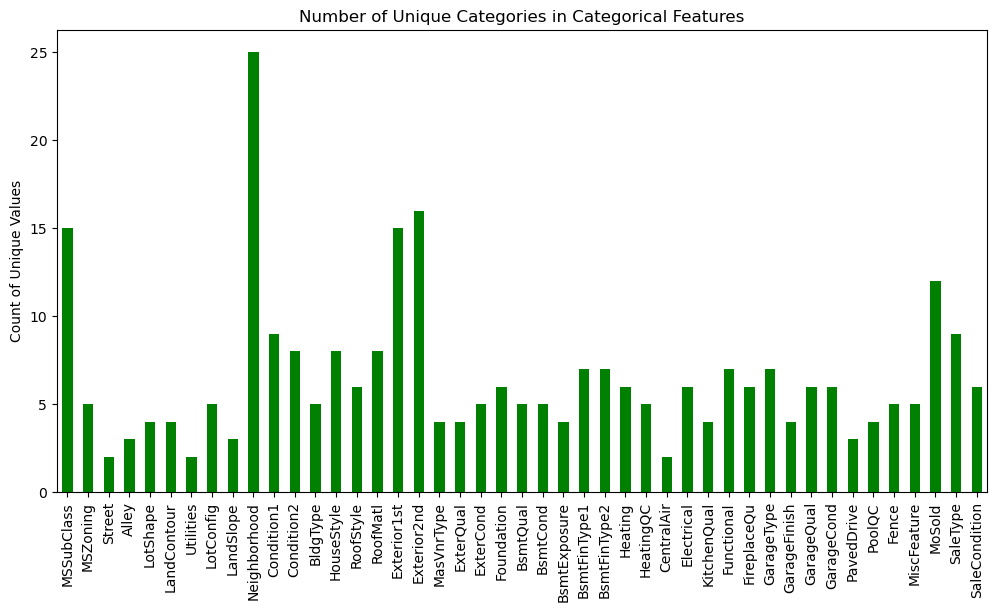

In [183]:
# Categorical summary
cat_summary = df.describe(include=['object']).transpose()

plt.figure(figsize=(12, 6))
cat_summary["unique"].plot(kind='bar', color='green')  # 'unique' counts number of categories
plt.title("Number of Unique Categories in Categorical Features")
plt.ylabel("Count of Unique Values")
plt.xticks(rotation=90)
plt.show()


**insight**

The bar chart illustrates the number of unique categories within each categorical feature of the dataset, highlighting the varying levels of categorical diversity across these features.
esme highest neighorthood h

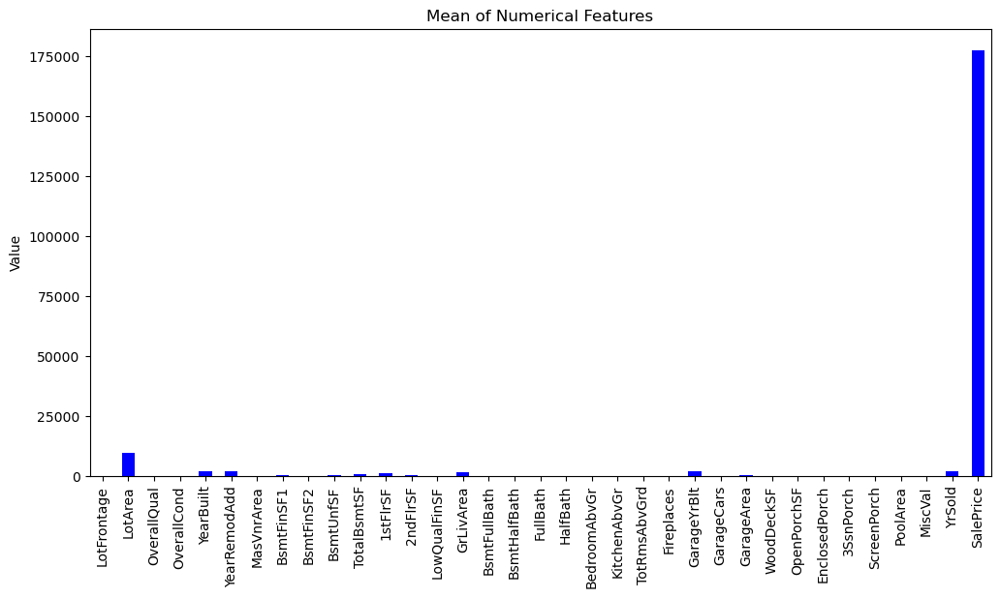

In [181]:
# Numerical summary
num_summary = df.describe().transpose()  # Transpose to make indexing easier

plt.figure(figsize=(12, 6))
num_summary["mean"].plot(kind='bar', color='blue')  # You can also plot 'std' or '50%'
plt.title("Mean of Numerical Features")
plt.ylabel("Value")
plt.xticks(rotation=90)
plt.show()


**insight**

The bar chart displays the mean values of various numerical features in the dataset, allowing for a straightforward comparison of their central tendencies

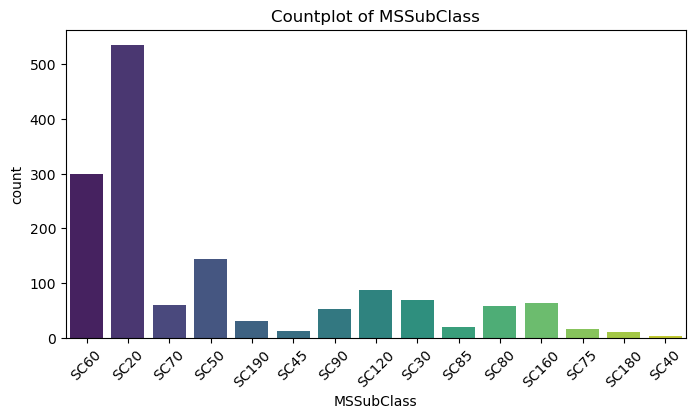

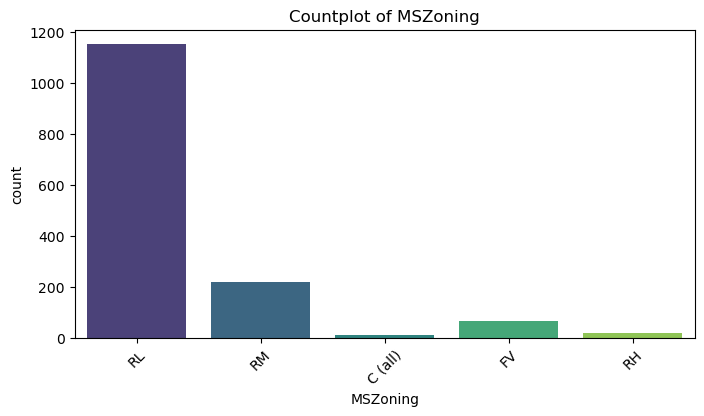

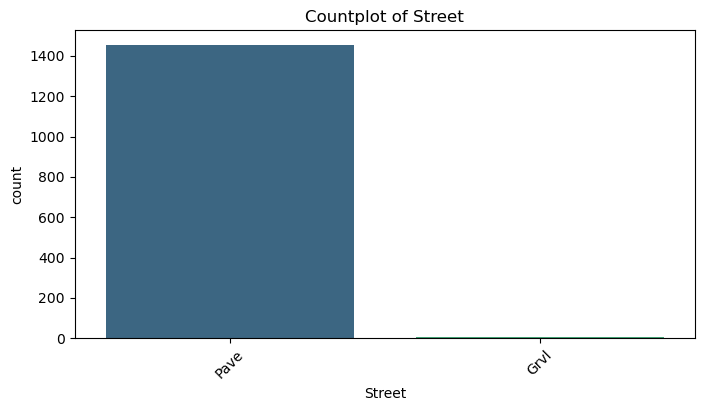

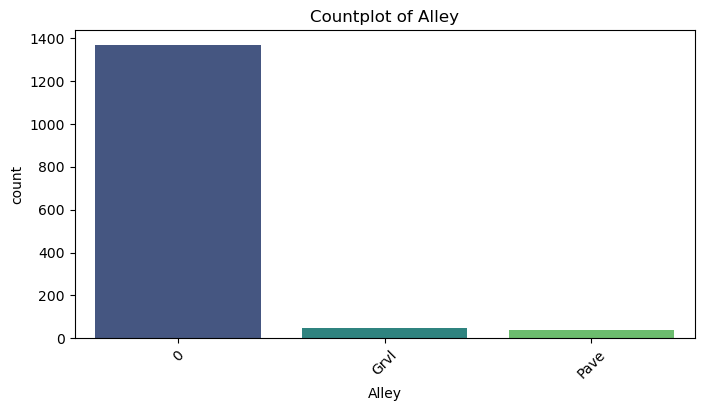

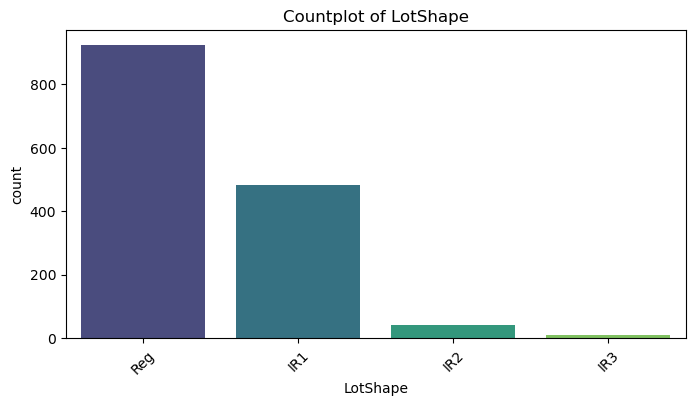

...

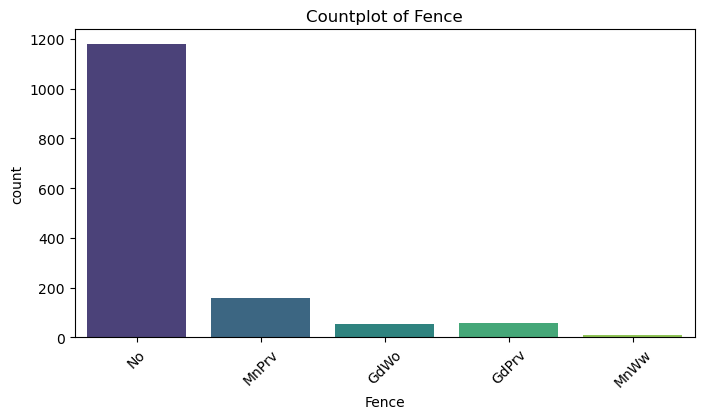

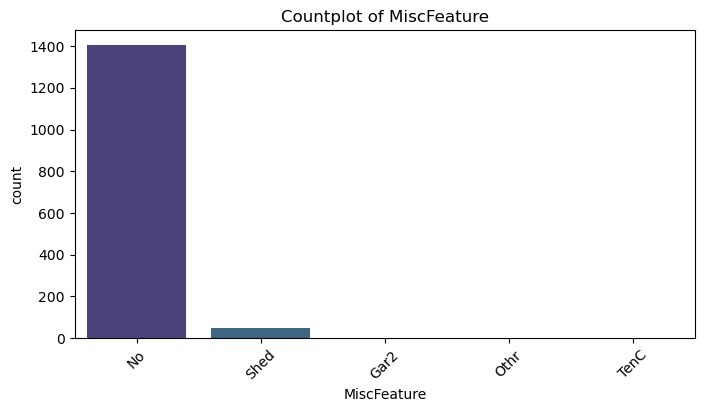

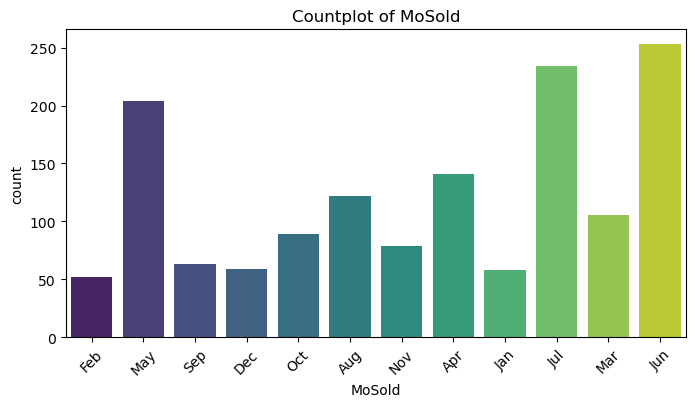

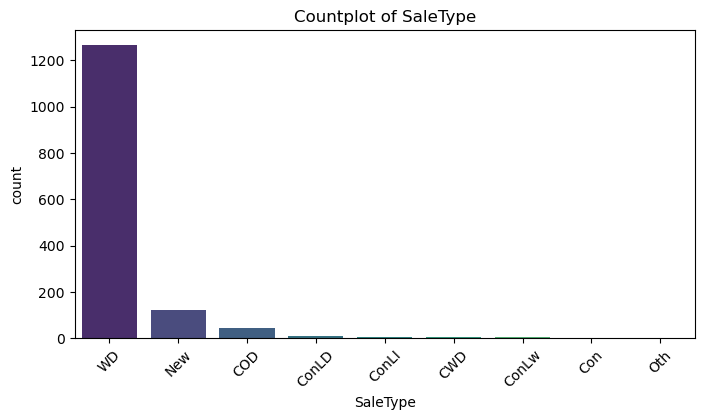

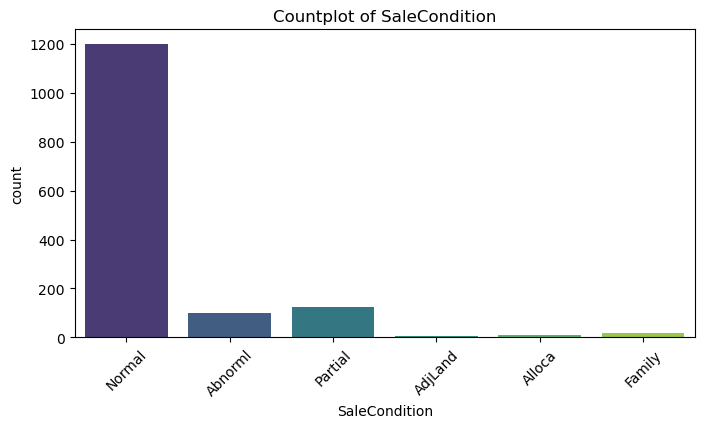

In [182]:
## All countplot catagorical to numerical sath me 
cat_cols = df.select_dtypes(include=['object']).columns  # Extract categorical columns

for col in cat_cols:
    plt.figure(figsize=(8, 4))
    sns.countplot(x=df[col], palette="viridis")
    plt.xticks(rotation=45)
    plt.title(f"Countplot of {col}")
    plt.show()


**Insight**

1. The count plot of MSSubClass shows that SC20 is the most common category, followed by SC60, indicating that these house types dominate the dataset. On the other hand, SC40, SC180, and SC75 have the lowest counts, suggesting they are less frequent in the dataset

2. The MSZoning count plot shows that RL (Residential Low Density) is the most common zoning category, while C (all) and RH are the least frequent, indicating that most properties belong to low-density residential areas.

3. The Street count plot shows that almost all properties have paved roads, while gravel roads are extremely rare, indicating that most houses are in well-developed areas with proper road infrastructure.

4. The Alley count plot shows that most properties do not have alley access, while gravel and paved alleys are rare, indicating that alleyways are not a common feature in this dataset.

5. The LotShape count plot shows that most properties have a regular (Reg) lot shape, while irregular lot shapes (IR1, IR2, IR3) are less common, indicating that standard rectangular lots dominate the dataset.

6. The LandContour count plot shows that the majority of properties are on level (Lvl) land, while other contours like banked (Bnk), low (Low), and hilly (HLS) terrains are much less common.

7. The Utilities count plot indicates that almost all properties have all public utilities (AllPub), while very few lack sewer and water services (NoSeWa).

8. The LotConfig count plot shows that the majority of properties are located in inside lots, followed by corner lots, while cul-de-sac and frontage road properties are less common.

9. The LandSlope count plot shows that the majority of properties have a gentle slope (Gtl), while properties with moderate (Mod) or severe (Sev) slopes are much less common.

10. The Neighborhood count plot reveals that some neighborhoods have significantly higher property listings than others. Notably:

NAmes has the highest number of properties.
CollgCr also has a relatively high number of properties.
Several neighborhoods, such as Blueste, NPkVill, and ClearCr, have very few properties listed.
This distribution suggests that most real estate data in this dataset is concentrated in a few neighborhoods, which may impact pricing trends and analysis.

11. The Condition1 count plot indicates that:

The vast majority of properties fall under the "Norm" category, meaning they are in standard conditions relative to roads, railroads, or other features.
Other conditions like "Feedr" (adjacent to a feeder street) and "Artery" (near a major road) have significantly fewer properties.
Rare conditions such as "PosA", "RRNe", and "RRAn" have very minimal representation.
This suggests that most properties are in standard locations, which could imply limited impact of condition-based location factors on overall pricing trends. However, properties in less common categories may need deeper analysis to understand their price influence.

12.The Condition2 count plot reveals that:

Almost all properties fall under "Norm", meaning they do not have a secondary significant proximity condition.
Other conditions such as "Artery," "Feedr," and "RRNn" appear in extremely low numbers.
The rarity of non-"Norm" values suggests that Condition2 may have minimal influence on price variations unless combined with Condition1 for deeper analysis.
Since Condition2 has limited variation, it may not be a strong predictor in modeling unless rare cases exhibit unique pricing trends.

13.Vinyl siding is the most common exterior material, followed by Metal Siding and Wood Siding, while other materials are significantly less frequent.

14.Houses are most frequently sold in June and July, with a notable peak in May as well.






**Pie Chart**


numerical vs catagorical

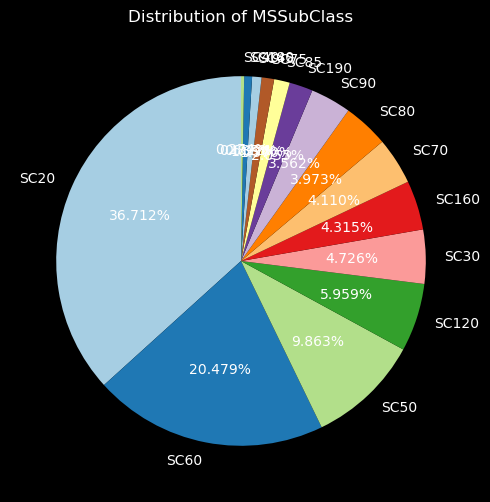

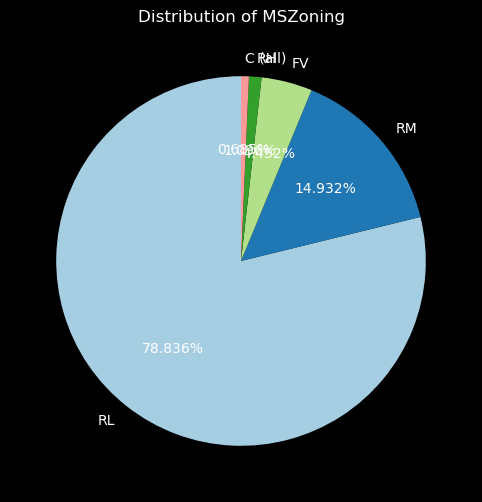

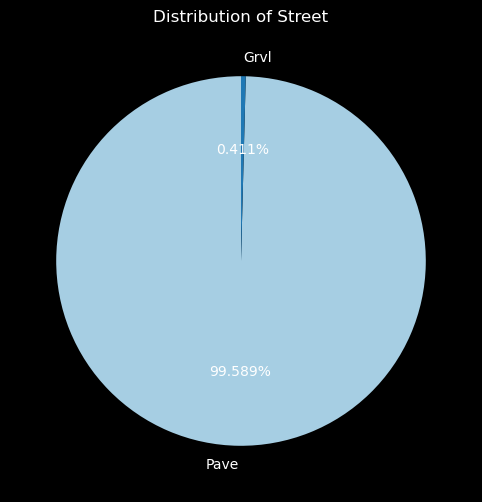

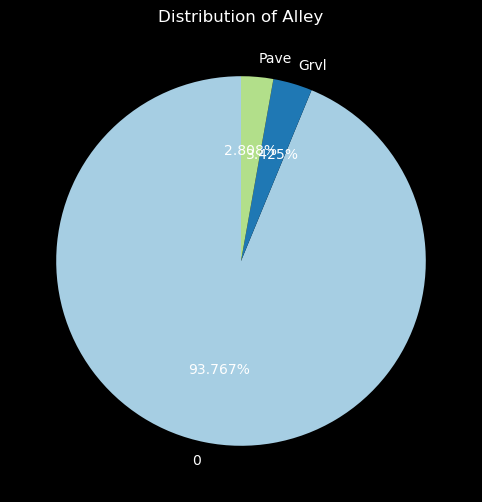

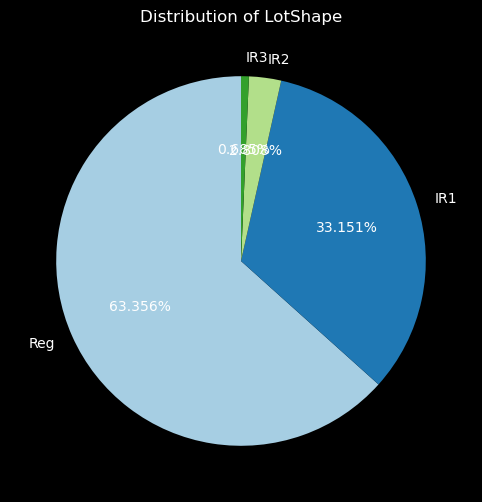

...

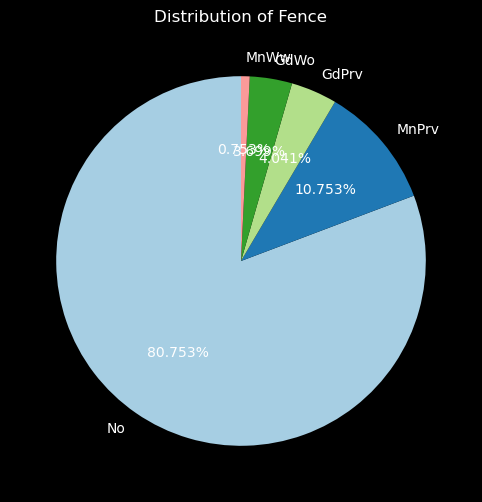

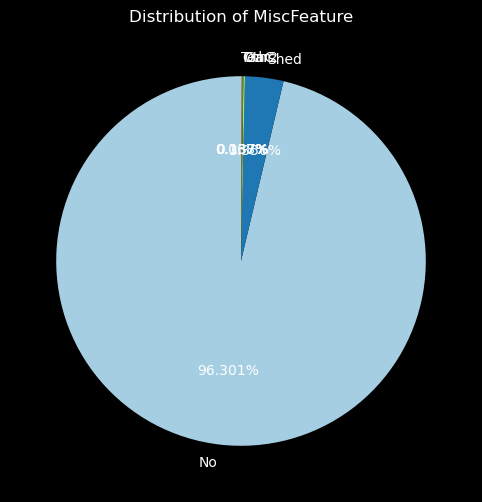

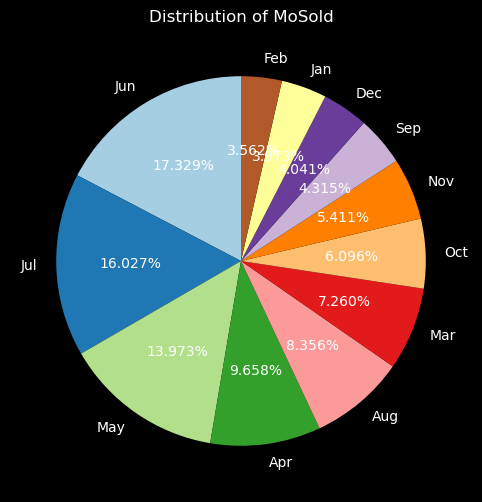

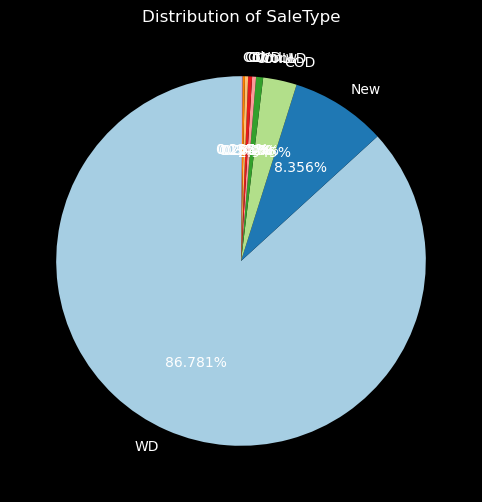

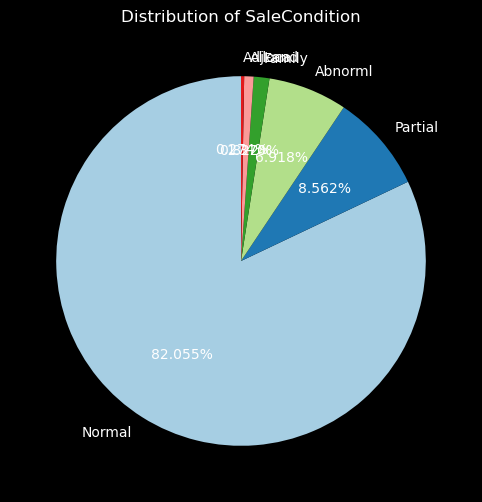

In [205]:

cat_cols = df.select_dtypes(include=['object']).columns  # Extract categorical columns

for col in cat_cols:
    plt.figure(figsize=(8, 6))
    plt.style.use('dark_background')
    df[col].value_counts().plot.pie(autopct='%0.3f%%', colors=plt.cm.Paired.colors, startangle=90)
    plt.title(f"Distribution of {col}")
    plt.ylabel('')  # Hide y-label for better visualization

    plt.show()


In [186]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

**Strip plot**

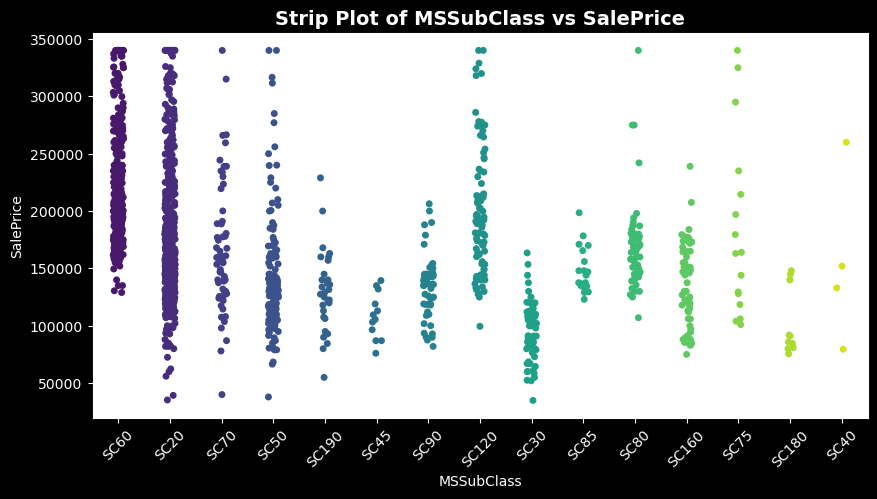

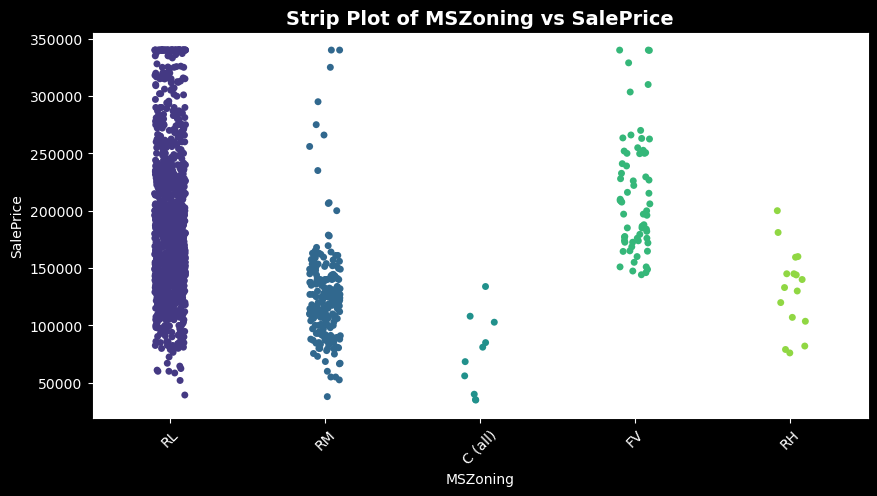

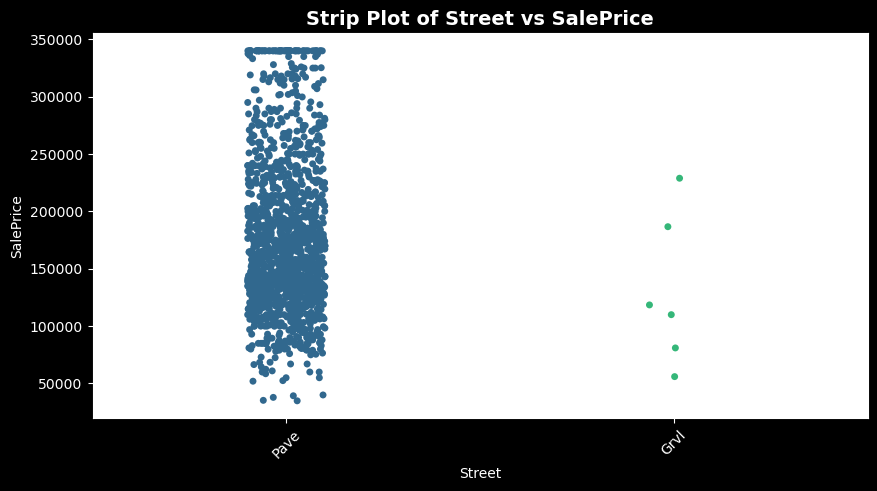

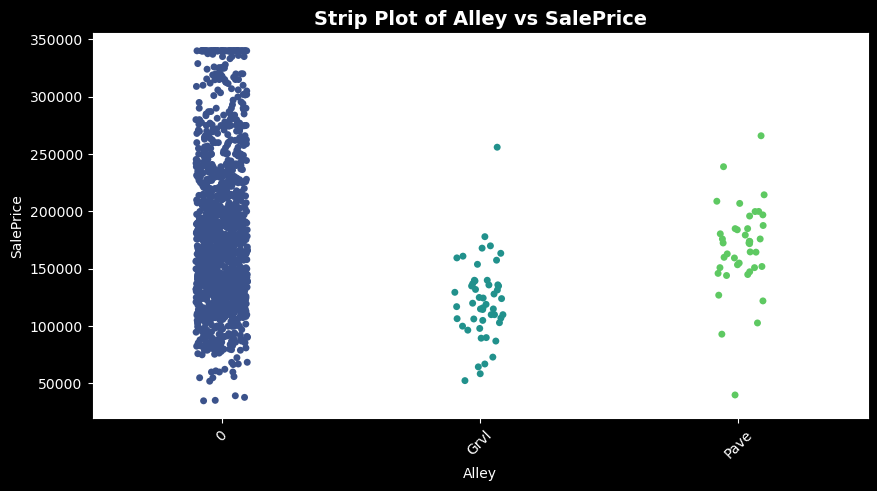

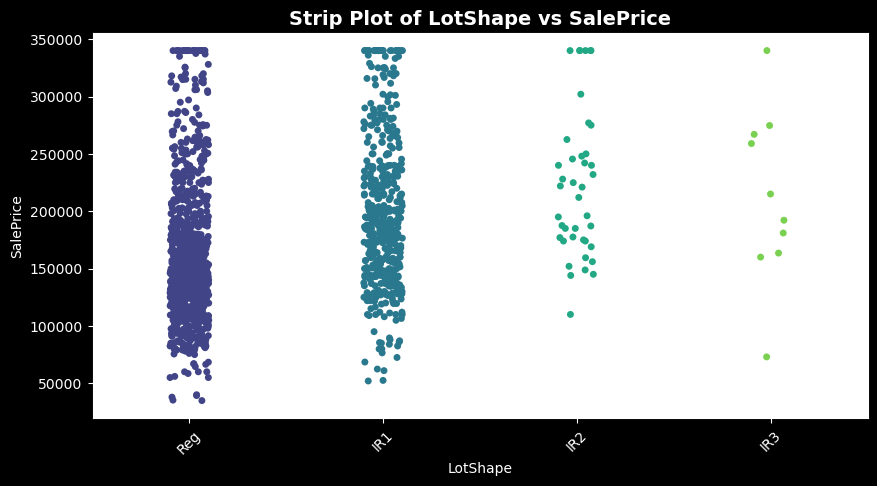

...

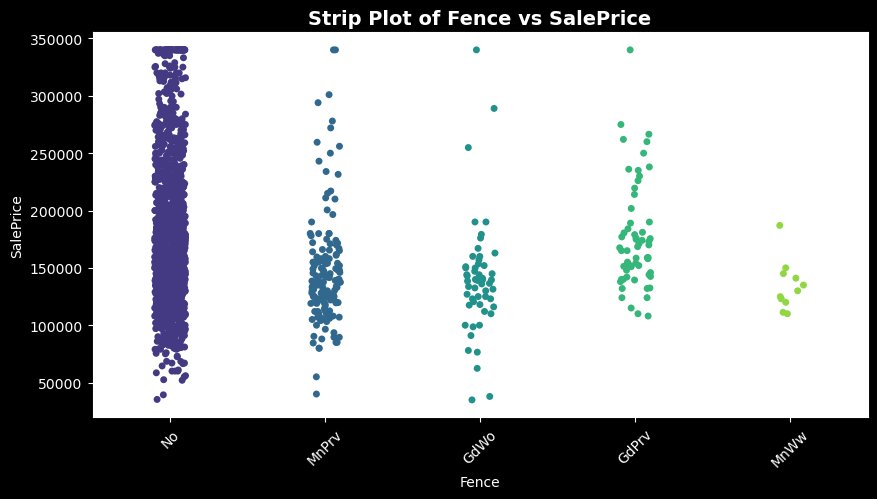

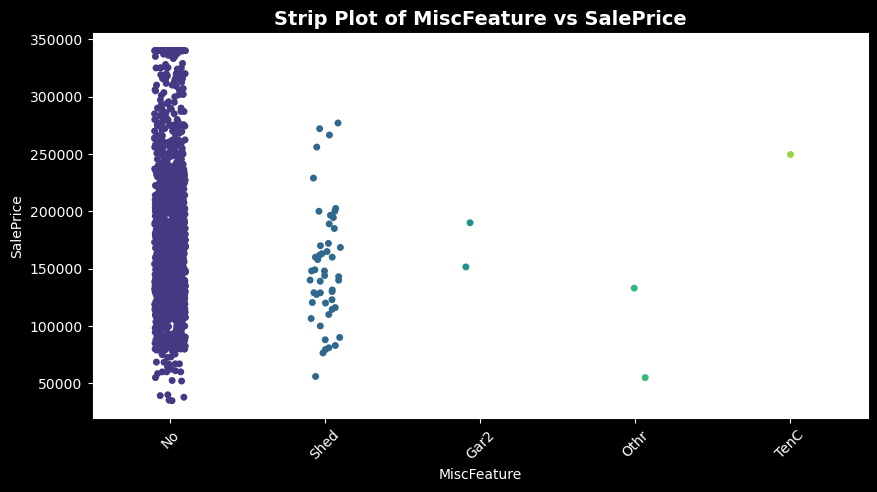

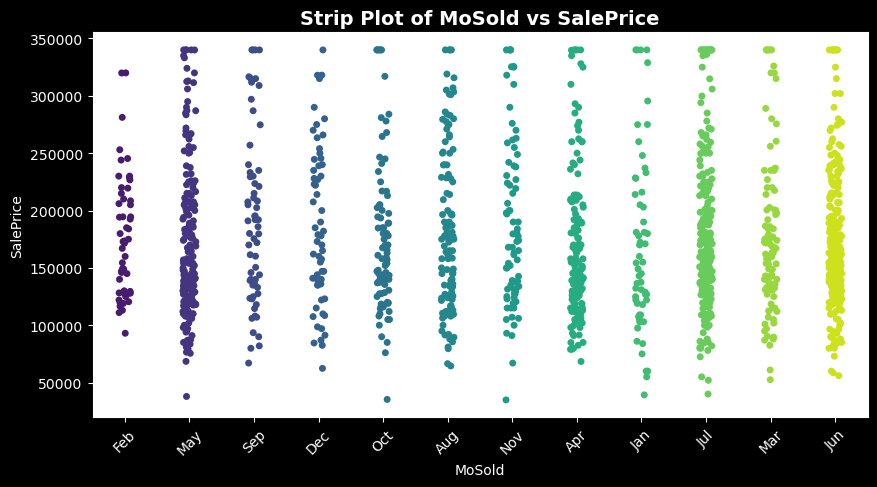

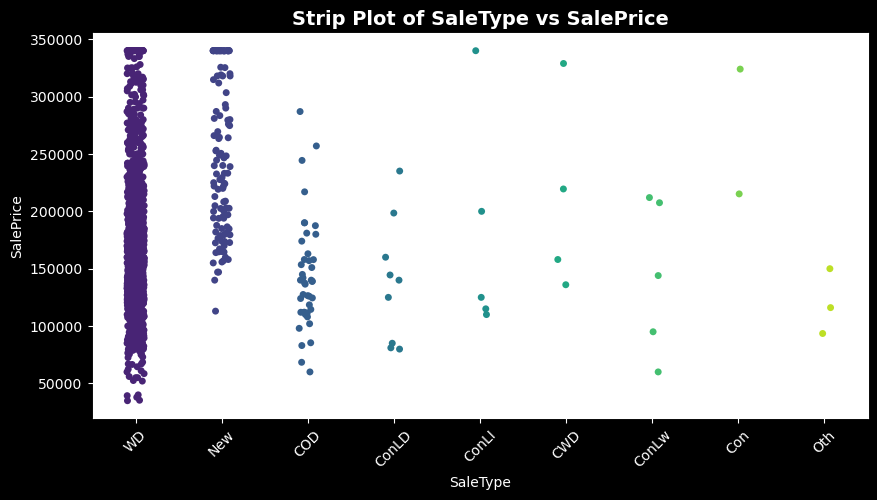

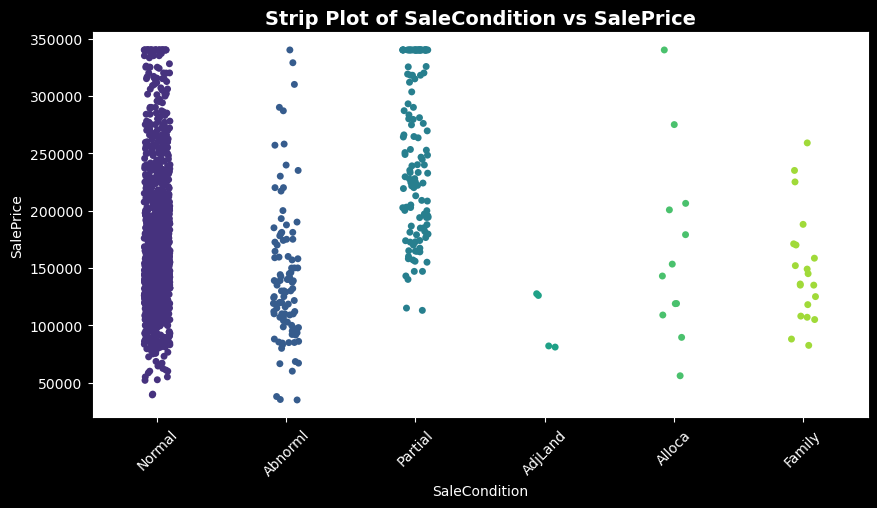

In [199]:
cat_cols = df.select_dtypes(include=['object']).columns  # Extract categorical columns

for col in cat_cols:
    plt.figure(figsize=(10, 5))
    sns.stripplot(x=df[col], y=df['SalePrice'], jitter=True, palette="viridis")
    plt.xticks(rotation=45)
    plt.title(f"Strip Plot of {col} vs SalePrice", fontsize=14, fontweight="bold")
    plt.gca().set_facecolor("white")  
    plt.show()


**Barplot**

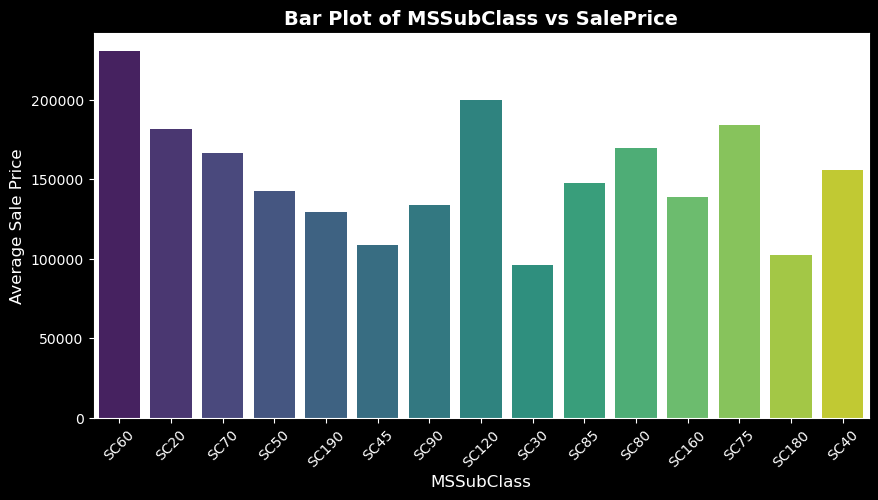

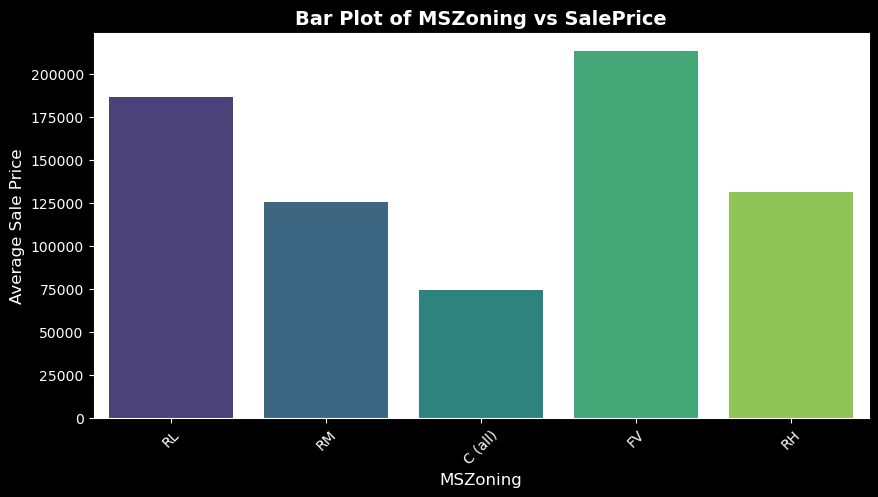

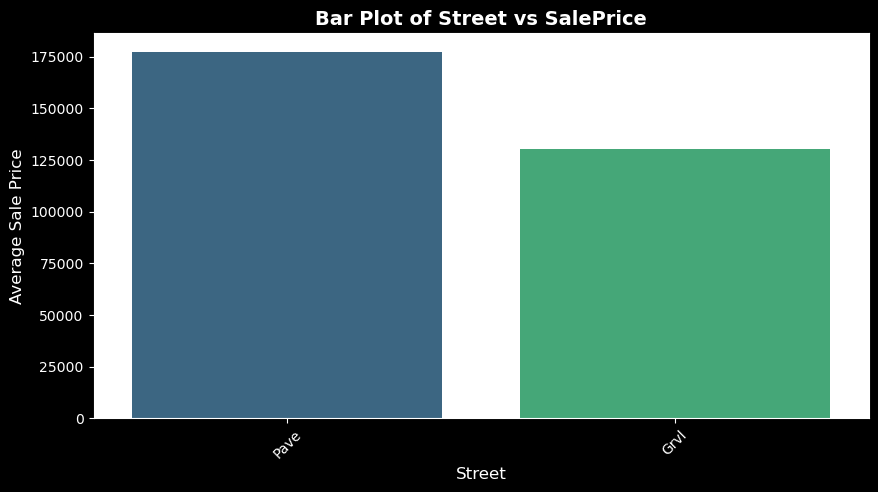

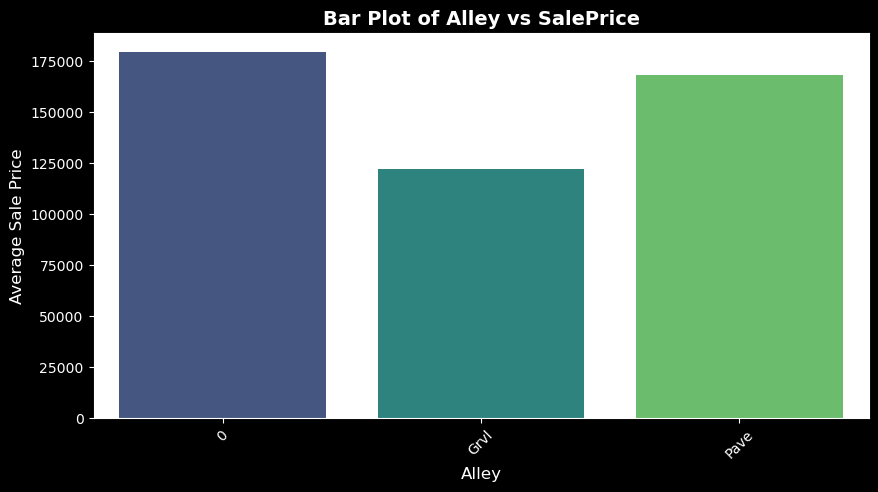

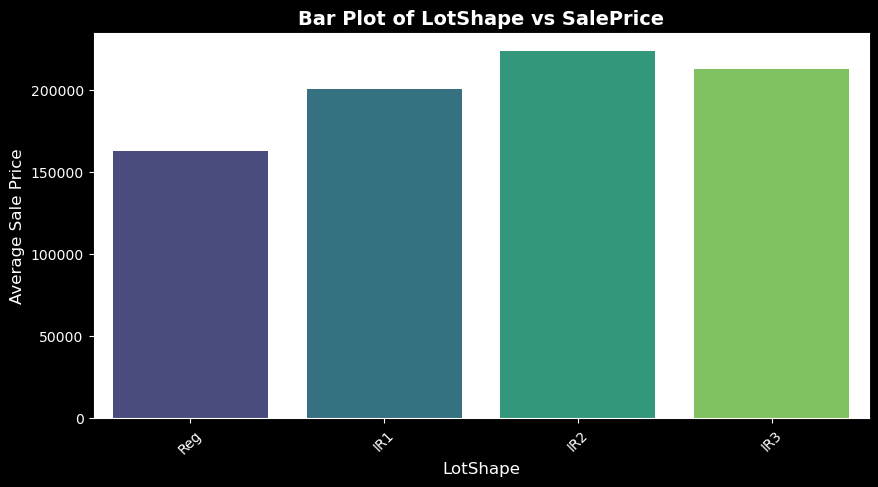

...

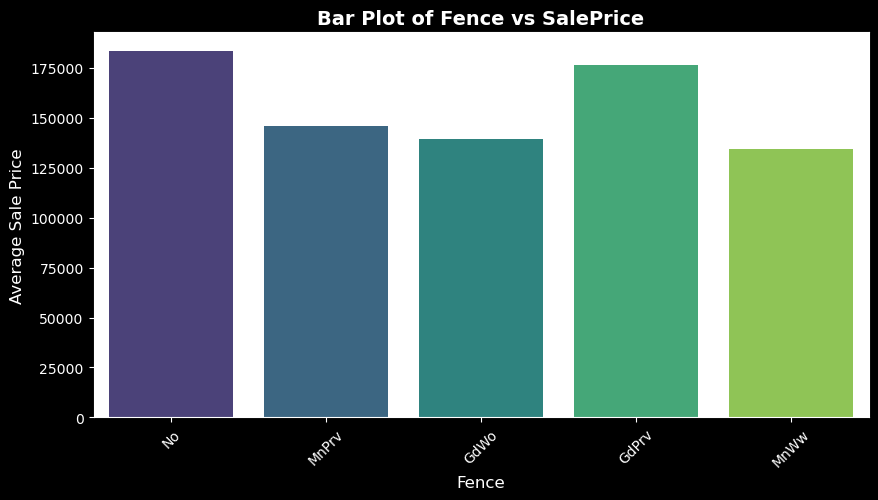

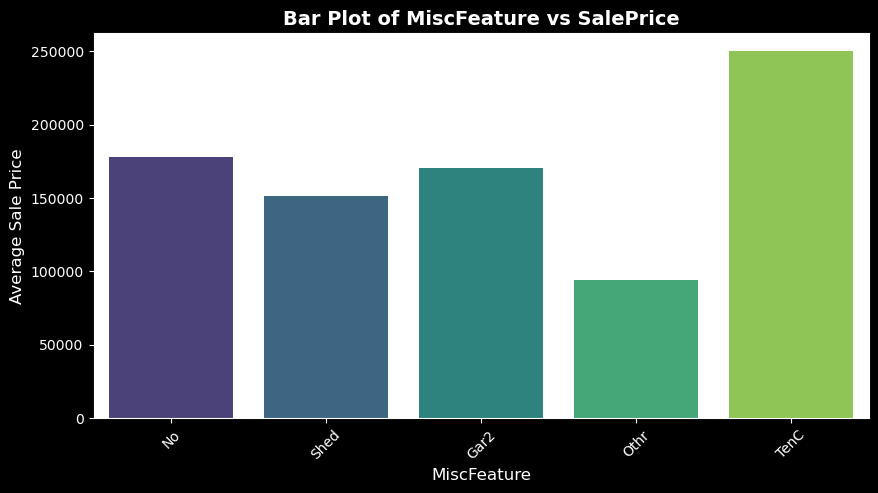

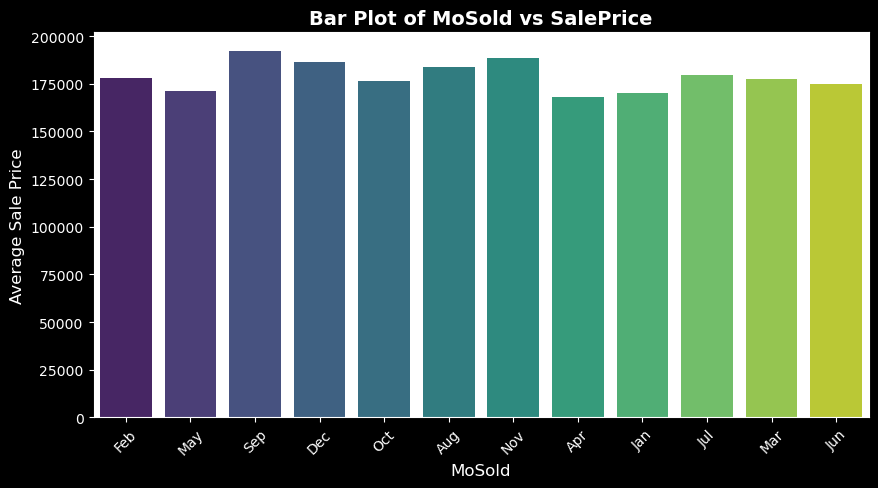

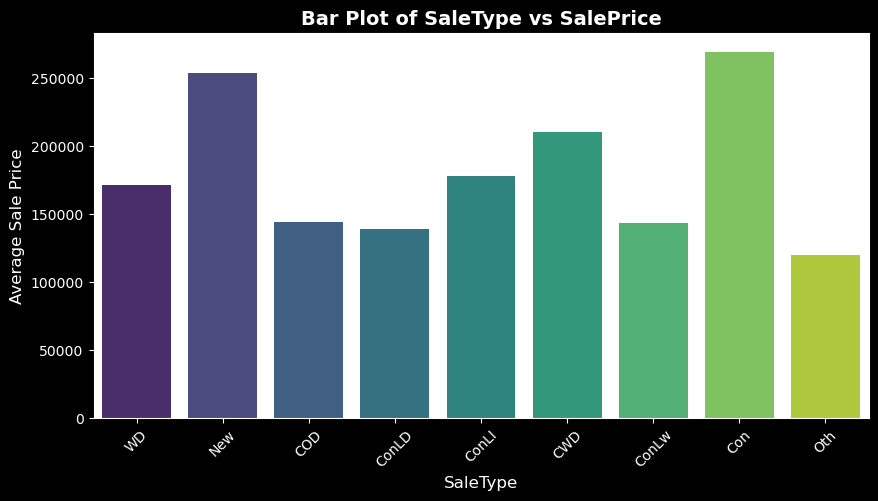

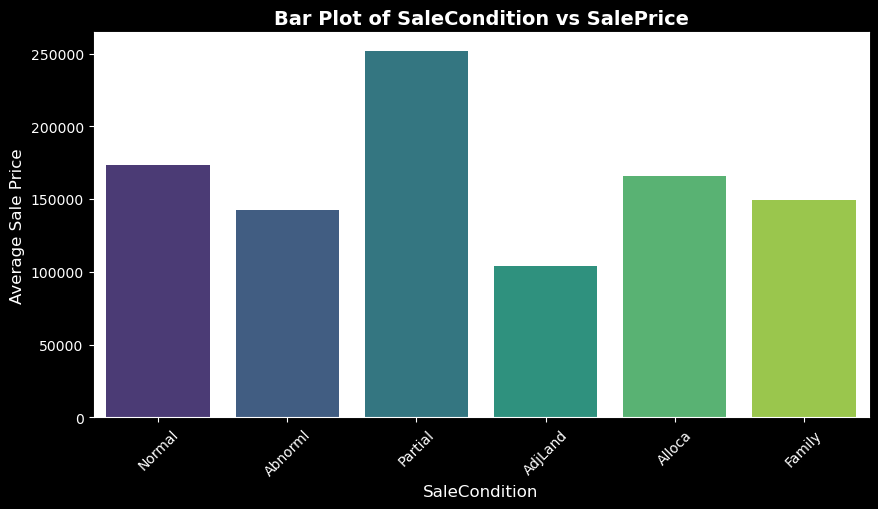

In [196]:
for col in cat_cols:
    plt.figure(figsize=(10, 5))
    sns.barplot(x=df[col], y=df['SalePrice'], palette="viridis", ci=None)
    plt.xticks(rotation=45)
    plt.title(f"Bar Plot of {col} vs SalePrice", fontsize=14, fontweight="bold")
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Average Sale Price", fontsize=12)
    plt.gca().set_facecolor("white")  
    plt.show()

**Boxplot**

In [25]:
# Creating boxplots for each numerical column
for col in num_cols:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=df[cat_col], y=df[col], palette="viridis")
    plt.title(f"Boxplot of {col} by {cat_col}")
    plt.xticks(rotation=45)
    plt.gca().set_facecolor("white")  
    plt.show()


NameError: name 'cat_col' is not defined

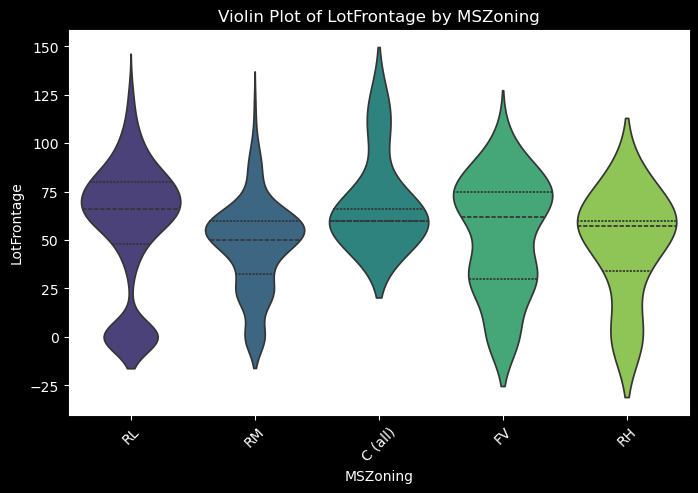

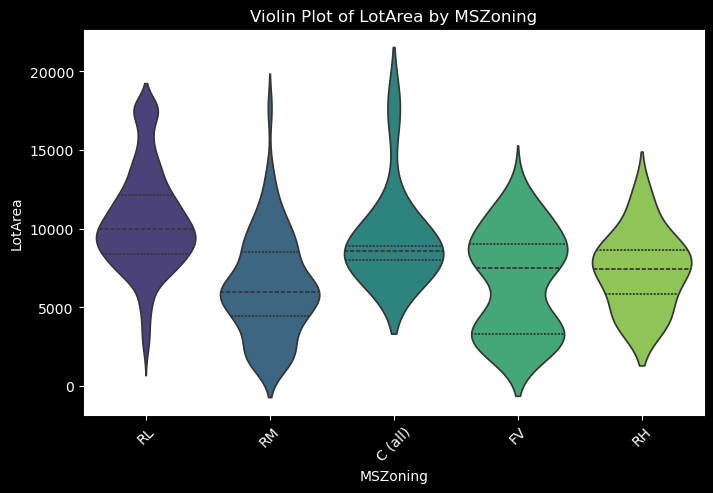

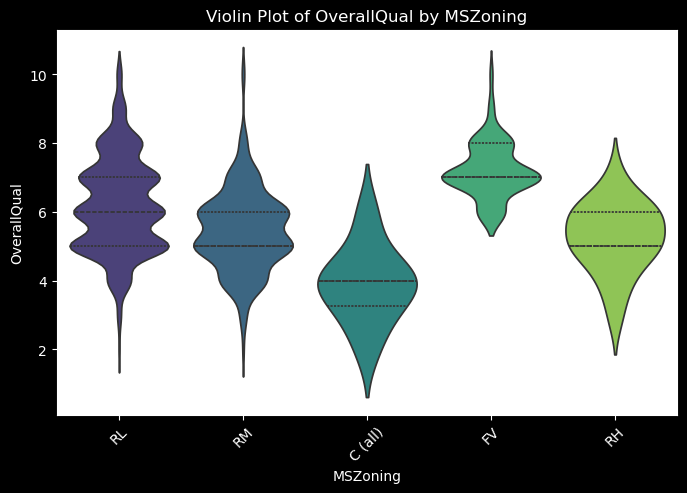

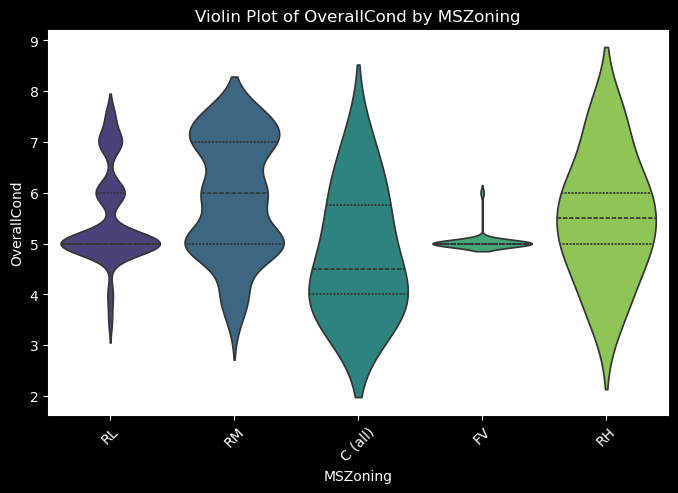

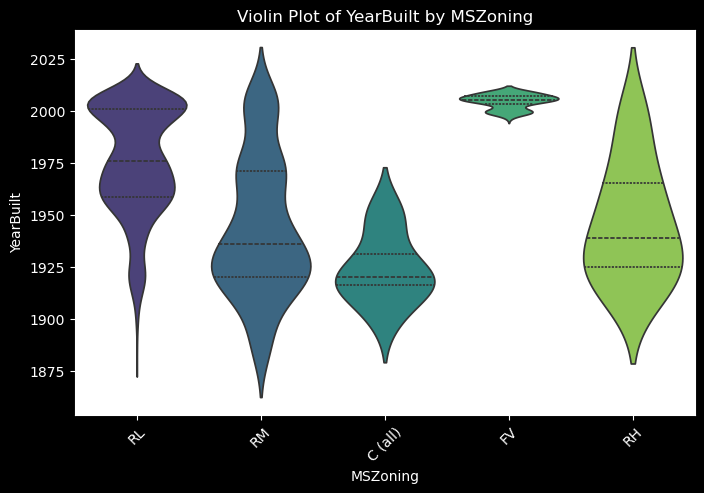

...

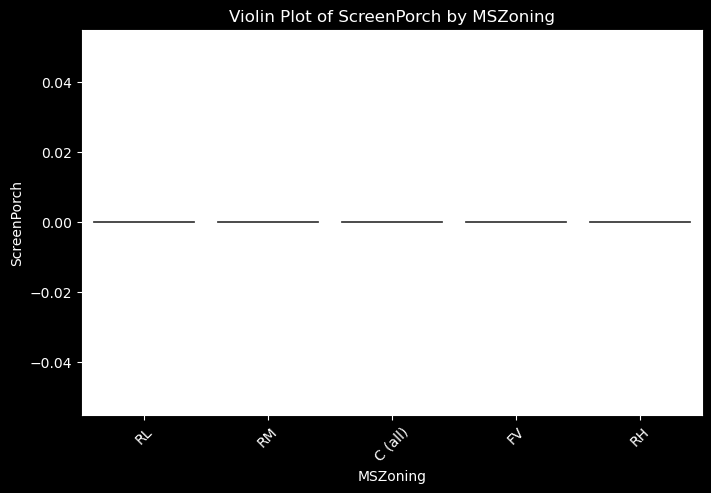

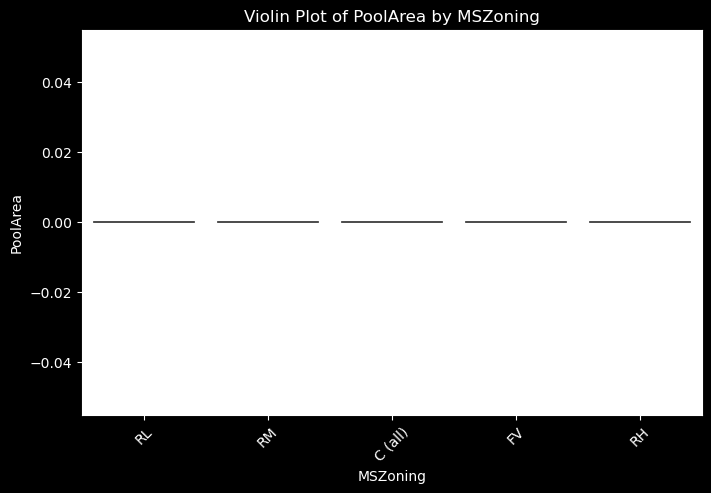

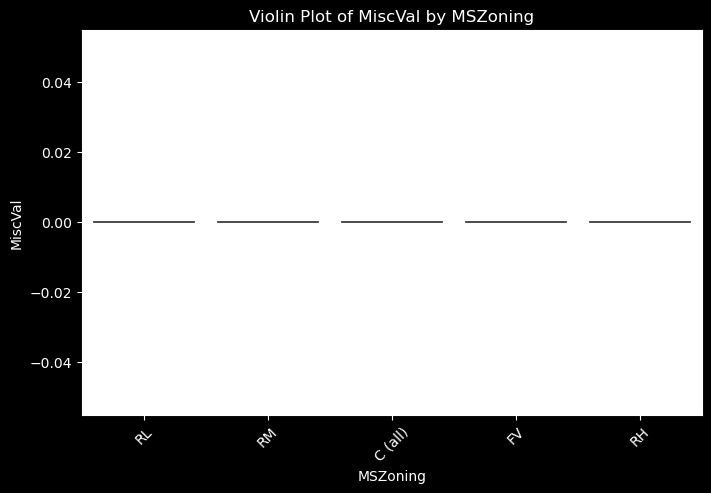

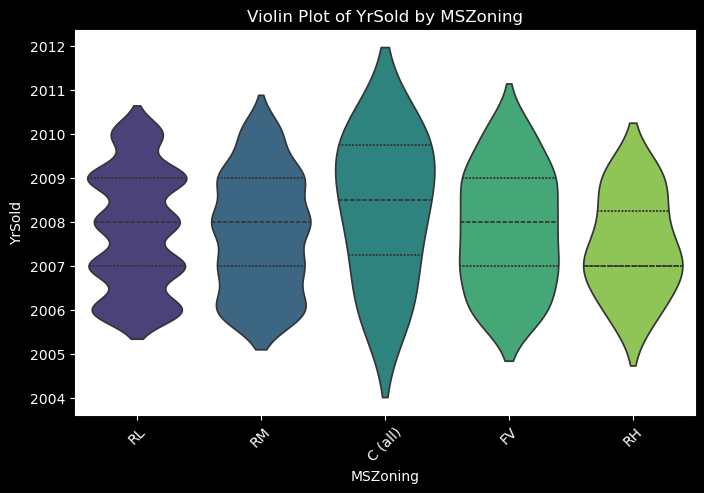

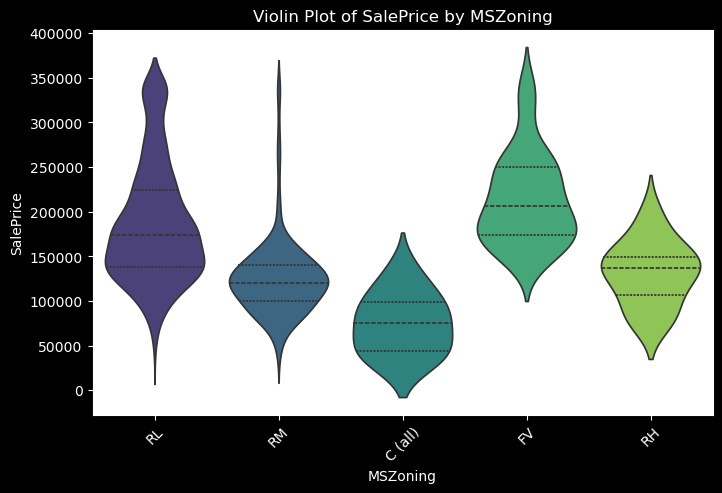

In [202]:
#Creating violin plots for each numerical column
for col in num_cols:
    plt.figure(figsize=(8, 5))
    sns.violinplot(x=df[cat_col], y=df[col], palette="viridis", inner="quartile")
    plt.title(f"Violin Plot of {col} by {cat_col}")
    plt.xticks(rotation=45)
    plt.gca().set_facecolor("white")  
    plt.show()


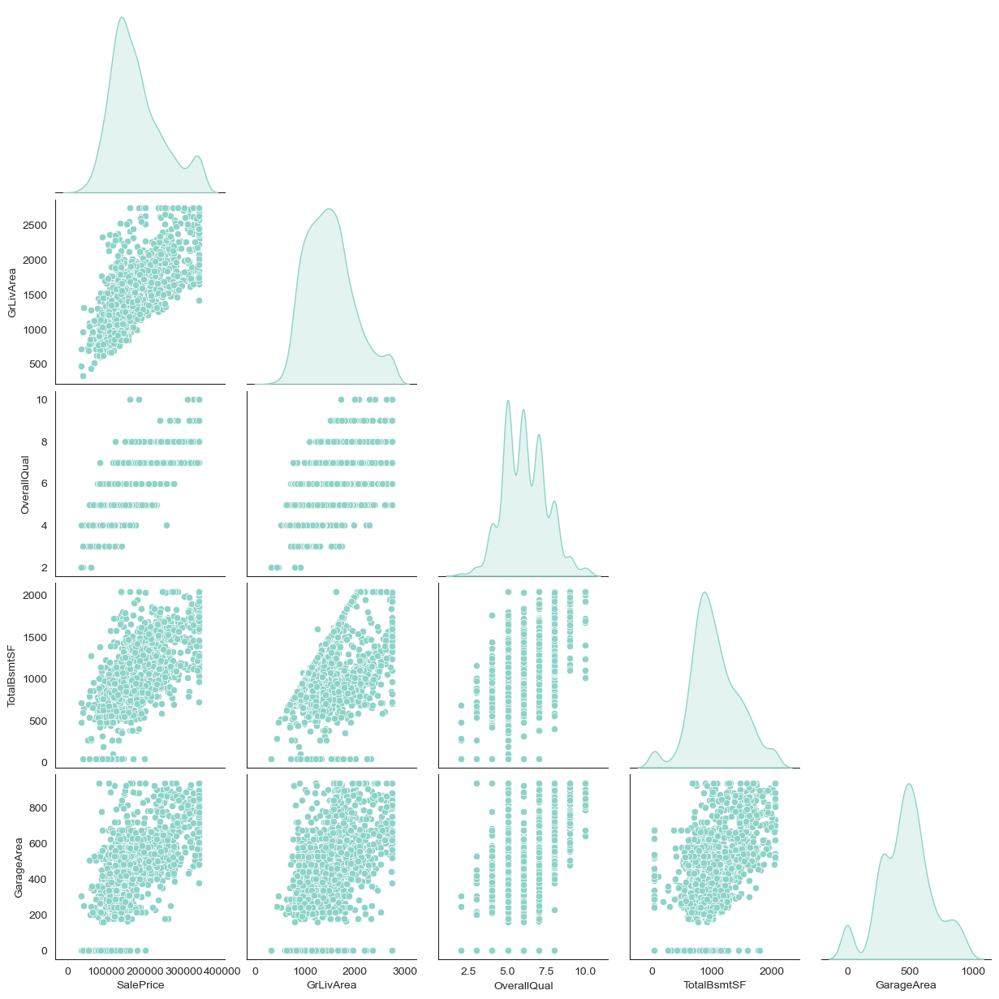

In [221]:
# Selecting important variables for pairplot
selected_features = ["SalePrice", "GrLivArea", "OverallQual", "TotalBsmtSF", "GarageArea"]
sns.set_style("white")
sns.pairplot(df[selected_features], diag_kind="kde", markers="o", corner=True)
plt.show()


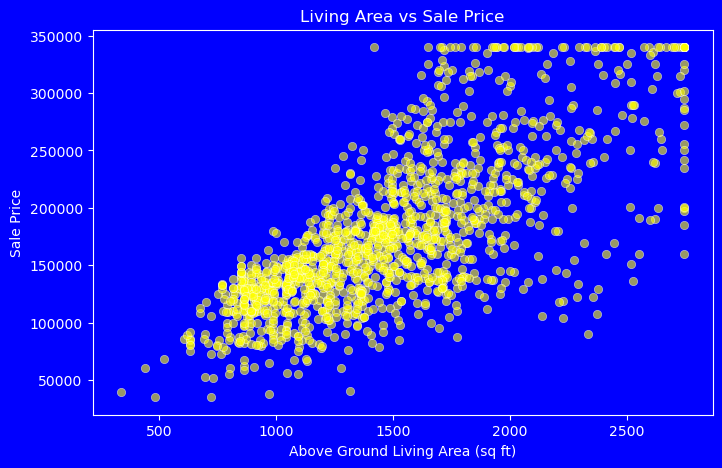

In [218]:
plt.figure(figsize=(8, 5), facecolor="blue")  # Set figure background color

ax = sns.scatterplot(x=df["GrLivArea"], y=df["SalePrice"], alpha=0.6, color="yellow")  

ax.set_facecolor("blue")  # Set blue background inside the plot
plt.title("Living Area vs Sale Price", color="white")
plt.xlabel("Above Ground Living Area (sq ft)", color="white")
plt.ylabel("Sale Price", color="white")

plt.show()



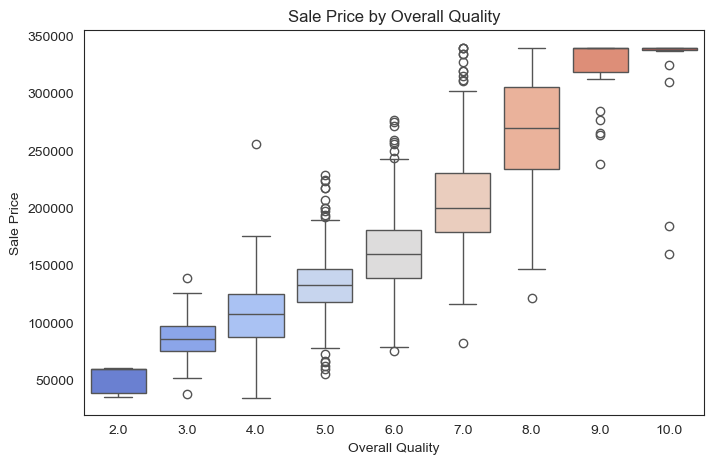

In [220]:
plt.figure(figsize=(8, 5))
sns.boxplot(x=df["OverallQual"], y=df["SalePrice"], palette="coolwarm")
plt.title("Sale Price by Overall Quality")
plt.xlabel("Overall Quality")
plt.ylabel("Sale Price")
sns.set_style("white")
plt.show()


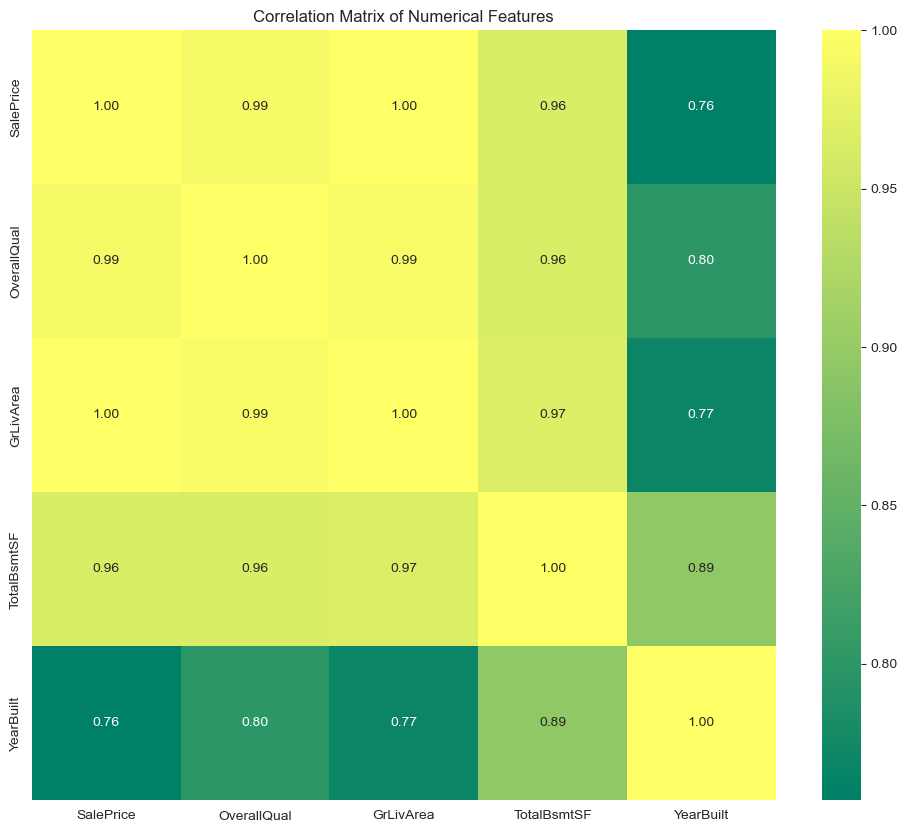

In [224]:
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='summer', fmt=".2f")  # fmt=".2f" for better readability
plt.title('Correlation Matrix of Numerical Features')
plt.show()

**Feature Engineering**

In [225]:
pip install pandas numpy scikit-learn


Note: you may need to restart the kernel to use updated packages.Requirement already satisfied: pandas in c:\users\dell\anaconda3\lib\site-packages (2.2.2)



In [286]:
!pip install textblob

**Import Laibraies and load the data**

In [290]:
import pandas as pd
import datetime
# Load the data
df = pd.read_csv('housing_data.csv')

# Preview the data
print(df.head())


   Unnamed: 0 MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0           0       SC60       RL           65     8450   Pave   NaN      Reg   
1           1       SC20       RL           80     9600   Pave   NaN      Reg   
2           2       SC60       RL           68    11250   Pave   NaN      IR1   
3           3       SC70       RL           60     9550   Pave   NaN      IR1   
4           4       SC60       RL           84    14260   Pave   NaN      IR1   

  LandContour Utilities LotConfig LandSlope Neighborhood Condition1  \
0         Lvl    AllPub    Inside       Gtl      CollgCr       Norm   
1         Lvl    AllPub       FR2       Gtl      Veenker      Feedr   
2         Lvl    AllPub    Inside       Gtl      CollgCr       Norm   
3         Lvl    AllPub    Corner       Gtl      Crawfor       Norm   
4         Lvl    AllPub       FR2       Gtl      NoRidge       Norm   

  Condition2 BldgType HouseStyle  OverallQual  OverallCond  YearBuilt  \
0       Norm 

In [291]:
# Check for similar column names
for col in df.columns:
    if 'sqft' in col.lower():
        print(col)

# Example: If the column is named 'SquareFootage'
df.rename(columns={'SquareFootage': 'sqft'}, inplace=True)
# Example: Manually adding the sqft column (replace with actual data)



**Engineer new features**

In [292]:
# Engineer new features
df['price_per_sqft'] = df['SalePrice'] / df['GrLivArea']
current_year = datetime.datetime.now().year
df['property_age'] = current_year - df['YearBuilt']
df['room_density'] = (df['BedroomAbvGr'] + df['FullBath']) / df['GrLivArea']

# Preview the data with new features
print(df[['SalePrice', 'GrLivArea', 'YearBuilt', 'BedroomAbvGr', 'FullBath', 'price_per_sqft', 'property_age', 'room_density']].head())


   SalePrice  GrLivArea  YearBuilt  BedroomAbvGr  FullBath  price_per_sqft  \
0     208500       1710       2003             3         2      121.929825   
1     181500       1262       1976             3         2      143.819334   
2     223500       1786       2001             3         2      125.139978   
3     140000       1717       1915             3         1       81.537566   
4     250000       2198       2000             4         2      113.739763   

   property_age  room_density  
0            22      0.002924  
1            49      0.003962  
2            24      0.002800  
3           110      0.002330  
4            25      0.002730  


In [293]:
import datetime

# Calculate the price per square foot
df['price_per_sqft'] = df['SalePrice'] / df['GrLivArea']

# Calculate property age
current_year = datetime.datetime.now().year
df['property_age'] = current_year - df['YearBuilt']

# Calculate room density
df['room_density'] = (df['BedroomAbvGr'] + df['FullBath']) / df['GrLivArea']

# Preview the data with new features
print(df[['SalePrice', 'GrLivArea', 'YearBuilt', 'BedroomAbvGr', 'FullBath', 'price_per_sqft', 'property_age', 'room_density']].head())



   SalePrice  GrLivArea  YearBuilt  BedroomAbvGr  FullBath  price_per_sqft  \
0     208500       1710       2003             3         2      121.929825   
1     181500       1262       1976             3         2      143.819334   
2     223500       1786       2001             3         2      125.139978   
3     140000       1717       1915             3         1       81.537566   
4     250000       2198       2000             4         2      113.739763   

   property_age  room_density  
0            22      0.002924  
1            49      0.003962  
2            24      0.002800  
3           110      0.002330  
4            25      0.002730  


In [295]:
# Check for missing values
print(df.isnull().sum())

# Handle missing values
df['price_per_sqft'].fillna(df['price_per_sqft'].median(), inplace=True)
df['property_age'].fillna(df['property_age'].median(), inplace=True)
df['room_density'].fillna(df['room_density'].median(), inplace=True)


Unnamed: 0        0
MSSubClass        0
MSZoning          0
LotFrontage       0
LotArea           0
                 ..
SaleCondition     0
SalePrice         0
price_per_sqft    0
property_age      0
room_density      0
Length: 84, dtype: int64


**feature size impact**

**feaqture scalling**

In [296]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df[['price_per_sqft', 'property_age', 'room_density']] = scaler.fit_transform(df[['price_per_sqft', 'property_age', 'room_density']])

# Preview the scaled features
print(df[['price_per_sqft', 'property_age', 'room_density']].head())


   price_per_sqft  property_age  room_density
0        0.043242     -1.050994     -0.204824
1        0.740797     -0.156734      1.225454
2        0.145540     -0.984752     -0.376273
3       -1.243942      1.863632     -1.023773
4       -0.217752     -0.951632     -0.472450


**Scatter Plot**

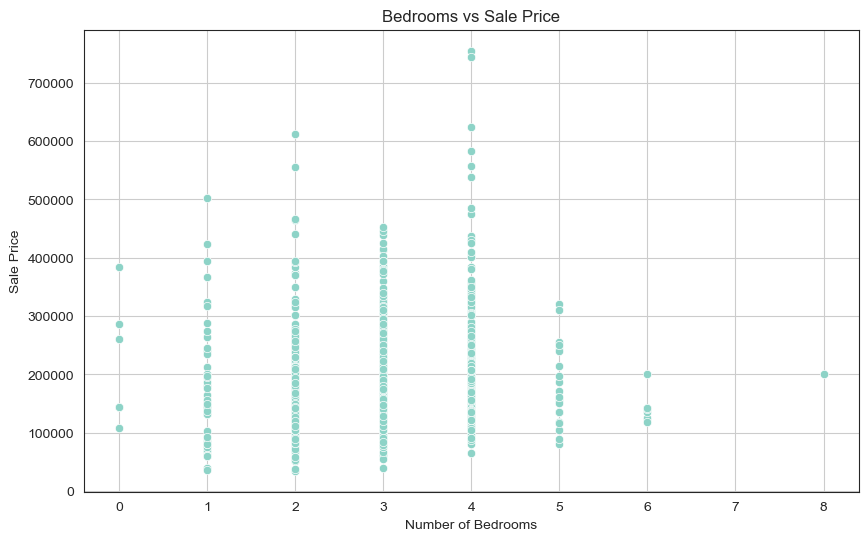

In [298]:
# Scatter Plot: Bedrooms vs Sale Price
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['BedroomAbvGr'], y=df['SalePrice'])
plt.title('Bedrooms vs Sale Price')
plt.xlabel('Number of Bedrooms')
plt.ylabel('Sale Price')
plt.grid(True)
plt.show()


**insight**

Houses with more bedrooms tend to have higher sale prices, but other factors like house size and location also significantly influence the price.

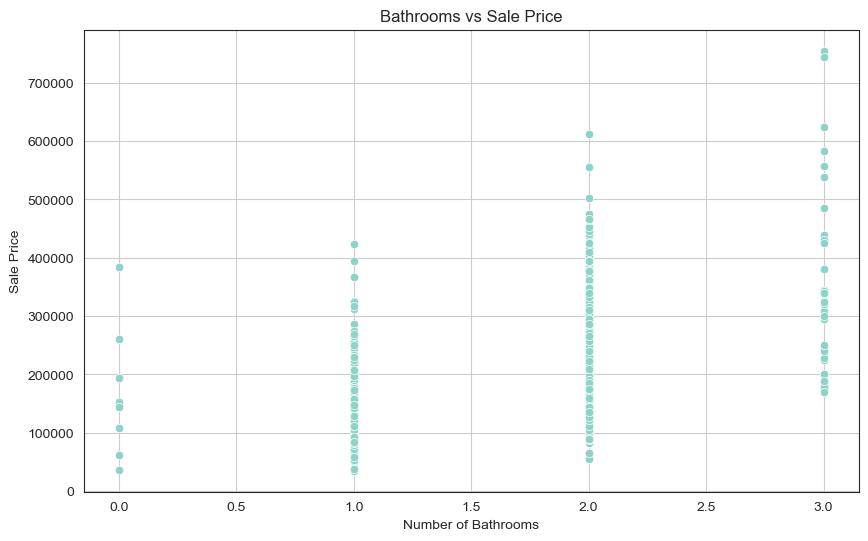

In [299]:
# Scatter Plot: Bathrooms vs Sale Price
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['FullBath'], y=df['SalePrice'])
plt.title('Bathrooms vs Sale Price')
plt.xlabel('Number of Bathrooms')
plt.ylabel('Sale Price')
plt.grid(True)
plt.show()


**Insight:**

Houses with more bathrooms tend to have higher sale prices, showing a positive correlation between the number of bathrooms and property valuation.

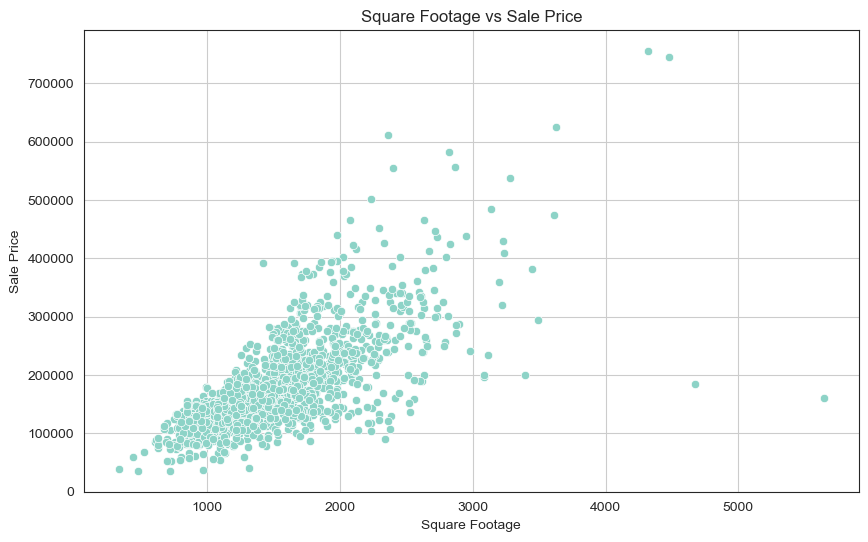

In [300]:
# Scatter Plot: Square Footage vs Sale Price
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['GrLivArea'], y=df['SalePrice'])
plt.title('Square Footage vs Sale Price')
plt.xlabel('Square Footage')
plt.ylabel('Sale Price')
plt.grid(True)
plt.show()


**insight:**


There is a strong positive correlation between square footage and sale price, indicating that larger homes generally have higher prices. However, some outliers suggest exceptionally large homes may not always follow this trend.

**Pair plot**

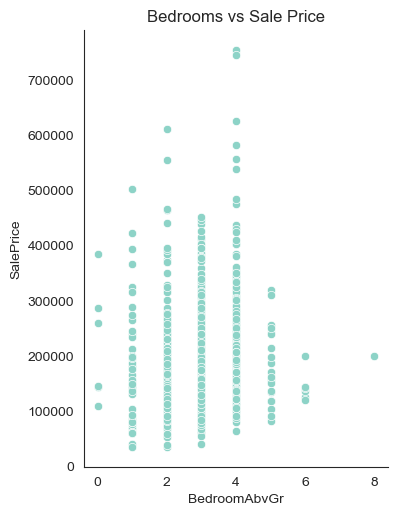

In [301]:

# Pair Plot: Bedrooms vs Sale Price
sns.pairplot(df, x_vars=['BedroomAbvGr'], y_vars='SalePrice', height=5, aspect=0.8)
plt.title('Bedrooms vs Sale Price')
plt.show()


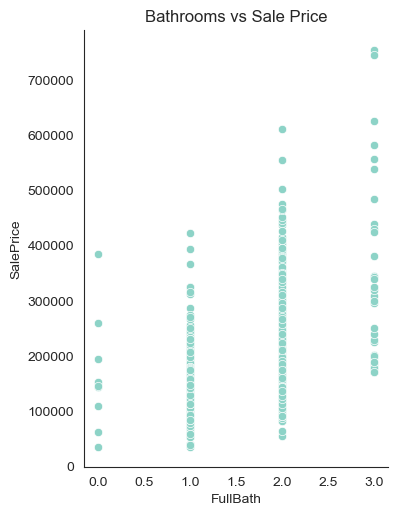

In [302]:
# Pair Plot: Bathrooms vs Sale Price
sns.pairplot(df, x_vars=['FullBath'], y_vars='SalePrice', height=5, aspect=0.8)
plt.title('Bathrooms vs Sale Price')
plt.show()


**Pairplot**

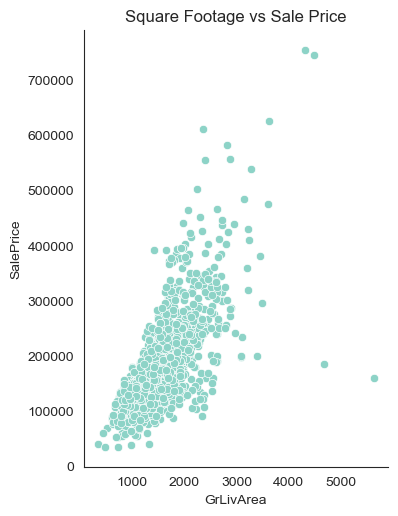

In [339]:
# Pair Plot: Square Footage vs Sale Price
sns.pairplot(df, x_vars=['GrLivArea'], y_vars='SalePrice', height=5, aspect=0.8)
plt.title('Square Footage vs Sale Price')
plt.show()


**Pei chart**

BedroomAbvGr
2-3    55.068493
1-2    24.520548
3-4    14.589041
0-1     3.424658
4-5     1.438356
5-6     0.479452
7-8     0.068493
6-7     0.000000
Name: count, dtype: float64


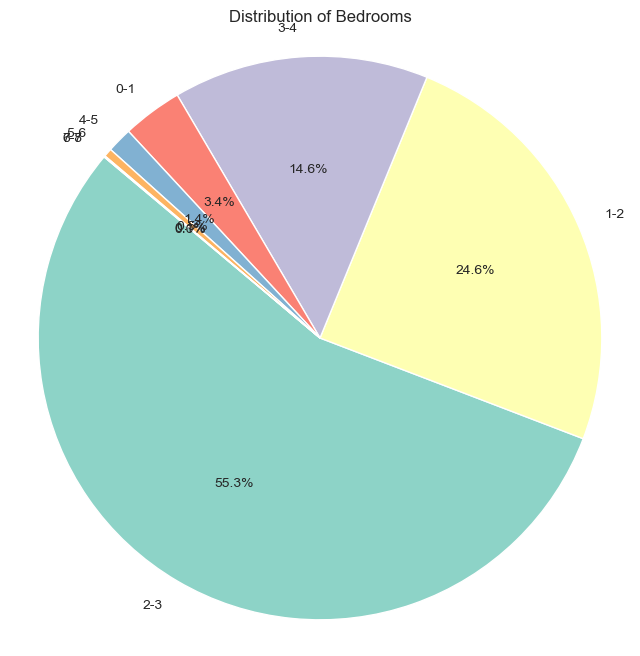

In [320]:
import matplotlib.pyplot as plt

# Bin the number of bedrooms
bedroom_bins = pd.cut(df['BedroomAbvGr'], bins=[0, 1, 2, 3, 4, 5, 6, 7, 8], labels=['0-1', '1-2', '2-3', '3-4', '4-5', '5-6', '6-7', '7-8'])
# Calculate percentage
bedroom_percent = (bedroom_counts / len(df)) * 100
# Calculate percentage
bedroom_percent = (bedroom_counts / len(df)) * 100

# Preview the percentage
print(bedroom_percent)
# Count the number of houses in each bin
bedroom_counts = bedroom_bins.value_counts()

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(bedroom_counts, labels=bedroom_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Bedrooms')
plt.axis('equal')
plt.show()


FullBath
1-2    52.602740
0-1    44.520548
2-3     2.260274
3-4     0.000000
Name: count, dtype: float64


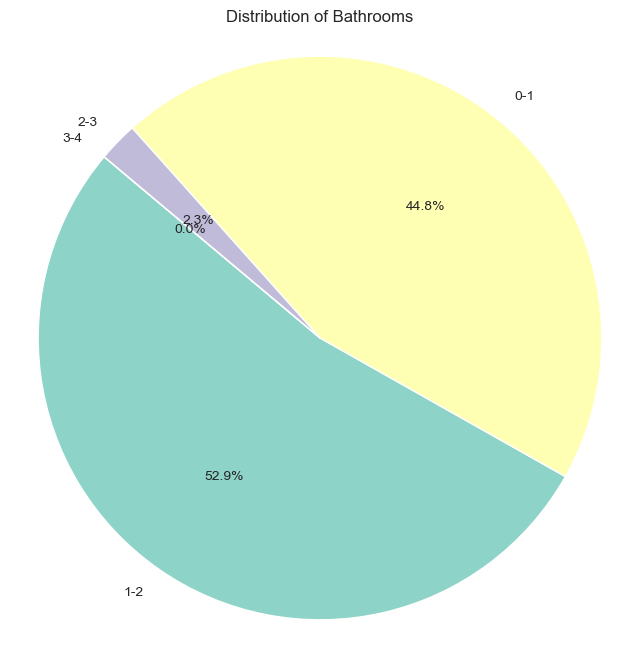

In [321]:
# Bin the number of bathrooms
bathroom_bins = pd.cut(df['FullBath'], bins=[0, 1, 2, 3, 4], labels=['0-1', '1-2', '2-3', '3-4'])

# Count the number of houses in each bin
bathroom_counts = bathroom_bins.value_counts()

# Calculate percentage
bathroom_percent = (bathroom_counts / len(df)) * 100

# Preview the percentage
print(bathroom_percent)

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(bathroom_counts, labels=bathroom_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Bathrooms')
plt.axis('equal')
plt.show()


GrLivArea
1000-1500    37.945205
1500-2000    31.575342
500-1000     15.616438
2000-2500     9.863014
2500-3000     3.561644
3000-3500     0.821918
0-500         0.205479
3500-4000     0.136986
Name: count, dtype: float64


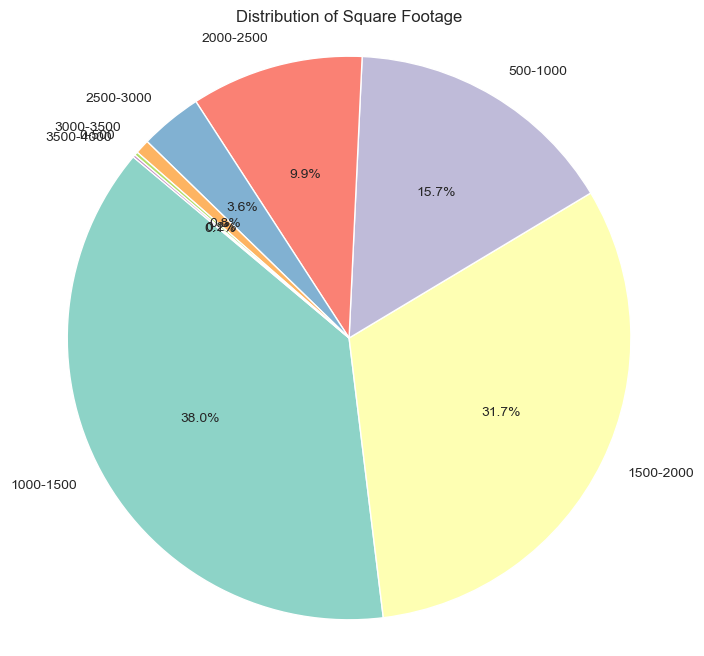

In [322]:
# Bin the square footage
square_footage_bins = pd.cut(df['GrLivArea'], bins=[0, 500, 1000, 1500, 2000, 2500, 3000, 3500, 4000], labels=['0-500', '500-1000', '1000-1500', '1500-2000', '2000-2500', '2500-3000', '3000-3500', '3500-4000'])

# Count the number of houses in each bin
square_footage_counts = square_footage_bins.value_counts()
# Calculate percentage
square_footage_percent = (square_footage_counts / len(df)) * 100

# Preview the percentage
print(square_footage_percent)

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(square_footage_counts, labels=square_footage_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Square Footage')
plt.axis('equal')
plt.show()


**Bar plot**

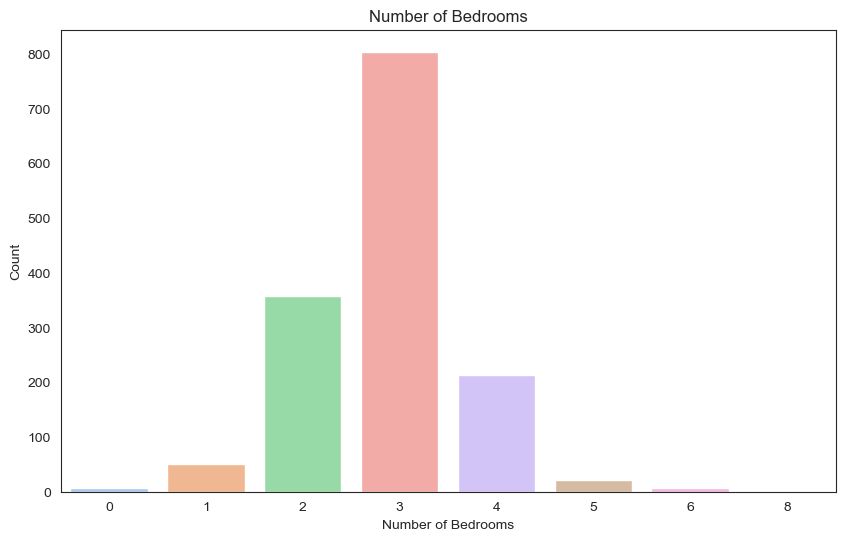

In [324]:
# Count the number of houses in each bin for bedrooms
bedroom_counts = df['BedroomAbvGr'].value_counts().sort_index()

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=bedroom_counts.index, y=bedroom_counts.values, palette='pastel')
plt.title('Number of Bedrooms')
plt.xlabel('Number of Bedrooms')
plt.ylabel('Count')
plt.show()


**Insight:**

  The majority of houses have 3 bedrooms, followed by 2 and 4-bedroom homes, indicating that mid-sized homes are the most common in the dataset. Homes with more than 5 bedrooms are rare

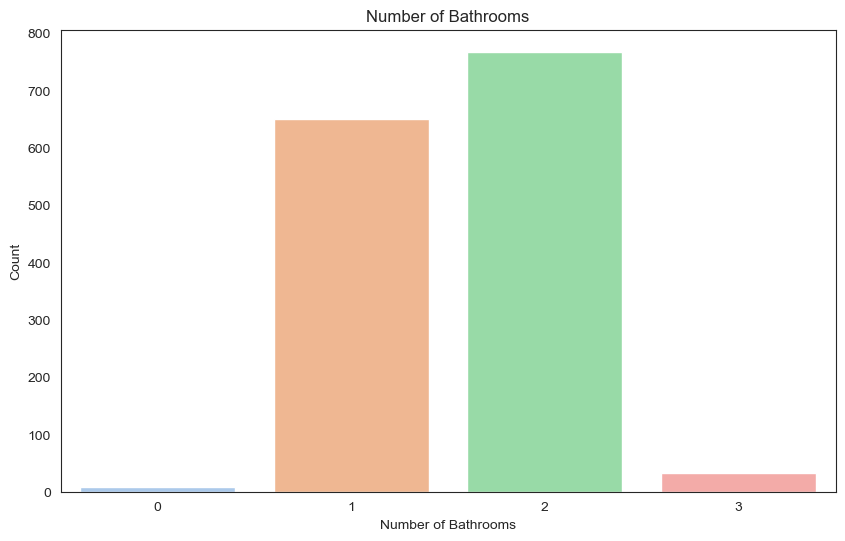

In [325]:
# Count the number of houses in each bin for bathrooms
bathroom_counts = df['FullBath'].value_counts().sort_index()

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=bathroom_counts.index, y=bathroom_counts.values, palette='pastel')
plt.title('Number of Bathrooms')
plt.xlabel('Number of Bathrooms')
plt.ylabel('Count')
plt.show()


**Insight:**

  Most houses have either 1 or 2 bathrooms, with 2-bathroom homes being the most common. Homes with 3 or more bathrooms are relatively rare.

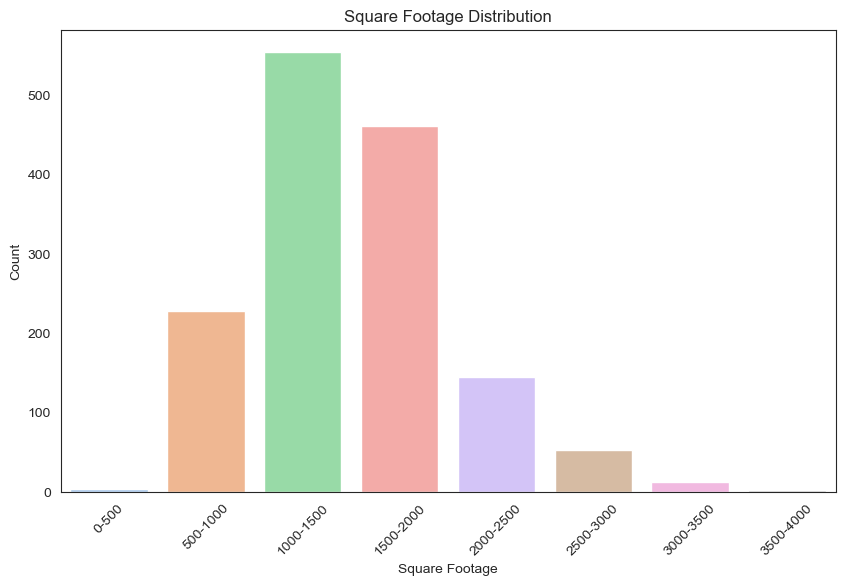

In [326]:
# Bin the square footage
square_footage_bins = pd.cut(df['GrLivArea'], bins=[0, 500, 1000, 1500, 2000, 2500, 3000, 3500, 4000], labels=['0-500', '500-1000', '1000-1500', '1500-2000', '2000-2500', '2500-3000', '3000-3500', '3500-4000'])

# Count the number of houses in each bin
square_footage_counts = square_footage_bins.value_counts().sort_index()

# Create a bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=square_footage_counts.index, y=square_footage_counts.values, palette='pastel')
plt.title('Square Footage Distribution')
plt.xlabel('Square Footage')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


**insight:**

  The majority of homes fall within the 1000-2000 square feet range, with very few properties exceeding 3000 square feet. This suggests that mid-sized homes are the most common in this market.

**Viline plot**

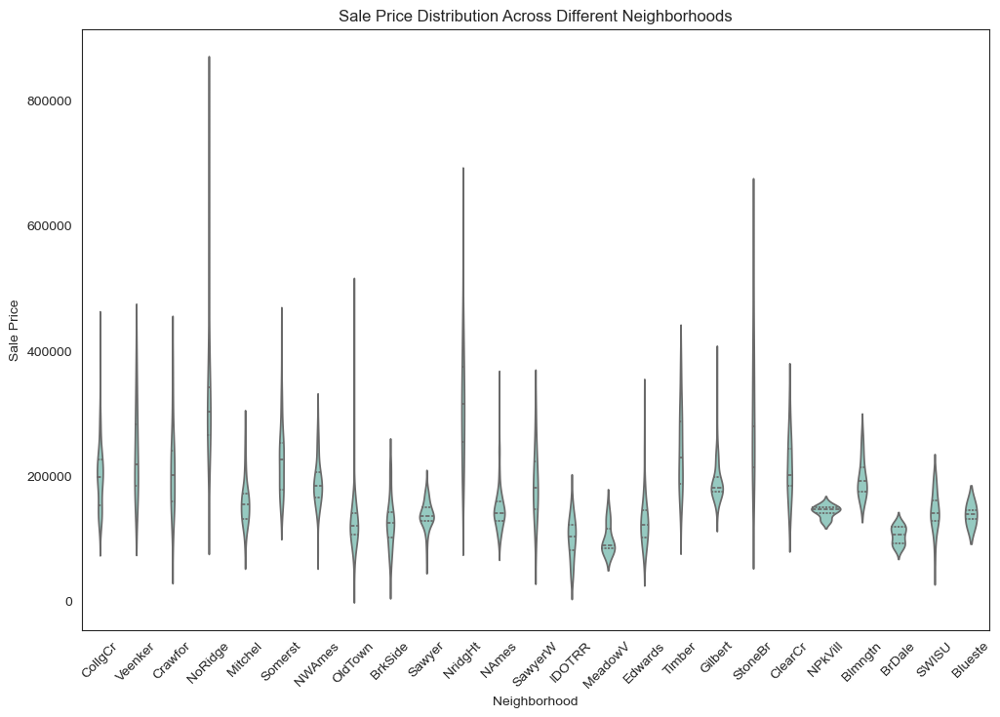

In [331]:

# Violin plot for Sale Price across different Neighborhoods
plt.figure(figsize=(12, 8))
sns.violinplot(x='Neighborhood', y='SalePrice', data=df, inner='quartile')
plt.title('Sale Price Distribution Across Different Neighborhoods')
plt.xlabel('Neighborhood')
plt.ylabel('Sale Price')
plt.xticks(rotation=45)
plt.show()


**Villion plot**

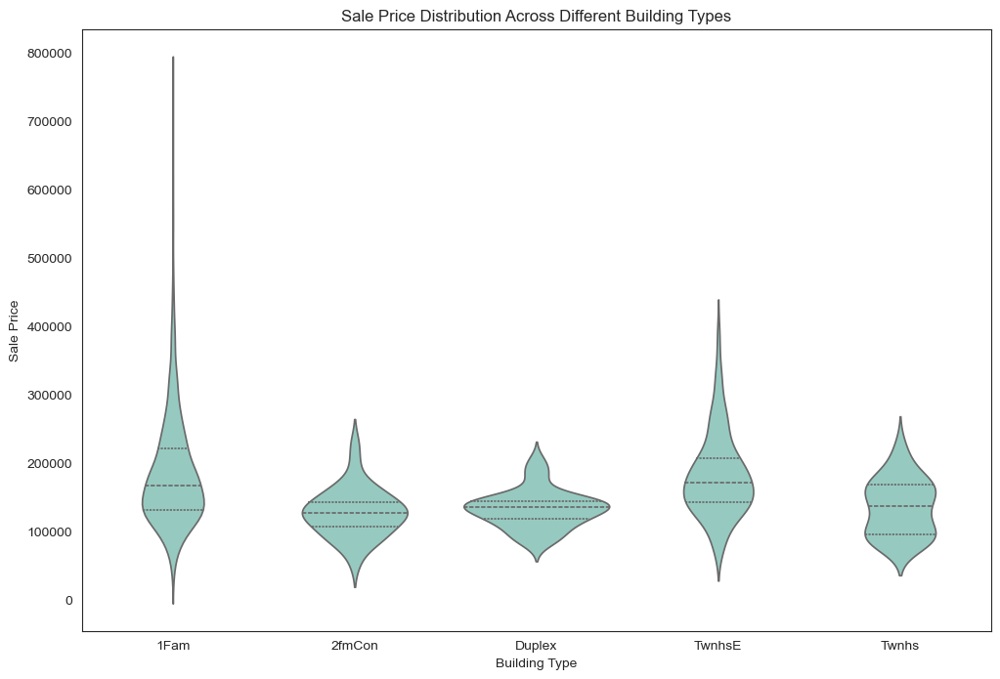

In [332]:
# Violin plot for Sale Price across different Building Types
plt.figure(figsize=(12, 8))
sns.violinplot(x='BldgType', y='SalePrice', data=df, inner='quartile')
plt.title('Sale Price Distribution Across Different Building Types')
plt.xlabel('Building Type')
plt.ylabel('Sale Price')
plt.show()


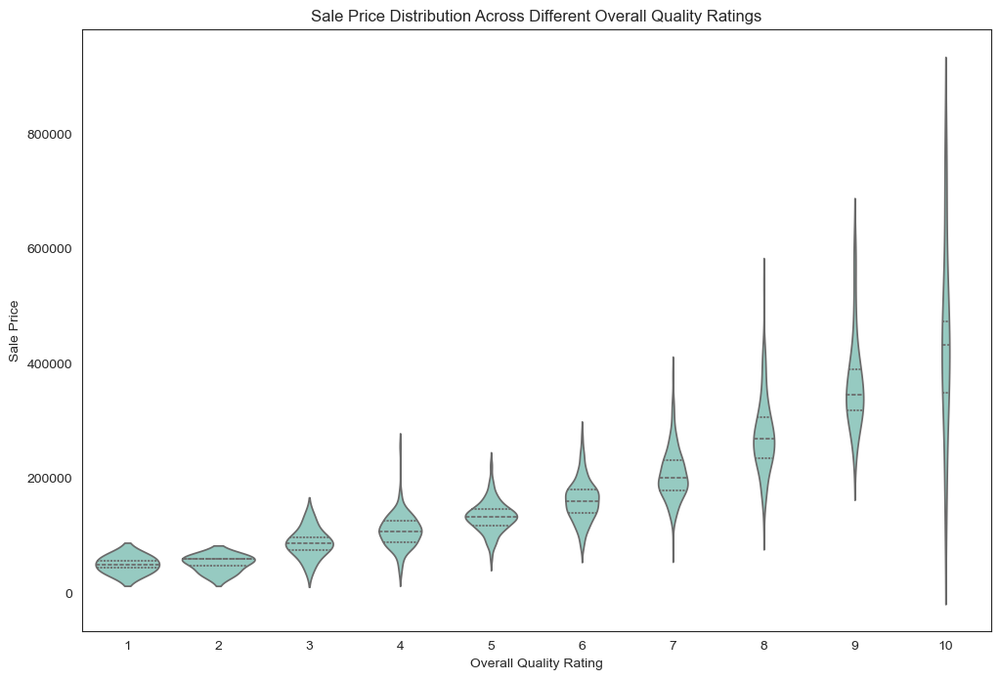

In [333]:
# Violin plot for Sale Price across different Overall Quality Ratings
plt.figure(figsize=(12, 8))
sns.violinplot(x='OverallQual', y='SalePrice', data=df, inner='quartile')
plt.title('Sale Price Distribution Across Different Overall Quality Ratings')
plt.xlabel('Overall Quality Rating')
plt.ylabel('Sale Price')
plt.show()


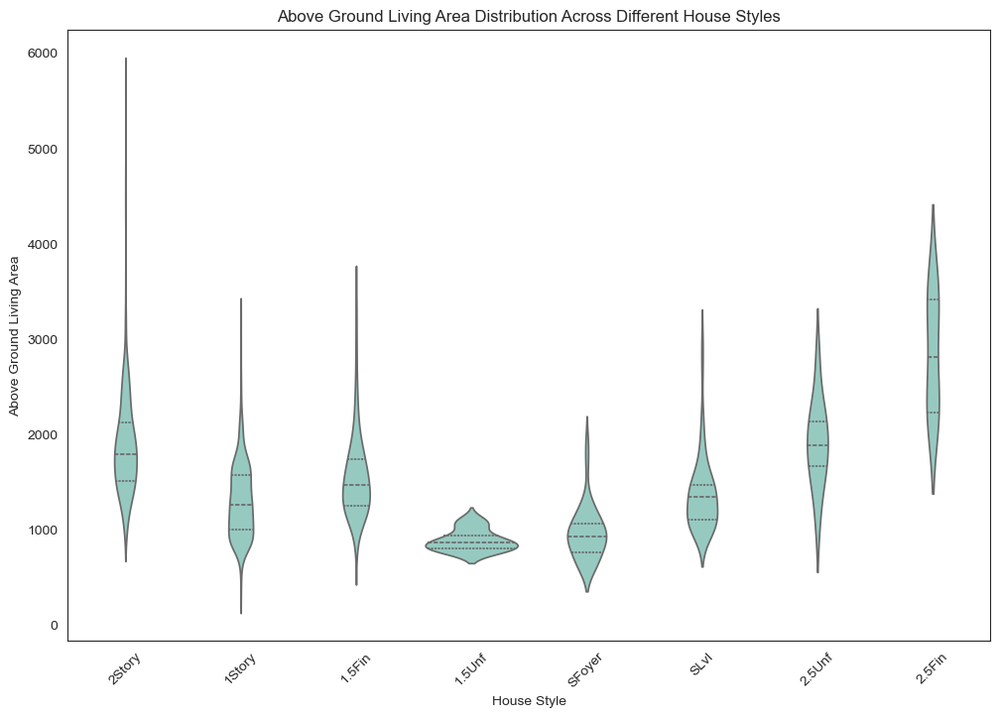

In [334]:
# Violin plot for GrLivArea across different House Styles
plt.figure(figsize=(12, 8))
sns.violinplot(x='HouseStyle', y='GrLivArea', data=df, inner='quartile')
plt.title('Above Ground Living Area Distribution Across Different House Styles')
plt.xlabel('House Style')
plt.ylabel('Above Ground Living Area')
plt.xticks(rotation=45)
plt.show()


**Heatmap**

In [335]:
# Select relevant numerical features
features = ['SalePrice', 'GrLivArea', 'BedroomAbvGr', 'FullBath', 'YearBuilt', 'OverallQual', 'GarageCars', 'GarageArea']

# Calculate the correlation matrix
correlation_matrix = df[features].corr()

# Preview the correlation matrix
print(correlation_matrix)


              SalePrice  GrLivArea  BedroomAbvGr  FullBath  YearBuilt  \
SalePrice      1.000000   0.708624      0.168213  0.560664   0.522897   
GrLivArea      0.708624   1.000000      0.521270  0.630012   0.199010   
BedroomAbvGr   0.168213   0.521270      1.000000  0.363252  -0.070651   
FullBath       0.560664   0.630012      0.363252  1.000000   0.468271   
YearBuilt      0.522897   0.199010     -0.070651  0.468271   1.000000   
OverallQual    0.790982   0.593007      0.101676  0.550600   0.572323   
GarageCars     0.640409   0.467247      0.086106  0.469672   0.537850   
GarageArea     0.623431   0.468997      0.065253  0.405656   0.478954   

              OverallQual  GarageCars  GarageArea  
SalePrice        0.790982    0.640409    0.623431  
GrLivArea        0.593007    0.467247    0.468997  
BedroomAbvGr     0.101676    0.086106    0.065253  
FullBath         0.550600    0.469672    0.405656  
YearBuilt        0.572323    0.537850    0.478954  
OverallQual      1.000000    0

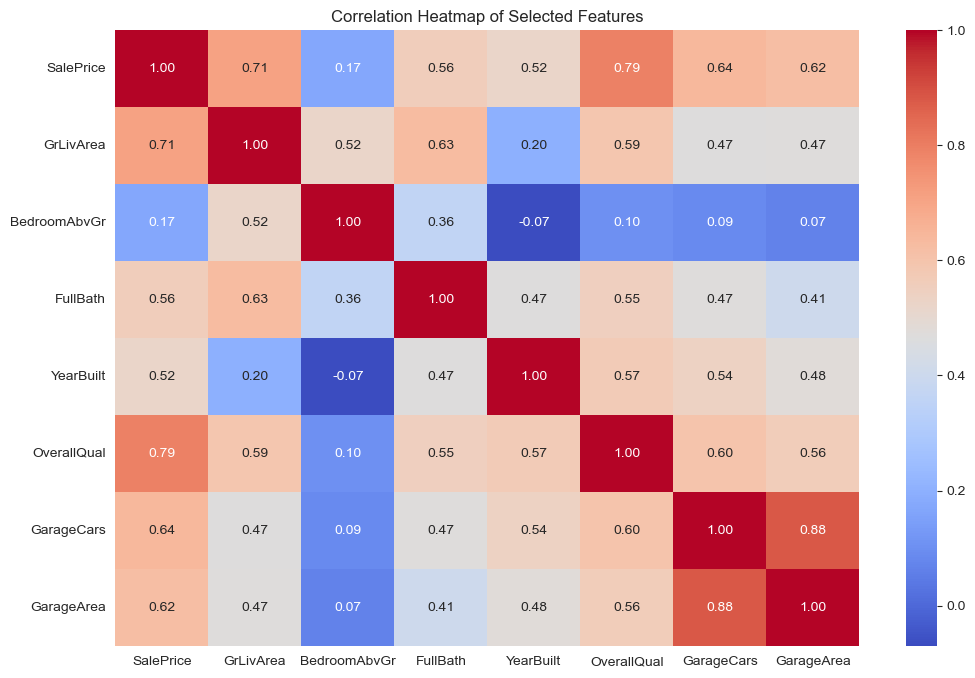

In [336]:
# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap of Selected Features')
plt.show()


**Box plot**

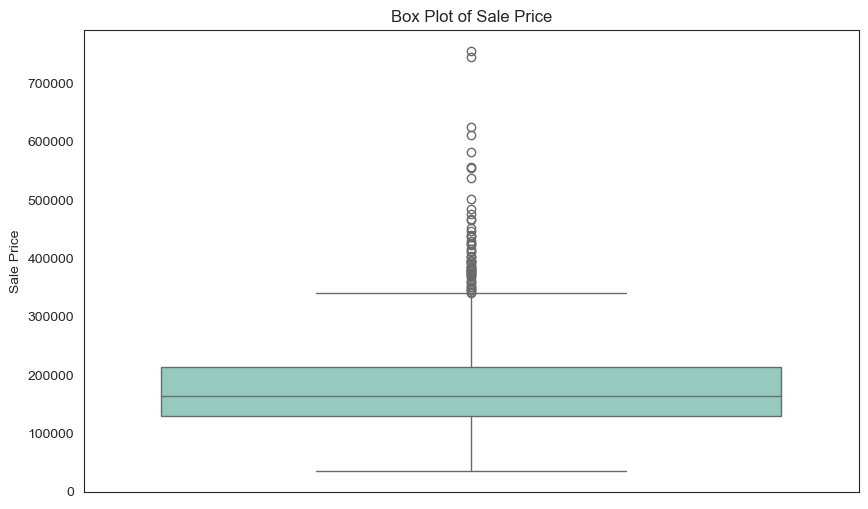

In [344]:
# Box plot for SalePrice
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['SalePrice'])
plt.title('Box Plot of Sale Price')
plt.ylabel('Sale Price')
plt.show()


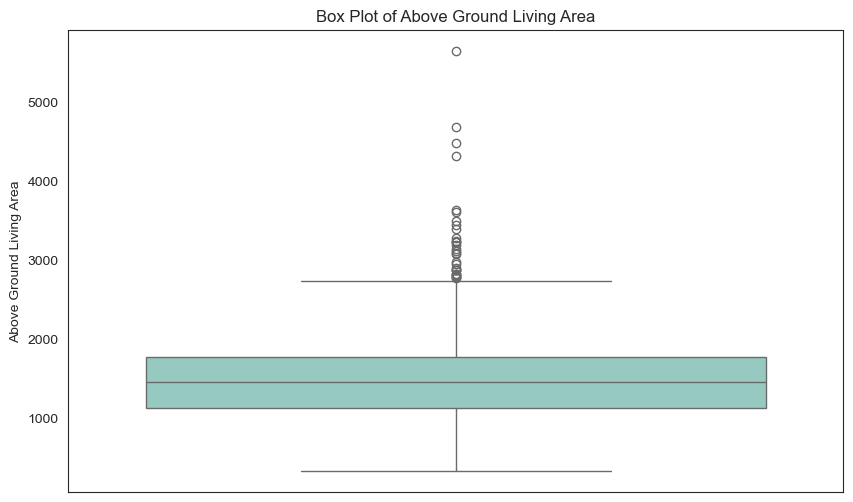

In [345]:
# Box plot for GrLivArea
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['GrLivArea'])
plt.title('Box Plot of Above Ground Living Area')
plt.ylabel('Above Ground Living Area')
plt.show()


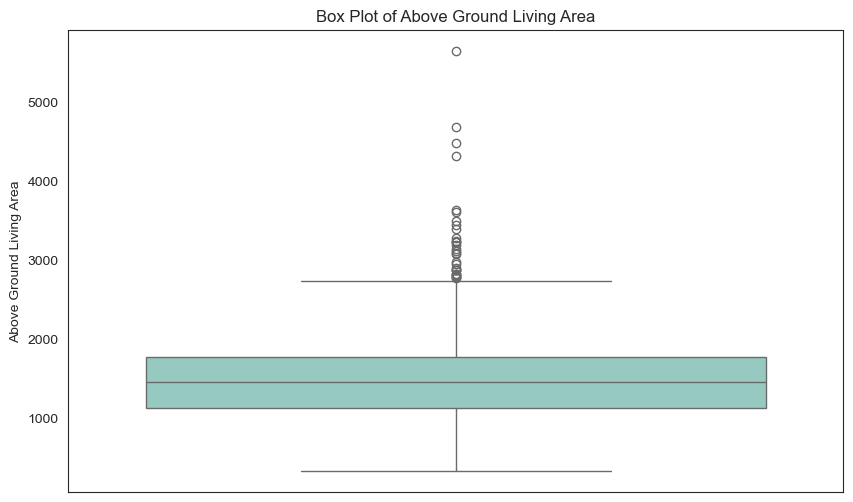

In [346]:
# Box plot for GrLivArea
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['GrLivArea'])
plt.title('Box Plot of Above Ground Living Area')
plt.ylabel('Above Ground Living Area')
plt.show()


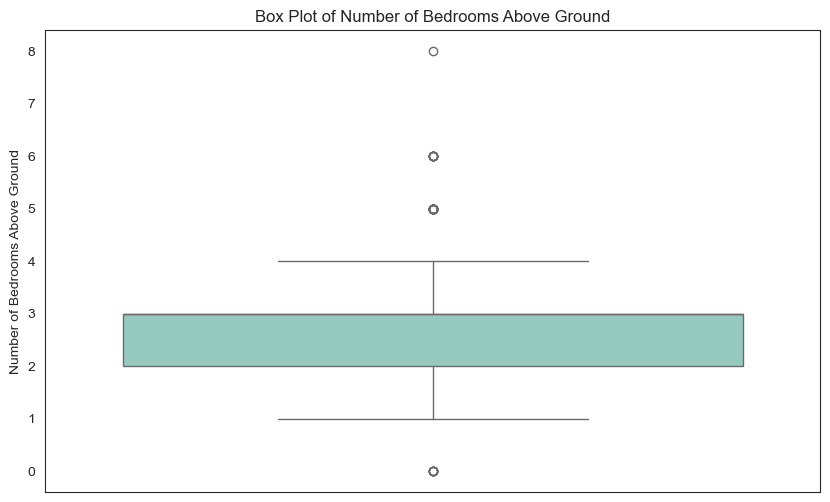

In [347]:
# Box plot for BedroomAbvGr
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['BedroomAbvGr'])
plt.title('Box Plot of Number of Bedrooms Above Ground')
plt.ylabel('Number of Bedrooms Above Ground')
plt.show()


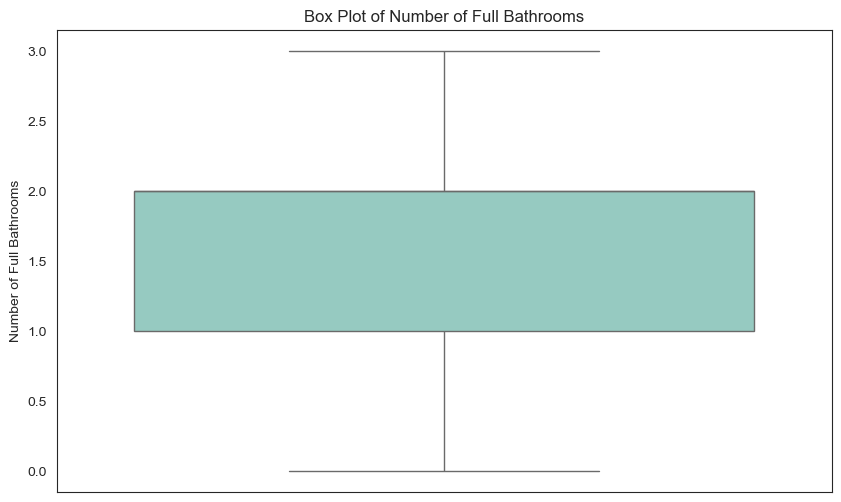

In [348]:
# Box plot for FullBath
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['FullBath'])
plt.title('Box Plot of Number of Full Bathrooms')
plt.ylabel('Number of Full Bathrooms')
plt.show()


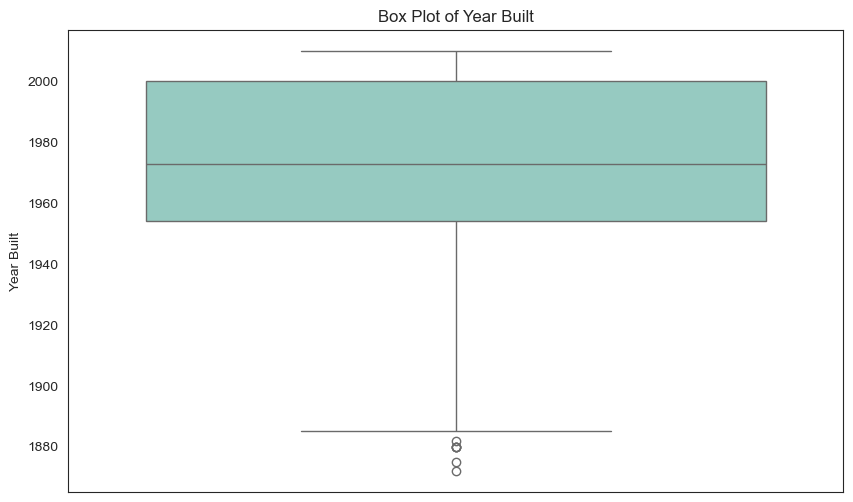

In [349]:
# Box plot for YearBuilt
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['YearBuilt'])
plt.title('Box Plot of Year Built')
plt.ylabel('Year Built')
plt.show()


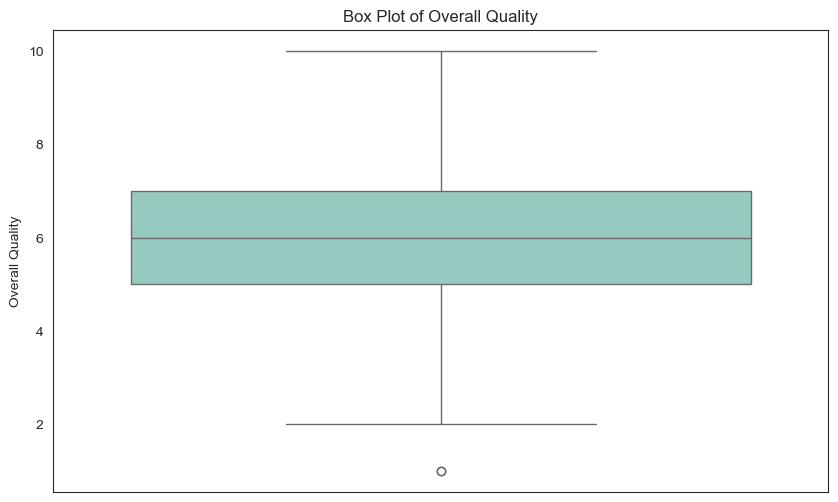

In [350]:
# Box plot for OverallQual
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['OverallQual'])
plt.title('Box Plot of Overall Quality')
plt.ylabel('Overall Quality')
plt.show()


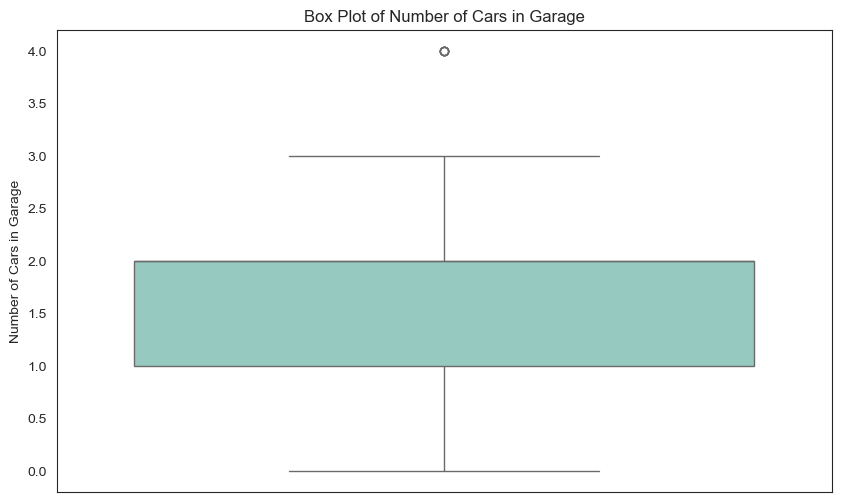

In [351]:
# Box plot for GarageCars
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['GarageCars'])
plt.title('Box Plot of Number of Cars in Garage')
plt.ylabel('Number of Cars in Garage')
plt.show()


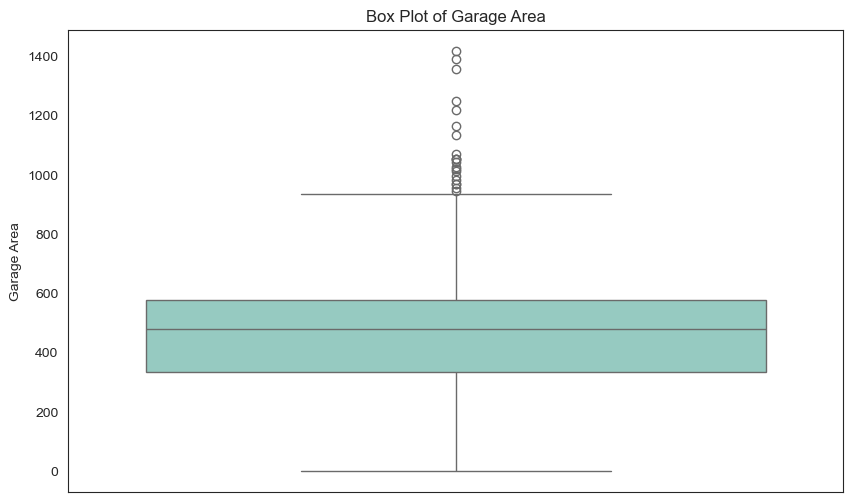

In [352]:
# Box plot for GarageArea
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['GarageArea'])
plt.title('Box Plot of Garage Area')
plt.ylabel('Garage Area')
plt.show()


**Outlier handleing**

In [353]:
#useing IQR Method
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Remove outliers for multiple columns
columns = ['SalePrice', 'GrLivArea', 'BedroomAbvGr', 'FullBath', 'YearBuilt', 'OverallQual', 'GarageCars', 'GarageArea']
df_no_outliers = df.copy()
for column in columns:
    df_no_outliers = remove_outliers(df_no_outliers, column)

# Preview the data without outliers
print(df_no_outliers.head())


   Unnamed: 0 MSSubClass MSZoning  LotFrontage  LotArea Street Alley LotShape  \
0           0       SC60       RL           65     8450   Pave   NaN      Reg   
1           1       SC20       RL           80     9600   Pave   NaN      Reg   
2           2       SC60       RL           68    11250   Pave   NaN      IR1   
3           3       SC70       RL           60     9550   Pave   NaN      IR1   
4           4       SC60       RL           84    14260   Pave   NaN      IR1   

  LandContour Utilities LotConfig LandSlope Neighborhood Condition1  \
0         Lvl    AllPub    Inside       Gtl      CollgCr       Norm   
1         Lvl    AllPub       FR2       Gtl      Veenker      Feedr   
2         Lvl    AllPub    Inside       Gtl      CollgCr       Norm   
3         Lvl    AllPub    Corner       Gtl      Crawfor       Norm   
4         Lvl    AllPub       FR2       Gtl      NoRidge       Norm   

  Condition2 BldgType HouseStyle  OverallQual  OverallCond  YearBuilt  \
0       Norm 

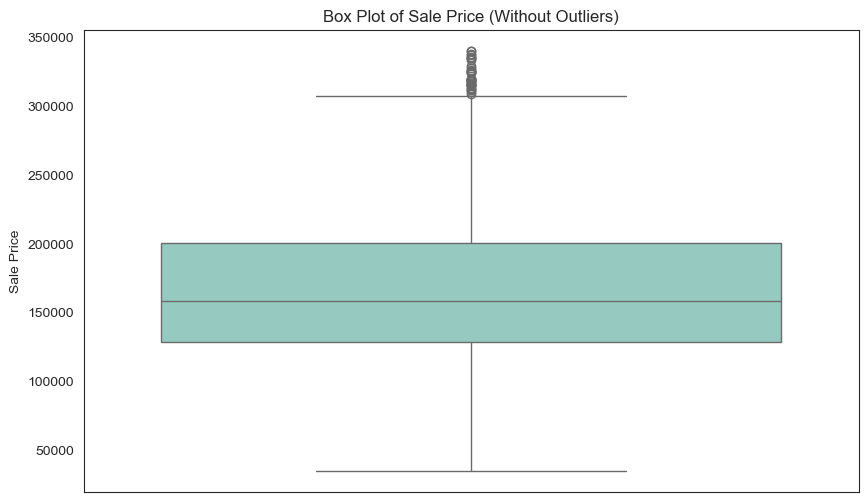

In [354]:
#After removeing outlier

# Box plot for SalePrice
plt.figure(figsize=(10, 6))
sns.boxplot(y=df_no_outliers['SalePrice'])
plt.title('Box Plot of Sale Price (Without Outliers)')
plt.ylabel('Sale Price')
plt.show()


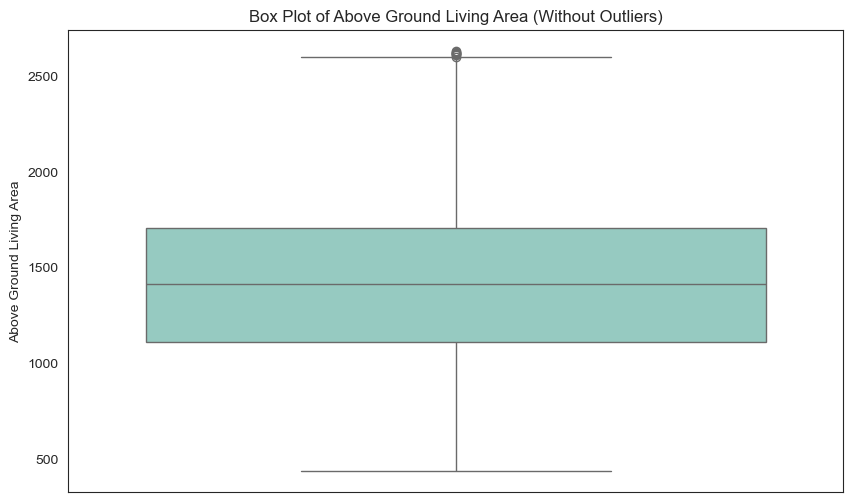

In [355]:
# Box plot for GrLivArea
plt.figure(figsize=(10, 6))
sns.boxplot(y=df_no_outliers['GrLivArea'])
plt.title('Box Plot of Above Ground Living Area (Without Outliers)')
plt.ylabel('Above Ground Living Area')
plt.show()


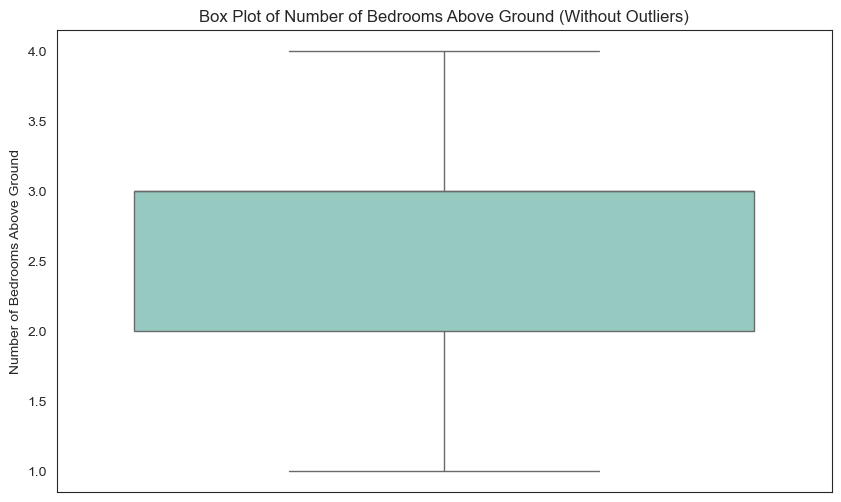

In [356]:
# Box plot for BedroomAbvGr
plt.figure(figsize=(10, 6))
sns.boxplot(y=df_no_outliers['BedroomAbvGr'])
plt.title('Box Plot of Number of Bedrooms Above Ground (Without Outliers)')
plt.ylabel('Number of Bedrooms Above Ground')
plt.show()


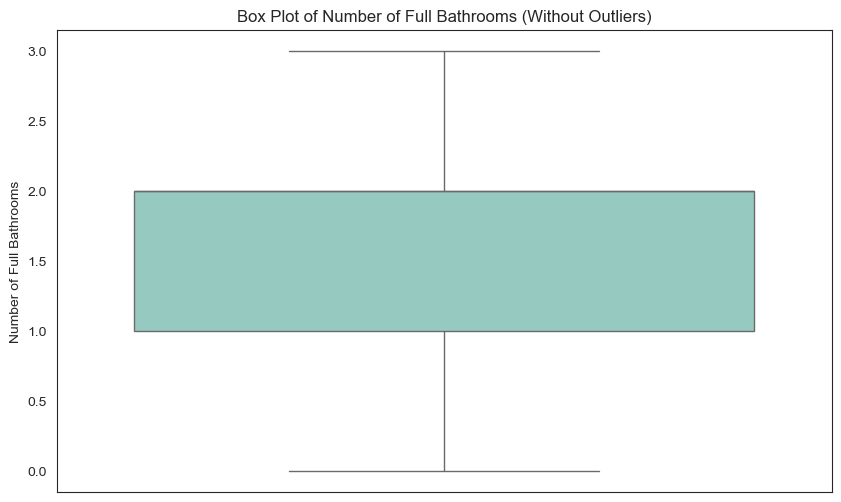

In [357]:
# Box plot for FullBath
plt.figure(figsize=(10, 6))
sns.boxplot(y=df_no_outliers['FullBath'])
plt.title('Box Plot of Number of Full Bathrooms (Without Outliers)')
plt.ylabel('Number of Full Bathrooms')
plt.show()


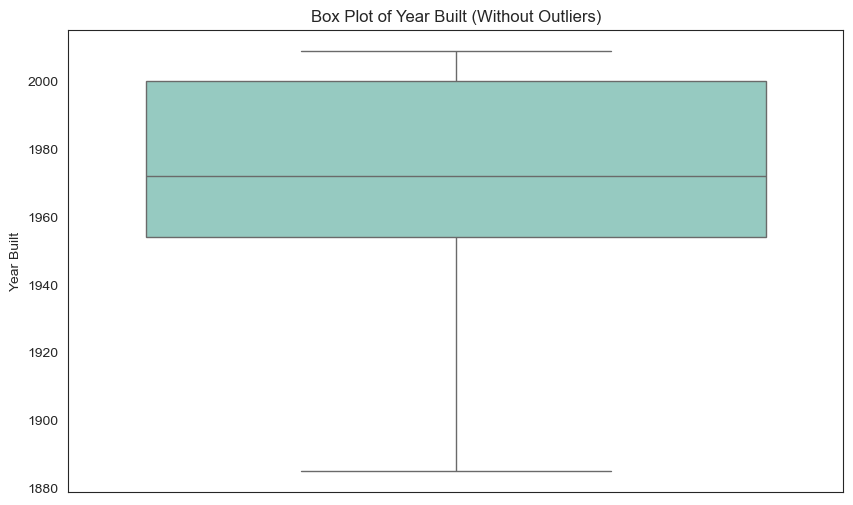

In [358]:
# Box plot for YearBuilt
plt.figure(figsize=(10, 6))
sns.boxplot(y=df_no_outliers['YearBuilt'])
plt.title('Box Plot of Year Built (Without Outliers)')
plt.ylabel('Year Built')
plt.show()


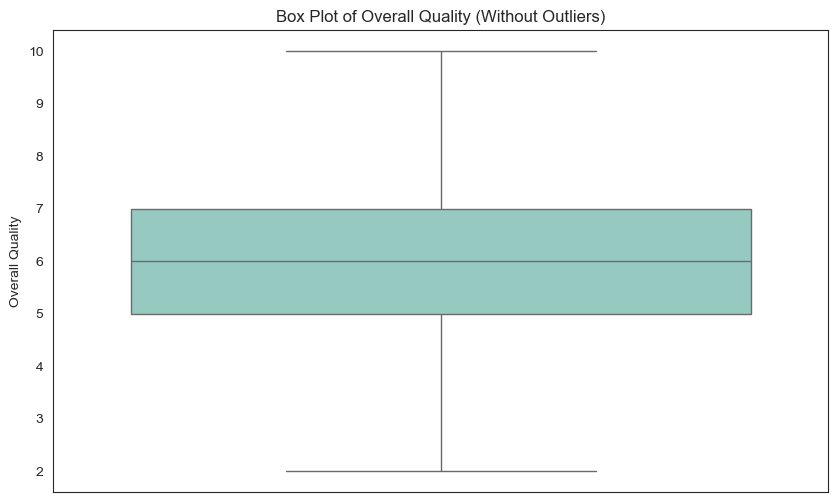

In [359]:
# Box plot for OverallQual
plt.figure(figsize=(10, 6))
sns.boxplot(y=df_no_outliers['OverallQual'])
plt.title('Box Plot of Overall Quality (Without Outliers)')
plt.ylabel('Overall Quality')
plt.show()


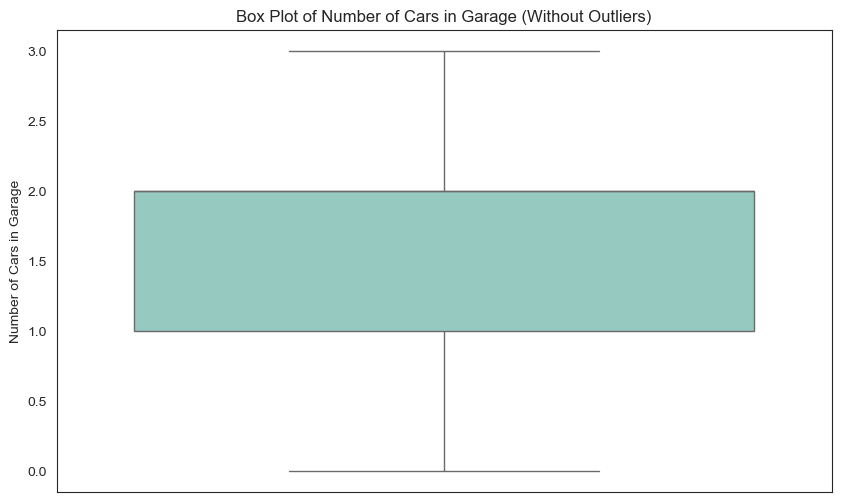

In [360]:
# Box plot for GarageCars
plt.figure(figsize=(10, 6))
sns.boxplot(y=df_no_outliers['GarageCars'])
plt.title('Box Plot of Number of Cars in Garage (Without Outliers)')
plt.ylabel('Number of Cars in Garage')
plt.show()


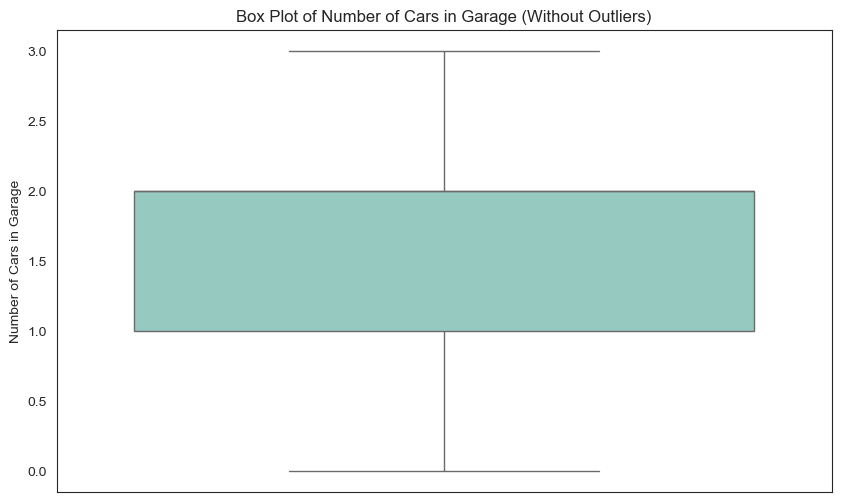

In [361]:
# Box plot for GarageCars
plt.figure(figsize=(10, 6))
sns.boxplot(y=df_no_outliers['GarageCars'])
plt.title('Box Plot of Number of Cars in Garage (Without Outliers)')
plt.ylabel('Number of Cars in Garage')
plt.show()


**market trends and historical pricing**

In [370]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Define features and target variable
X = df[['BedroomAbvGr', 'FullBath', 'GrLivArea']]
y = df['SalePrice']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
coefficients = pd.DataFrame(model.coef_, X.columns, columns=['Coefficient'])

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')
print(coefficients)


Mean Squared Error: 2806426667.2448096
R-squared: 0.6341189942332339
               Coefficient
BedroomAbvGr -26655.165357
FullBath      30014.324109
GrLivArea       104.026307


**Line plot**

<Figure size 1200x800 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

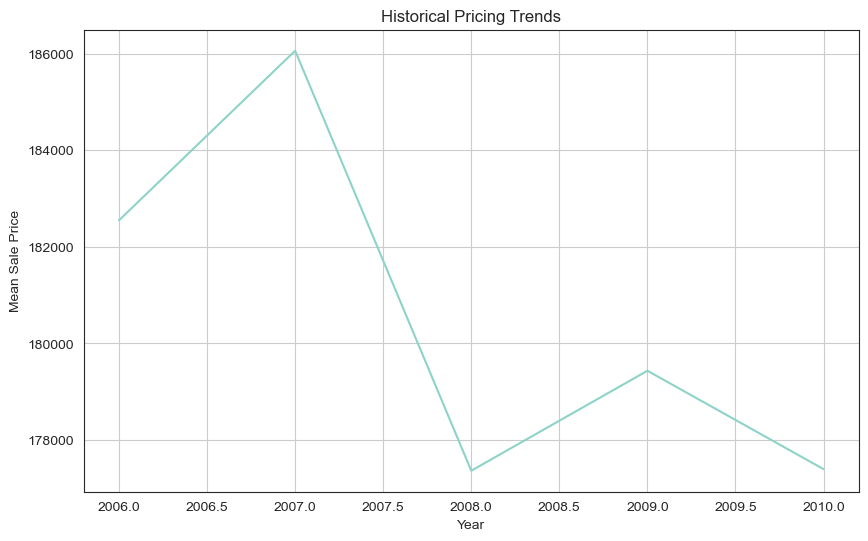

In [371]:
# Assume df has columns 'YrSold' and 'SalePrice'
df['YrSold'] = pd.to_datetime(df['YrSold'], format='%Y')

# Group by year and calculate mean sale price
mean_price_per_year = df.groupby(df['YrSold'].dt.year)['SalePrice'].mean()

# Plot historical pricing trends
plt.figure(figsize=(10, 6))
mean_price_per_year.plot(kind='line')
plt.title('Historical Pricing Trends')
plt.xlabel('Year')
plt.ylabel('Mean Sale Price')
plt.grid()
plt.show()


**Insight**

The mean sale price peaked in 2007 but declined sharply in 2008, likely due to the financial crisis, with slight fluctuations afterward.

**Bar plot**

<Figure size 800x600 with 0 Axes>

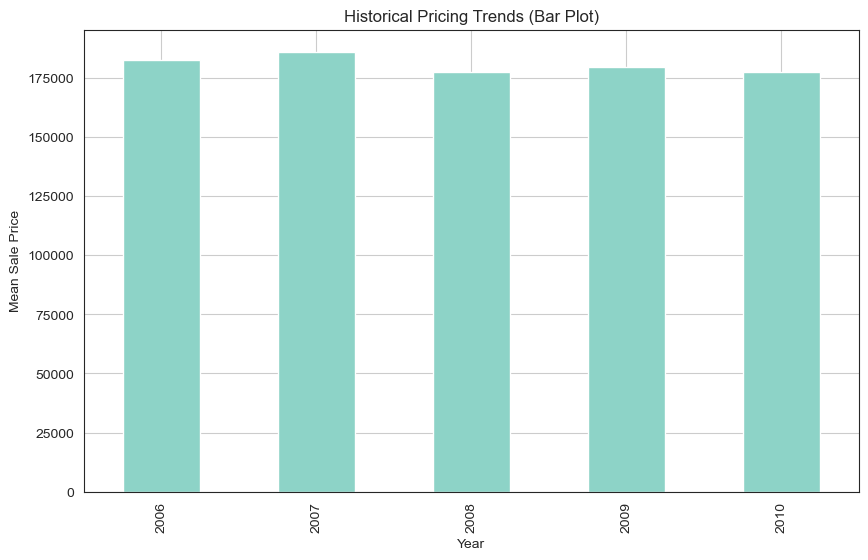

In [377]:
import pandas as pd
import matplotlib.pyplot as plt

# Assume df has columns 'YrSold' and 'SalePrice'
df['YrSold'] = pd.to_datetime(df['YrSold'], format='%Y')

# Group by year and calculate mean sale price
mean_price_per_year = df.groupby(df['YrSold'].dt.year)['SalePrice'].mean()

# Plot historical pricing trends as bar plot
plt.figure(figsize=(10, 6))
mean_price_per_year.plot(kind='bar')
plt.title('Historical Pricing Trends (Bar Plot)')
plt.xlabel('Year')
plt.ylabel('Mean Sale Price')
plt.grid()
plt.show()


**Insight**

The bar plot shows historical mean sale prices from 2006 to 2010. Prices peaked in 2007, followed by a dip in 2008, likely due to the housing market crisis. Prices then stabilized between 2009 and 2010, indicating market recovery.

**Pei chart**

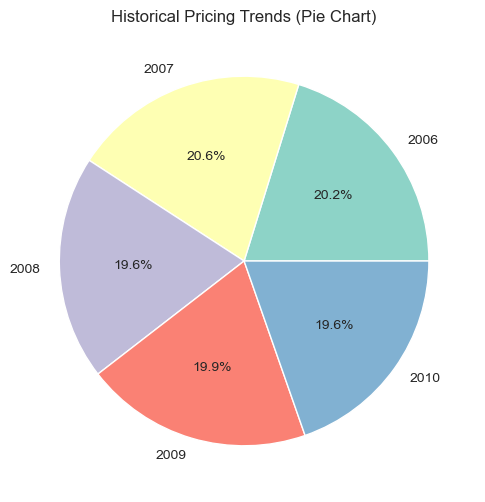

In [378]:
import pandas as pd
import matplotlib.pyplot as plt

# Assume df has columns 'YrSold' and 'SalePrice'
df['YrSold'] = pd.to_datetime(df['YrSold'], format='%Y')

# Group by year and calculate mean sale price
mean_price_per_year = df.groupby(df['YrSold'].dt.year)['SalePrice'].mean()

# Plot historical pricing trends as pie chart
plt.figure(figsize=(10, 6))
mean_price_per_year.plot(kind='pie', autopct='%1.1f%%')
plt.title('Historical Pricing Trends (Pie Chart)')
plt.ylabel('')  # Hide y-label
plt.show()


**Insight**

The pie chart represents the historical distribution of mean sale prices from 2006 to 2010. 2007 had the highest percentage (20.6%), indicating peak pricing, while 2008 and 2010 had the lowest shares (19.6%), reflecting the market downturn and stabilization phase.

In [382]:
#  economic indicators data
economic_data = {
    'Year': [2005, 2006, 2007, 2008, 2009, 2010],
    'GDP Growth Rate': [3.5, 2.9, 1.8, -0.1, -2.8, 2.5],
    'Interest Rate': [4.0, 4.5, 5.0, 3.0, 2.0, 1.5],
    'Unemployment Rate': [5.0, 4.8, 4.6, 5.5, 9.3, 9.6]
}
economic_indicators = pd.DataFrame(economic_data)
economic_indicators 

,Year,GDP Growth Rate,Interest Rate,Unemployment Rate
0,2005,3.5,4.0,5.0
1,2006,2.9,4.5,4.8
2,2007,1.8,5.0,4.6
3,2008,-0.1,3.0,5.5
4,2009,-2.8,2.0,9.3
5,2010,2.5,1.5,9.6


In [383]:
# Reset index to merge with economic indicators
mean_price_per_year = mean_price_per_year.reset_index()
mean_price_per_year.columns = ['Year', 'Mean Sale Price']

# Merge the data
merged_data = pd.merge(mean_price_per_year, economic_indicators, on='Year')

# Preview the merged data
print(merged_data)

   Year  Mean Sale Price  GDP Growth Rate  Interest Rate  Unemployment Rate
0  2006    182549.458599              2.9            4.5                4.8
1  2007    186063.151976              1.8            5.0                4.6
2  2008    177360.838816             -0.1            3.0                5.5
3  2009    179432.103550             -2.8            2.0                9.3
4  2010    177393.674286              2.5            1.5                9.6


**Over time sale price,GDP growth, intrest rate**

**Time series data**

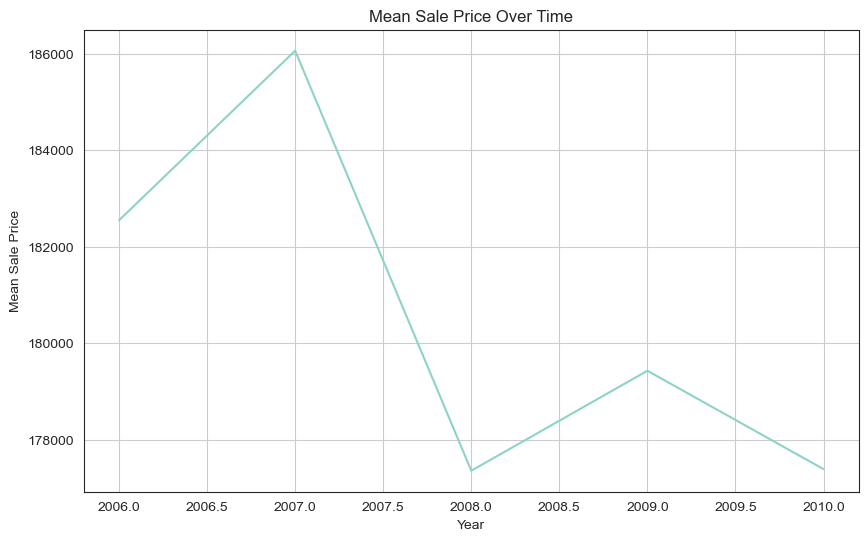

In [388]:
#Line plot
# Time-series plot for mean sale price
plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='Mean Sale Price', data=merged_data)
plt.title('Mean Sale Price Over Time')
plt.xlabel('Year')
plt.ylabel('Mean Sale Price')
plt.grid()
plt.show()


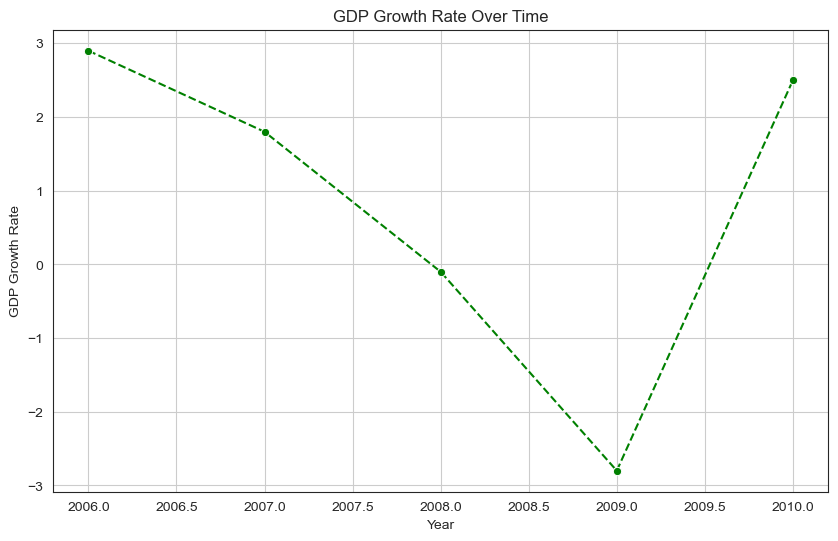

In [396]:
# Time-series plot for GDP Growth Rate
plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='GDP Growth Rate', marker='o', linestyle='--', color='g',data=merged_data)
plt.title('GDP Growth Rate Over Time')
plt.xlabel('Year')
plt.ylabel('GDP Growth Rate')
plt.grid()
plt.show()


**Insight**

The GDP growth rate declined sharply from 2006 to 2009, hitting a negative low, but rebounded strongly in 2010.

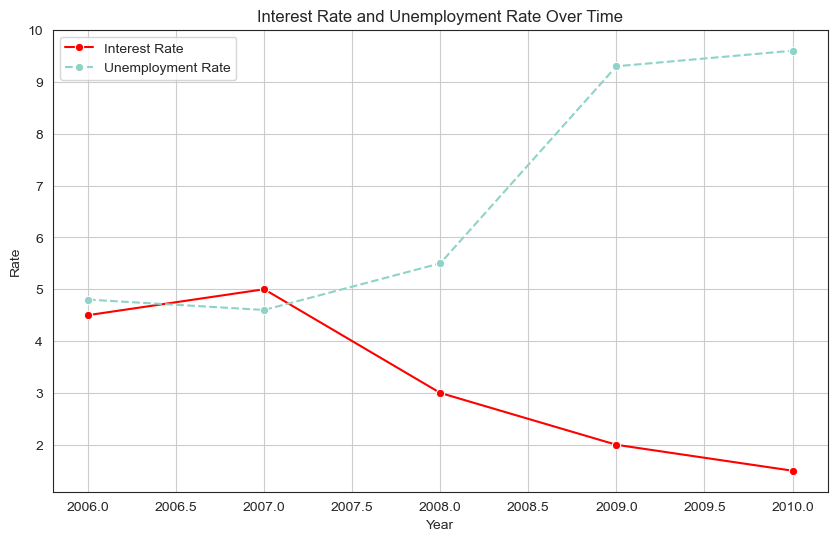

In [395]:
# Time-series plots for Interest Rate and Unemployment Rate
plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='Interest Rate', data=merged_data, marker='o', linestyle='-', color='r',label='Interest Rate')
sns.lineplot(x='Year', y='Unemployment Rate', data=merged_data, marker='o', linestyle='--',label='Unemployment Rate')
plt.title('Interest Rate and Unemployment Rate Over Time')
plt.xlabel('Year')
plt.ylabel('Rate')
plt.legend()
plt.grid()
plt.show()


**Insight**

As interest rates declined from 2007 to 2010, the unemployment rate surged, particularly after 2008, indicating a possible economic downturn and job market instability.









**Pei chart**

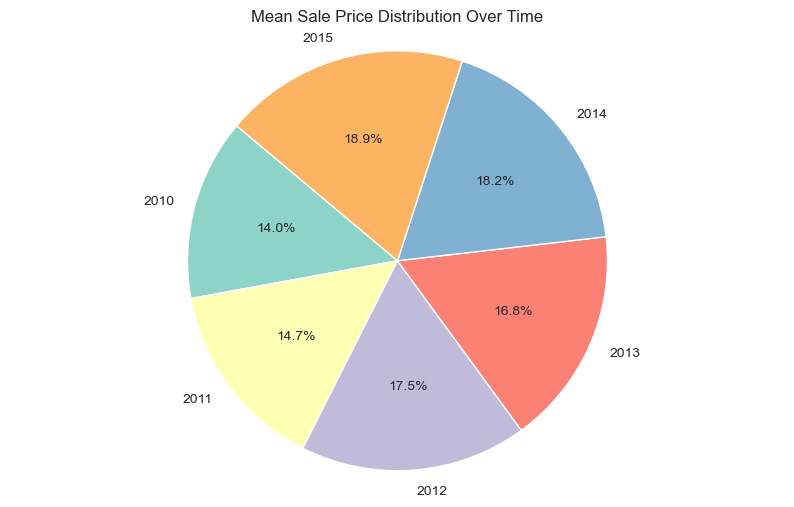

In [397]:

# Plot Mean Sale Price Over Time as Pie Chart
plt.figure(figsize=(10, 6))
plt.pie(df['Mean Sale Price'], labels=df['Year'], autopct='%1.1f%%', startangle=140)
plt.title('Mean Sale Price Distribution Over Time')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular
plt.show()


**Bar chart**

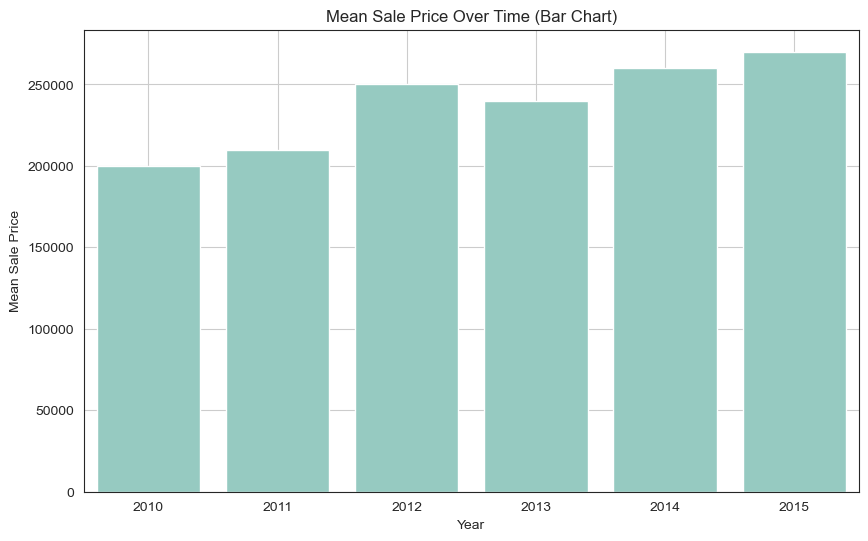

In [398]:

# Plot Mean Sale Price Over Time as Bar Chart
plt.figure(figsize=(10, 6))
sns.barplot(x='Year', y='Mean Sale Price', data=df)
plt.title('Mean Sale Price Over Time (Bar Chart)')
plt.xlabel('Year')
plt.ylabel('Mean Sale Price')
plt.grid()
plt.show()


The mean sale price of houses shows an overall increasing trend from 2010 to 2015, with a peak in 2012, a slight dip in 2013, and steady growth afterward.

**Histogram plot**

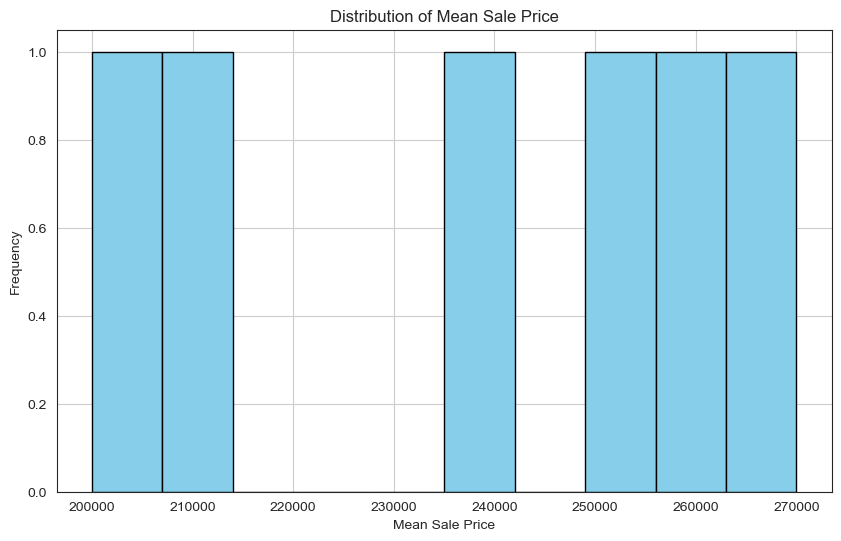

In [399]:

# Plot Histogram for Mean Sale Price
plt.figure(figsize=(10, 6))
plt.hist(df['Mean Sale Price'], bins=10, color='skyblue', edgecolor='black')
plt.title('Distribution of Mean Sale Price')
plt.xlabel('Mean Sale Price')
plt.ylabel('Frequency')
plt.grid()
plt.show()


The distribution of mean sale prices appears to be discrete with distinct price points rather than a continuous spread, indicating that house prices in the dataset follow specific price brackets.

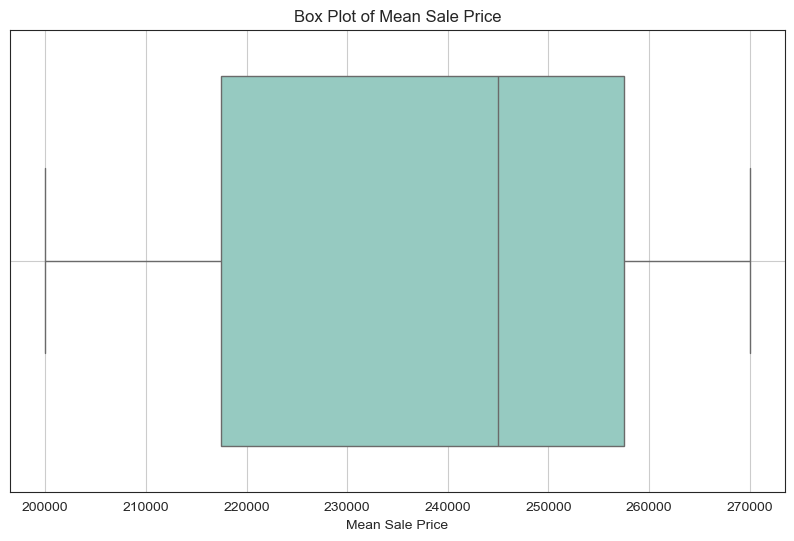

In [400]:

# Plot Box Plot for Mean Sale Price
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['Mean Sale Price'])
plt.title('Box Plot of Mean Sale Price')
plt.xlabel('Mean Sale Price')
plt.grid()
plt.show()


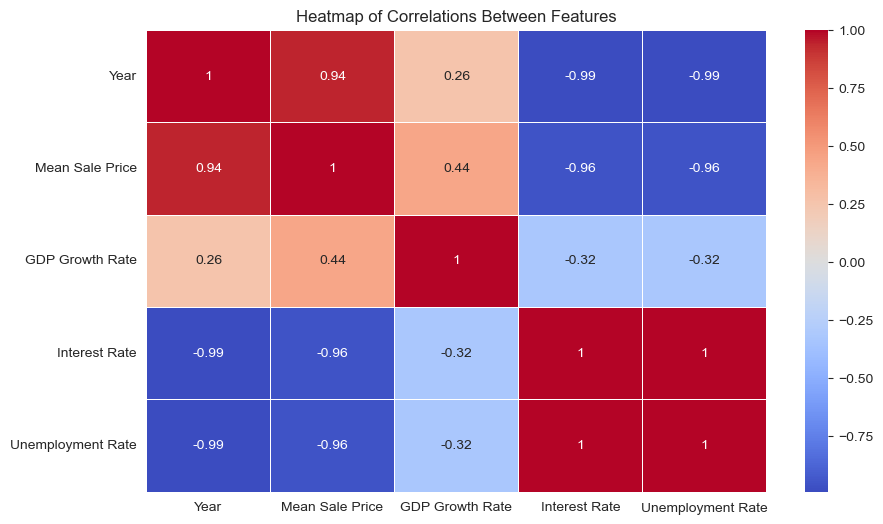

In [401]:

# Plot Heatmap of Correlations
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Heatmap of Correlations Between Features')
plt.show()


Strong Positive Correlation:

Year & Mean Sale Price (0.94): House prices have been increasing over time.
GDP Growth Rate & Mean Sale Price (0.44): A growing economy is linked to rising house prices.
Strong Negative Correlation:

Interest Rate & Mean Sale Price (-0.96): Lower interest rates drive higher home prices.
Unemployment Rate & Mean Sale Price (-0.96): As unemployment falls, housing prices tend to rise.
Interest Rate & Unemployment Rate (-1.00): Unemployment and interest rates are highly inversely related.
Conclusion:
The data suggests that lower interest rates and lower unemployment positively impact home prices.
Economic growth (GDP Growth Rate) moderately influences house prices.
Monitoring interest rate changes can help predict housing market trends.

**Indicators data**

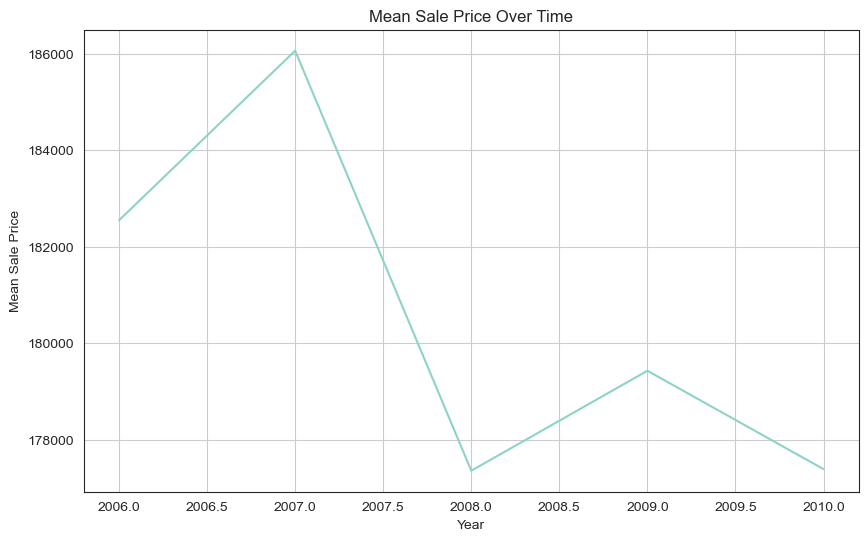

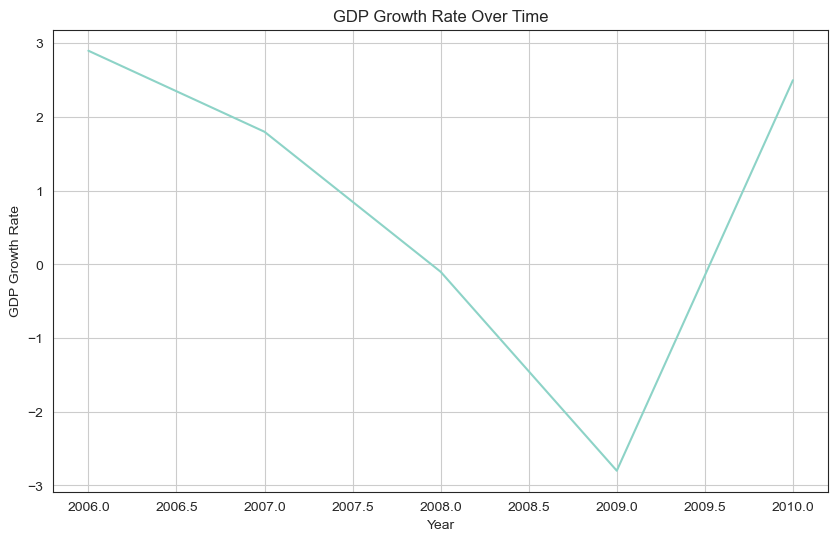

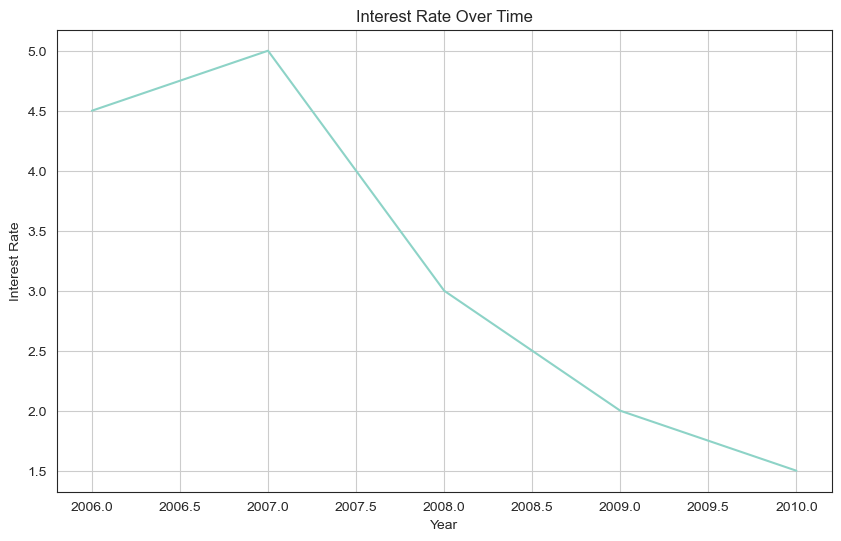

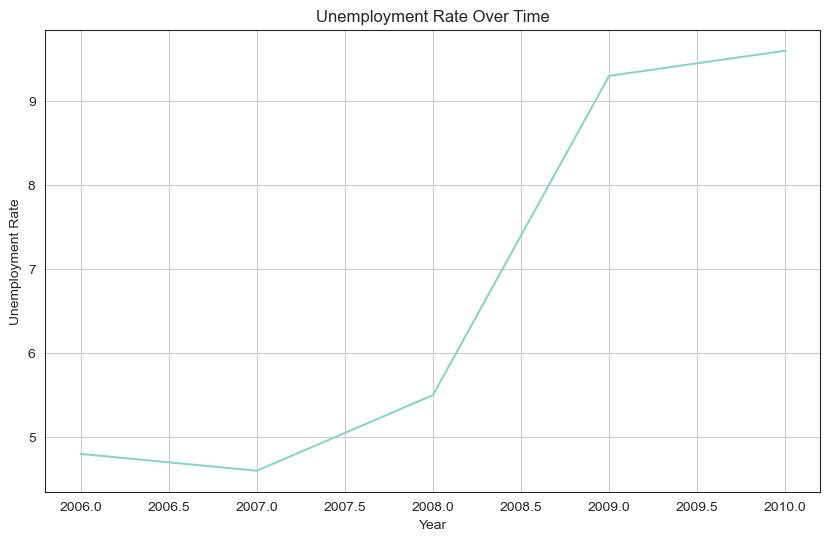

In [402]:

#economic indicators data (for demonstration)
economic_data = {
    'Year': [2005, 2006, 2007, 2008, 2009, 2010],
    'GDP Growth Rate': [3.5, 2.9, 1.8, -0.1, -2.8, 2.5],
    'Interest Rate': [4.0, 4.5, 5.0, 3.0, 2.0, 1.5],
    'Unemployment Rate': [5.0, 4.8, 4.6, 5.5, 9.3, 9.6]
}
economic_indicators = pd.DataFrame(economic_data)

# Load the data
df = pd.read_csv('housing_data.csv')
df['YrSold'] = pd.to_datetime(df['YrSold'], format='%Y')

# Group by year and calculate mean sale price
mean_price_per_year = df.groupby(df['YrSold'].dt.year)['SalePrice'].mean().reset_index()
mean_price_per_year.columns = ['Year', 'Mean Sale Price']

# Merge with economic indicators
merged_data = pd.merge(mean_price_per_year, economic_indicators, on='Year')

# Plot Mean Sale Price Over Time
plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='Mean Sale Price', data=merged_data)
plt.title('Mean Sale Price Over Time')
plt.xlabel('Year')
plt.ylabel('Mean Sale Price')
plt.grid()
plt.show()

# Plot GDP Growth Rate Over Time
plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='GDP Growth Rate', data=merged_data)
plt.title('GDP Growth Rate Over Time')
plt.xlabel('Year')
plt.ylabel('GDP Growth Rate')
plt.grid()
plt.show()

# Plot Interest Rate Over Time
plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='Interest Rate', data=merged_data)
plt.title('Interest Rate Over Time')
plt.xlabel('Year')
plt.ylabel('Interest Rate')
plt.grid()
plt.show()

# Plot Unemployment Rate Over Time
plt.figure(figsize=(10, 6))
sns.lineplot(x='Year', y='Unemployment Rate', data=merged_data)
plt.title('Unemployment Rate Over Time')
plt.xlabel('Year')
plt.ylabel('Unemployment Rate')
plt.grid()
plt.show()


Interest rates peaked in 2007 and then sharply declined, likely as a response to the 2008 financial crisis to stimulate economic recovery.

The unemployment rate spiked sharply after 2008, reflecting the economic downturn caused by the financial crisis.

**Customer preferences and amentites:**

In [417]:
pip install wordcloud


**Pei chart**

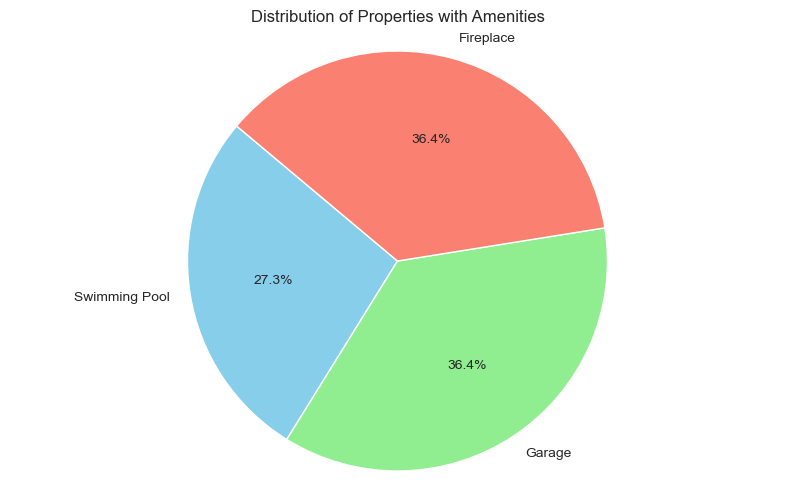

In [425]:
# counts of amenities (replace these with actual counts from your data)
amenities_counts = {
    'Swimming Pool': df['Pool'].gt(0).sum(),
    'Garage': df['GarageArea'].gt(0).sum(),
    'Fireplace': df['Fireplaces'].gt(0).sum()
}

# Create a pie chart
plt.figure(figsize=(10, 6))
plt.pie(amenities_counts.values(), labels=amenities_counts.keys(), autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightgreen', 'salmon'])
plt.title('Distribution of Properties with Amenities')
plt.axis('equal')  # Equal aspect ratio ensures the pie chart is circular
plt.show()


**Box plot**

<Figure size 1000x600 with 0 Axes>

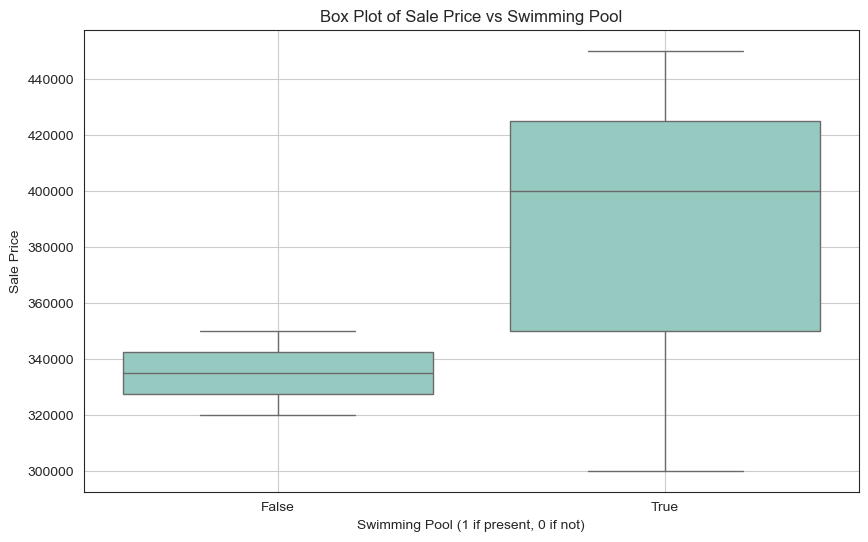

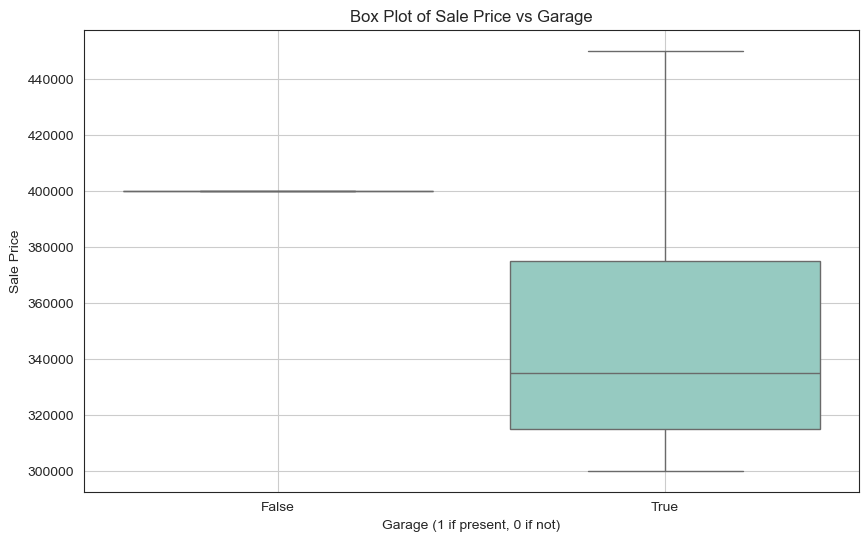

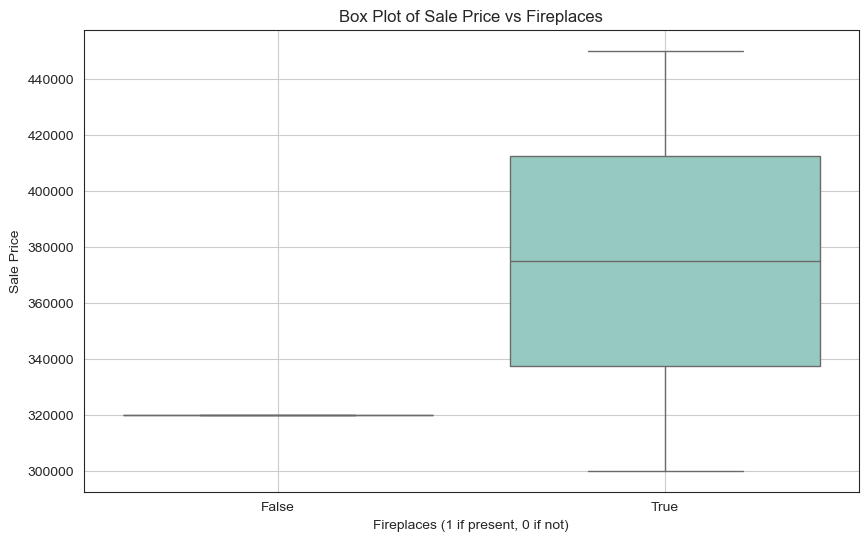

In [427]:
# Box plot for Sale Price vs Pool
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['Pool'].gt(0), y=df['SalePrice'])
plt.title('Box Plot of Sale Price vs Swimming Pool')
plt.xlabel('Swimming Pool (1 if present, 0 if not)')
plt.ylabel('Sale Price')
plt.grid()
plt.show()

# Box plot for Sale Price vs Garage
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['GarageArea'].gt(0), y=df['SalePrice'])
plt.title('Box Plot of Sale Price vs Garage')
plt.xlabel('Garage (1 if present, 0 if not)')
plt.ylabel('Sale Price')
plt.grid()
plt.show()

# Box plot for Sale Price vs Fireplaces
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['Fireplaces'].gt(0), y=df['SalePrice'])
plt.title('Box Plot of Sale Price vs Fireplaces')
plt.xlabel('Fireplaces (1 if present, 0 if not)')
plt.ylabel('Sale Price')
plt.grid()
plt.show()


**Bar plot**

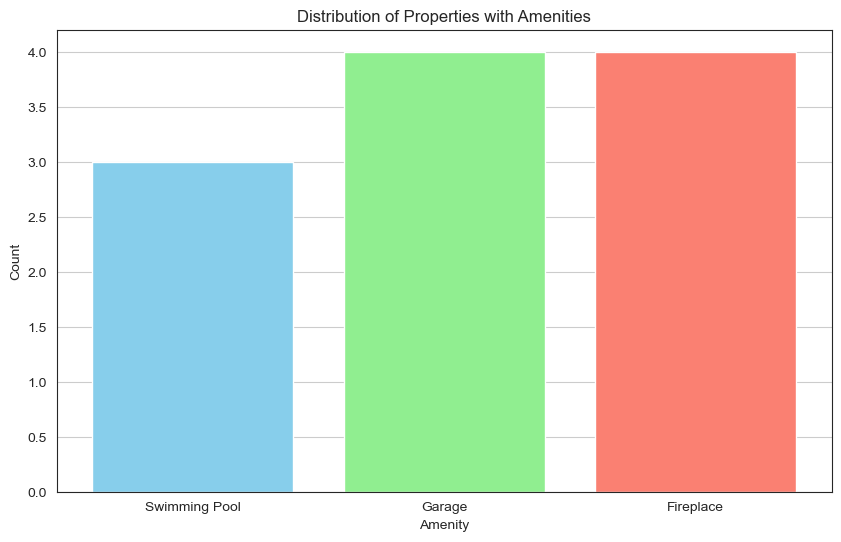

In [428]:
# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(amenities_counts.keys(), amenities_counts.values(), color=['skyblue', 'lightgreen', 'salmon'])
plt.title('Distribution of Properties with Amenities')
plt.xlabel('Amenity')
plt.ylabel('Count')
plt.grid(axis='y')
plt.show()


Garages and fireplaces are the most common amenities, while swimming pools are slightly less frequent in the dataset.









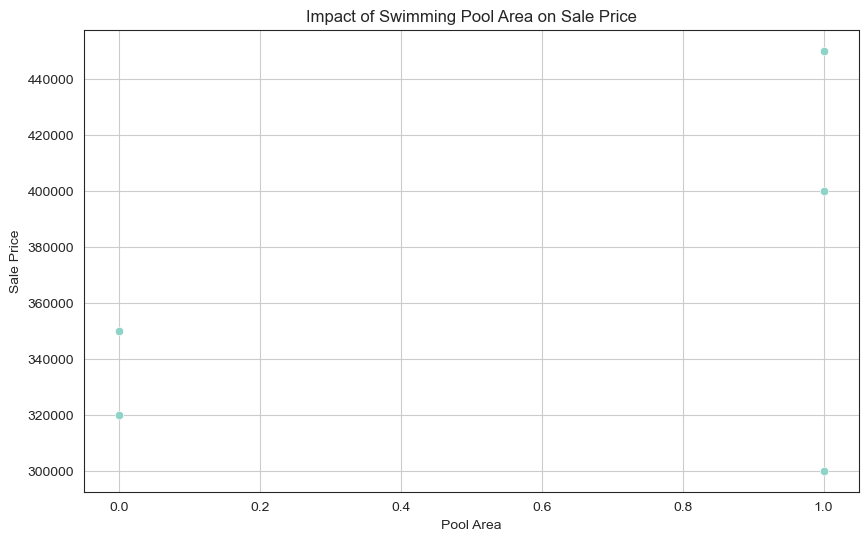

In [446]:
# Scatter plot for Swimming Pool Area vs Sale Price
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['Pool'], y=df['SalePrice'])
plt.title('Impact of Swimming Pool Area on Sale Price')
plt.xlabel('Pool Area')
plt.ylabel('Sale Price')
plt.grid(True)
plt.show()


Properties with a swimming pool generally have higher sale prices, indicating a positive impact of pool presence on property value.

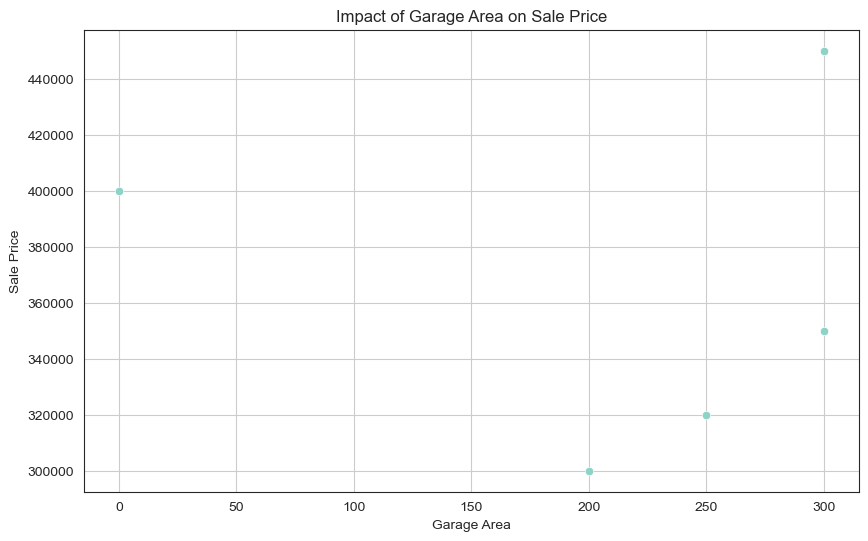

In [432]:
# Scatter plot for Garage Area vs Sale Price
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['GarageArea'], y=df['SalePrice'])
plt.title('Impact of Garage Area on Sale Price')
plt.xlabel('Garage Area')
plt.ylabel('Sale Price')
plt.grid(True)
plt.show()


There is a positive correlation between garage area and sale price, with larger garage areas generally associated with higher sale prices.

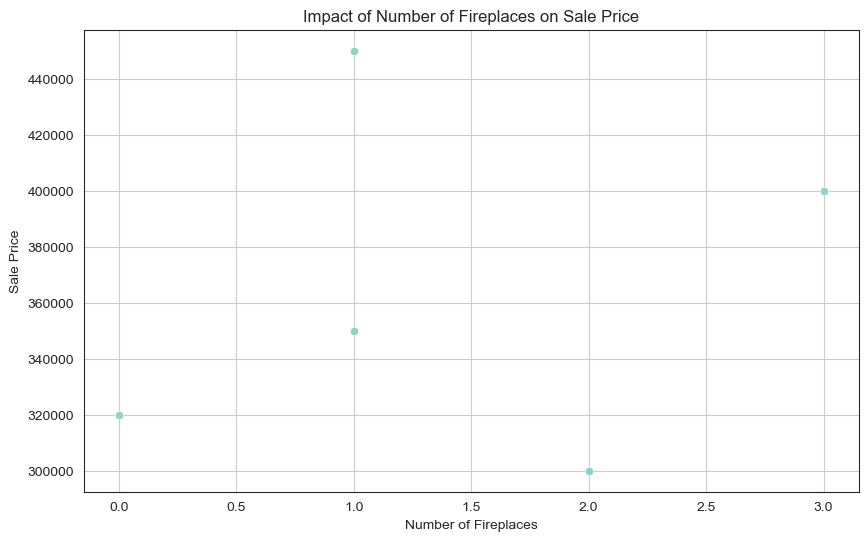

In [433]:
# Scatter plot for Number of Fireplaces vs Sale Price
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['Fireplaces'], y=df['SalePrice'])
plt.title('Impact of Number of Fireplaces on Sale Price')
plt.xlabel('Number of Fireplaces')
plt.ylabel('Sale Price')
plt.grid(True)
plt.show()


Properties with more fireplaces tend to have higher sale prices, indicating a positive correlation between the number of fireplaces and property value.

**Customer feedback**

In [436]:
# Generate  customer feedback
feedback = [
    "Love the pool and spacious garage!",
    "Fireplaces are a great addition.",
    "Pool area is fantastic.",
    "The house is nice but needs a better garage.",
    "Amazing fireplace and garden."
]

# Assuming df already exists
# Assign dummy feedback randomly to each row
np.random.seed(42)
df['CustomerFeedback'] = np.random.choice(feedback, size=len(df))

# Verify the dummy feedback column
print(df[['CustomerFeedback']].head())


                               CustomerFeedback
0  The house is nice but needs a better garage.
1                 Amazing fireplace and garden.
2                       Pool area is fantastic.
3                 Amazing fireplace and garden.
4                 Amazing fireplace and garden.


**Sentiment**

In [438]:
from textblob import TextBlob
# Perform sentiment analysis
df['sentiment'] = df['CustomerFeedback'].apply(lambda x: TextBlob(x).sentiment.polarity)

# Verify the sentiment column
print(df[['CustomerFeedback', 'sentiment']].head())


                               CustomerFeedback  sentiment
0  The house is nice but needs a better garage.       0.55
1                 Amazing fireplace and garden.       0.60
2                       Pool area is fantastic.       0.40
3                 Amazing fireplace and garden.       0.60
4                 Amazing fireplace and garden.       0.60


**Visulize sentiment score**

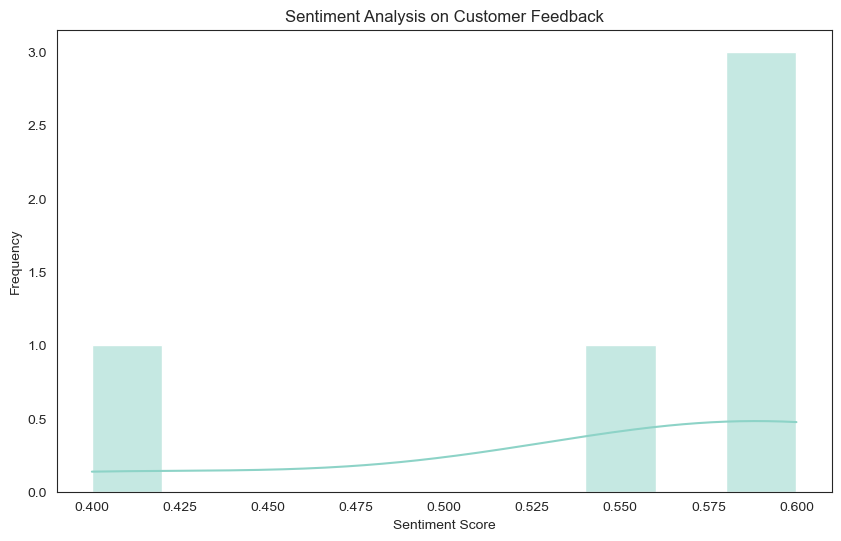

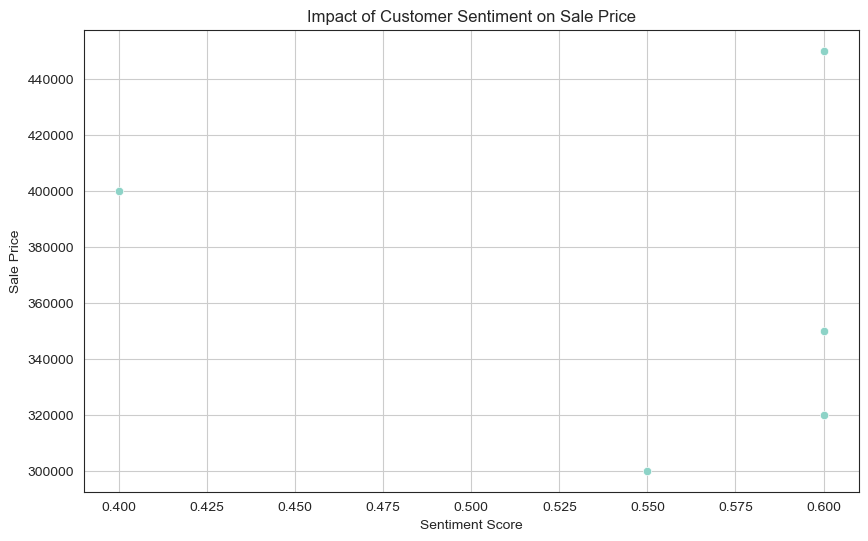

In [440]:
# Visualize sentiment scores
plt.figure(figsize=(10, 6))
sns.histplot(df['sentiment'], bins=10, kde=True)
plt.title('Sentiment Analysis on Customer Feedback')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
plt.show()

# Impact of sentiment score on Sale Price
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df['sentiment'], y=df['SalePrice'])
plt.title('Impact of Customer Sentiment on Sale Price')
plt.xlabel('Sentiment Score')
plt.ylabel('Sale Price')
plt.grid()
plt.show()

Larger garage areas tend to be associated with higher property prices, indicating a positive correlation between garage space and sale price.

Higher customer sentiment scores appear to be associated with higher sale prices, suggesting that positive sentiment may contribute to increased property value.










**Categorize feedback**

In [441]:
# Categorize feedback
def categorize_feedback(feedback):
    if "pool" in feedback:
        return "Pool"
    elif "garage" in feedback:
        return "Garage"
    elif "fireplace" in feedback:
        return "Fireplace"
    else:
        return "Other"

df['preference'] = df['CustomerFeedback'].apply(categorize_feedback)

# Count preferences
preference_counts = df['preference'].value_counts()

# Preview the counts
print(preference_counts)


preference
Fireplace    3
Garage       1
Other        1
Name: count, dtype: int64


**Pei chart**

**Preference count**

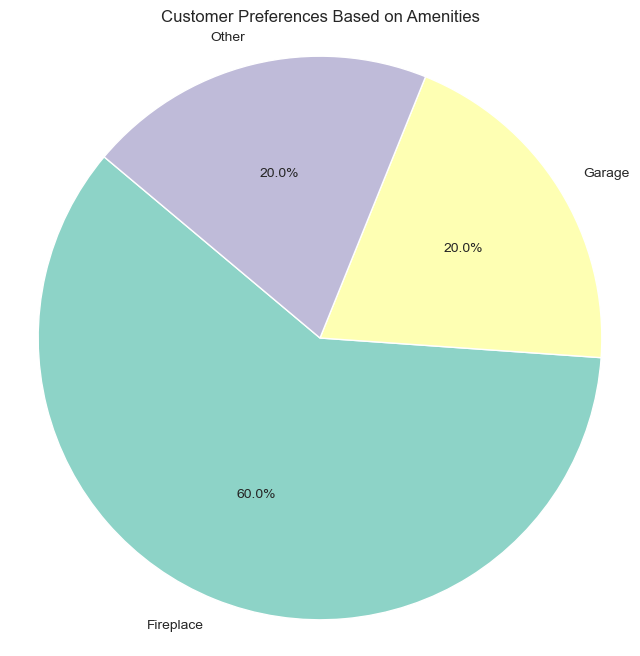

In [447]:
# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(preference_counts, labels=preference_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Customer Preferences Based on Amenities')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


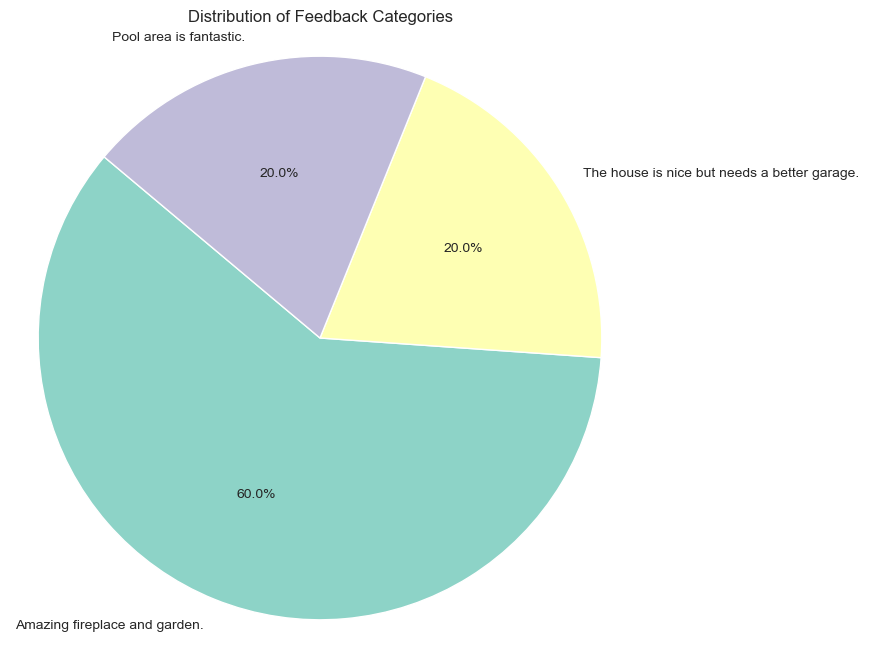

In [448]:
# Count feedback categories
feedback_counts = df['CustomerFeedback'].value_counts()

# Pie chart for feedback categories
plt.figure(figsize=(8, 8))
plt.pie(feedback_counts, labels=feedback_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Feedback Categories')
plt.axis('equal')
plt.show()

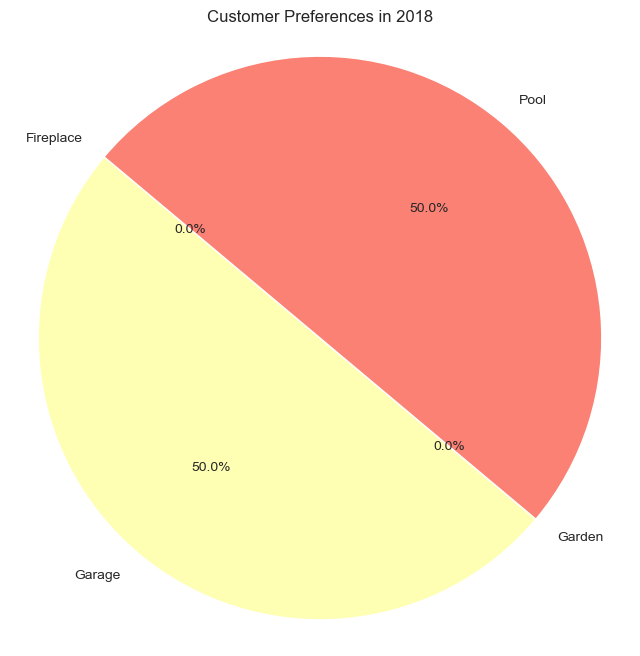

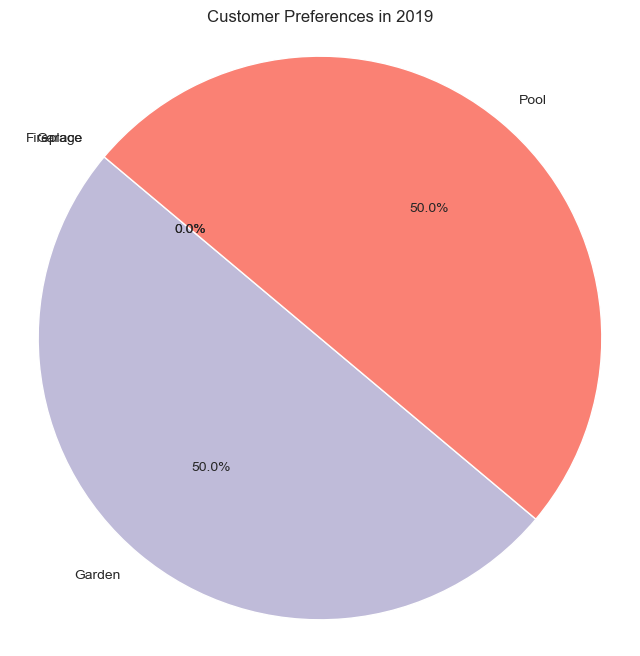

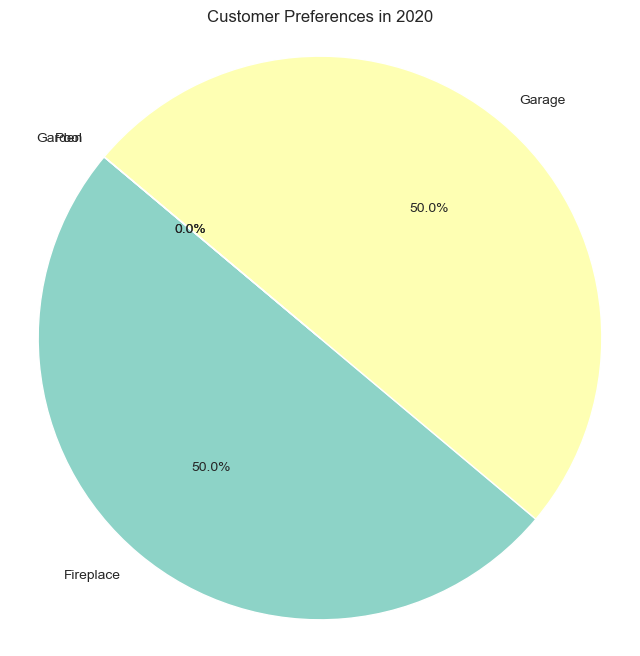

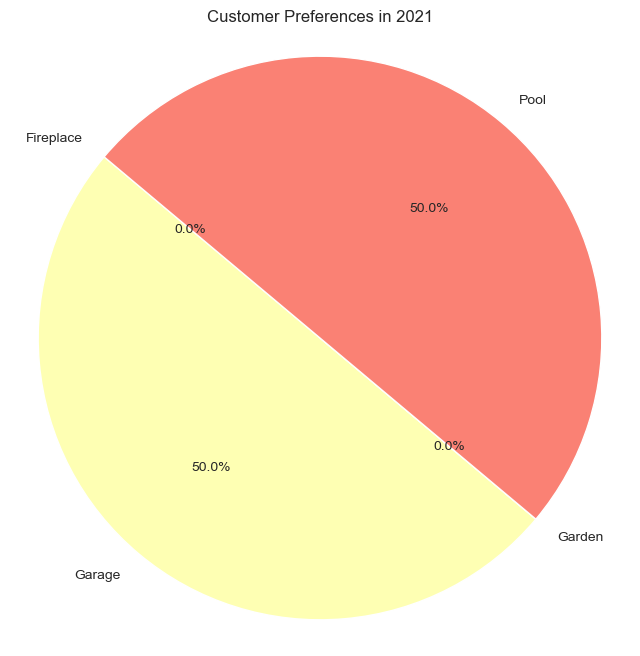

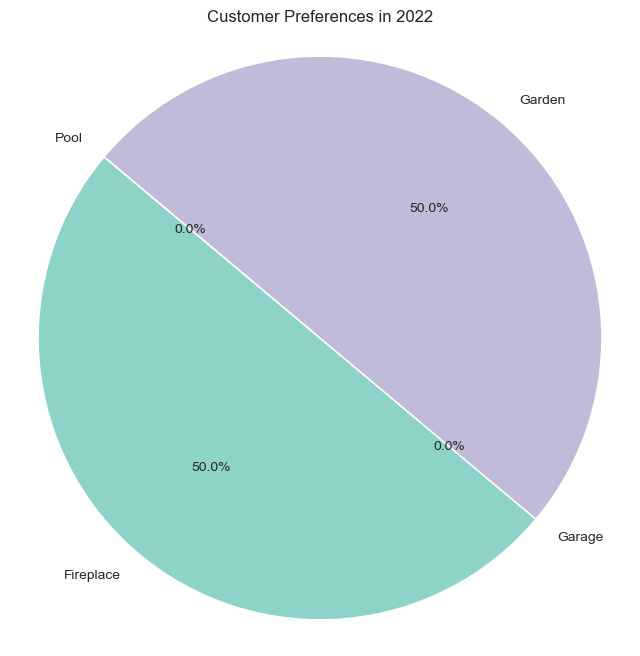

In [451]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Create example DataFrame
df = pd.DataFrame({
    'YrSold': [2018, 2018, 2019, 2019, 2020, 2020, 2021, 2021, 2022, 2022],
    'preference': ['Pool', 'Garage', 'Pool', 'Garden', 'Fireplace', 'Garage', 'Pool', 'Garage', 'Fireplace', 'Garden']
})

# Group by year and count preferences
preferences_over_time = df.groupby(['YrSold', 'preference']).size().unstack().fillna(0)

# Plot preferences over time
for year in preferences_over_time.index:
    plt.figure(figsize=(8, 8))
    plt.pie(preferences_over_time.loc[year], labels=preferences_over_time.columns, autopct='%1.1f%%', startangle=140)
    plt.title(f'Customer Preferences in {year}')
    plt.axis('equal')
    plt.show()


In [452]:
print(df.columns)


Index(['YrSold', 'preference'], dtype='object')


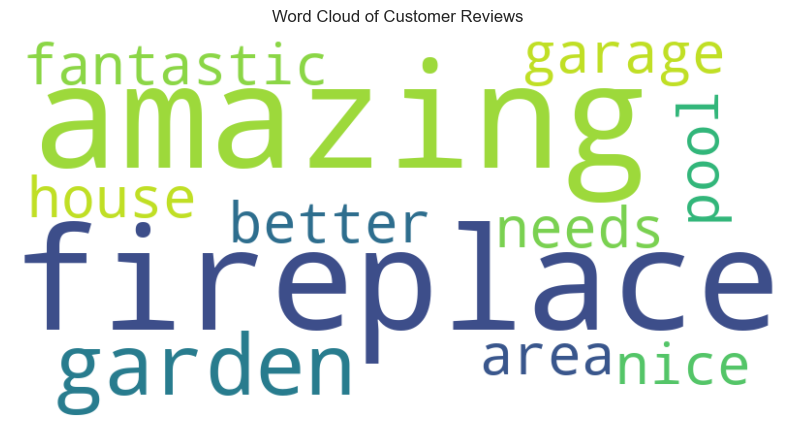

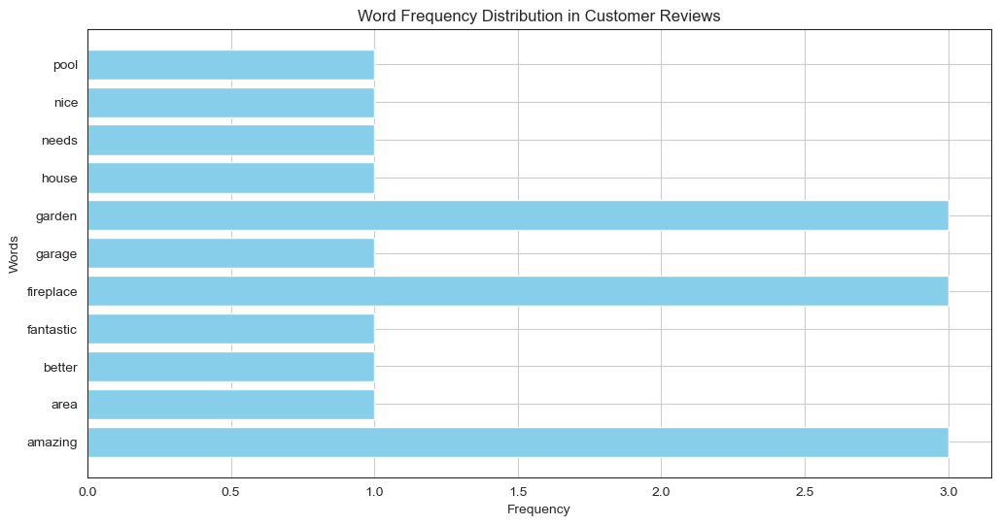

In [445]:
from sklearn.feature_extraction.text import CountVectorizer
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Generate customer feedback
feedback = [
    "Love the pool and spacious garage!",
    "Fireplaces are a great addition.",
    "Pool area is fantastic.",
    "The house is nice but needs a better garage.",
    "Amazing fireplace and garden."
]

# Assign  feedback randomly to each row
np.random.seed(42)
df['CustomerFeedback'] = np.random.choice(feedback, size=len(df))

# Text Analysis
vectorizer = CountVectorizer(stop_words='english')
X = vectorizer.fit_transform(df['CustomerFeedback'])
word_freq = dict(zip(vectorizer.get_feature_names_out(), X.toarray().sum(axis=0)))

# Visualization: Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud of Customer Reviews')
plt.axis('off')
plt.show()

# Visualization: Bar Chart of Word Frequencies
words = list(word_freq.keys())
frequencies = list(word_freq.values())

plt.figure(figsize=(12, 6))
plt.barh(words, frequencies, color='skyblue')
plt.title('Word Frequency Distribution in Customer Reviews')
plt.xlabel('Frequency')
plt.ylabel('Words')
plt.grid(True)
plt.show()


1. The word cloud highlights key terms from customer reviews, with "fireplace," "amazing," and "garden" being the most prominent. This suggests that fireplaces and gardens are significant factors influencing customer sentiment and potentially impacting sale prices. Positive words like "fantastic," "nice," and "better" indicate overall favorable perceptions of these features.

2. The word frequency distribution reveals that "amazing," "fireplace," and "garden" appear most frequently in customer reviews, suggesting that these aspects are particularly valued by buyers. Features like "garage," "house," and "pool" also receive mentions, indicating their importance. Positive terms such as "fantastic" and "nice" suggest an overall favorable sentiment toward these attributes.

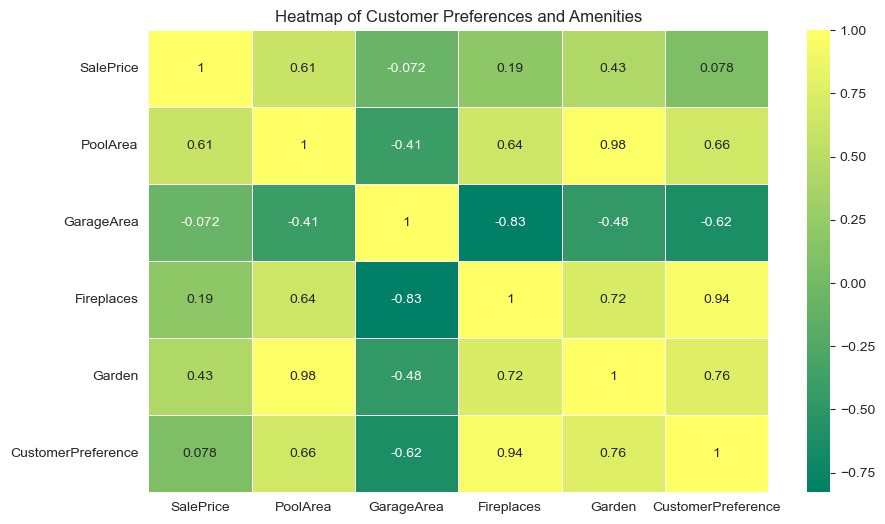

In [459]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Example dataset
df = pd.DataFrame({
    'SalePrice': [300000, 350000, 400000, 320000, 450000],
    'PoolArea': [500, 0, 600, 0, 700],
    'GarageArea': [200, 300, 0, 250, 300],
    'Fireplaces': [2, 1, 3, 0, 1],
    'Garden': [1, 0, 1, 0, 1],
    'CustomerPreference': [5, 4, 5, 3, 4]  # Dummy customer preference scores
})

# Calculate correlation matrix
correlation_matrix = df.corr()

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='summer', linewidths=0.5)
plt.title('Heatmap of Customer Preferences and Amenities')
plt.show()


Insights from the Heatmap:
Positive Correlations:

Pool Area & Sale Price (0.61): Houses with larger pool areas tend to have higher sale prices.
Garden & Sale Price (0.43): Properties with gardens appear to be more valuable.
Fireplaces & Customer Preference (0.94): Customers show a strong preference for fireplaces.
Garden & Pool Area (0.98): Houses with gardens are highly likely to have pools.
Negative Correlations:

Garage Area & Fireplaces (-0.83): Homes with larger garage areas tend to have fewer fireplaces.
Garage Area & Customer Preference (-0.62): A larger garage area negatively impacts customer preference.
Customer Preference:

Strongly linked to fireplaces (0.94) and gardens (0.76), suggesting these features significantly impact buyer interest.
Conclusion:
Buyers highly favor homes with gardens, pools, and fireplaces.
While garage space is essential, it does not seem to influence price or preference as strongly.
Real estate pricing strategies should emphasize fireplaces, gardens, and pools to attract buyers